# Simple PINN for an elastic plate with an elliptical hole 

## Geometry

We want to model a quarter of a plate with an elliptical hole. The domain itself is represented by collocation points, the boundaries are represented by uniformly sampled points along the perimeter.

In [39]:
import torch
from torch.optim.lr_scheduler import StepLR, ExponentialLR
import numpy as np
from scipy.stats import qmc
from plotly.express.colors import sequential
import plotly.graph_objects as go
import plotly.figure_factory as ff
from tqdm import tqdm
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
import pandas as pd
import seaborn as sns


torch.set_default_dtype(torch.float64)
from global_constants import L, R, MU, LBD, N1, N2

from new_plate_elliptic_hole import Plate 

# Elliptical axis in x direction
Rx = 0.14
Ry = R**2 / Rx
# Edge samples
N = 50 #40
# Number of collocation points
M = 500 #500

# Epochs
epochs = 11987#5000
# Batch size
batch_size = 64 #64
# Learning rate
lr = 0.0005 #0.001
# Scheduler step width
scheduler_step = 500
# Gamma factor of scheduler
scheduler_gamma = 0.6
expo_gamma = 0.9998
# Number of hidden neurons
hn = 256 #recommended by wang et al

#step width for updating weights
step_size = 1000
#HNEU_split*epochs ->moment for splitting total_NEU to NEU and HNEU 
HNEU_split = 0.0



def generate_radii_list(min_Ra_x, max_Ra_x, step):
    if step == 0:
        rad_x_list = [min_Ra_x, max_Ra_x]
    else:
        num_steps = int((max_Ra_x - min_Ra_x) / step) + 1
        rad_x_list = np.linspace(min_Ra_x, max_Ra_x, num_steps)
        rad_x_list = [round(rad_x, 2) for rad_x in rad_x_list]
    rad_y_list = []
    for rad_x in rad_x_list:
        rad_y_list.append(R**2 / rad_x)
    return rad_x_list, rad_y_list

def generate_multiple_plates(min_Ra_x, max_Ra_x, step_size):

    list_collo = torch.empty(0,3,requires_grad=True)
    list_top = torch.empty(0,3,requires_grad=True)
    list_right = torch.empty(0,3,requires_grad=True)
    list_left = torch.empty(0,3,requires_grad=True)
    list_bottom = torch.empty(0,3,requires_grad=True)
    list_hole = torch.empty(0,5,requires_grad=True)

    rad_x_list, rad_y_list = generate_radii_list(min_Ra_x, max_Ra_x, step_size)
    for rad_x in rad_x_list:
        p1 = Plate(rad_x, N, M)
        #data_one_plate -> [collocation, top, right, left, bottom, hole, n_hole]
        collo_points, top_points, right_points, left_points, bottom_points, hole_points = p1.generate_dataset()
        list_collo = torch.cat((list_collo, collo_points), dim=0)
        list_top = torch.cat((list_top, top_points), dim=0)
        list_right = torch.cat((list_right, right_points), dim=0)
        list_left = torch.cat((list_left, left_points), dim=0)
        list_bottom = torch.cat((list_bottom, bottom_points), dim=0)
        list_hole = torch.cat((list_hole, hole_points), dim=0)
        
    return list_collo, list_top, list_right, list_left, list_bottom, list_hole 

def generate_multiple_plates_dict(min_Ra_x, max_Ra_x):
    dict_plate_points = dict()
    tuples = [
            ("x_collo", 0, 0),
            ("y_collo", 0, 1),
            ("x_top", 1, 0),
            ("y_top", 1, 1),
            ("x_right", 2, 0),
            ("y_right", 2, 1),
            ("x_left", 3, 0),
            ("y_left", 3, 1),
            ("x_bottom", 4, 0),
            ("y_bottom", 4, 1),
            ("x_hole", 5, 0),
            ("y_hole", 5, 1),   
        ] 
    
    rad_x_list, rad_y_list = generate_radii_list(min_Ra_x, max_Ra_x, 0.01)
    for rad_x in rad_x_list:
        p1 = Plate(rad_x, N, M)
        #data_one_plate -> [collocation, top, right, left, bottom, hole, n_hole]
        data_one_plate = p1.generate_dataset()

        for tuple in tuples:
            key = tuple[0]
            dict_plate_points.setdefault(key, []).append(data_one_plate[tuple[1]][:,tuple[2]])
        #plotting one plate
        #p1.plot_plate_with_hole(*data_one_plate)
    for key in dict_plate_points: 
        #appending list of tensors to one tensor
        dict_plate_points[key] = torch.cat(dict_plate_points[key])
        print(key, "besteht aus",dict_plate_points[key].size(), "Datenpunkten")

    collo_points = torch.column_stack([dict_plate_points["x_collo"], dict_plate_points["y_collo"]])
    top_points = torch.column_stack([dict_plate_points["x_top"], dict_plate_points["y_top"]])
    right_points = torch.column_stack([dict_plate_points["x_right"], dict_plate_points["y_right"]])
    left_points = torch.column_stack([dict_plate_points["x_left"], dict_plate_points["y_left"]])
    bottom_points = torch.column_stack([dict_plate_points["x_bottom"], dict_plate_points["y_bottom"]])
    hole_points = torch.column_stack([dict_plate_points["x_hole"], dict_plate_points["y_hole"]])

    return collo_points, top_points, right_points, left_points, bottom_points, hole_points



p99 = Plate(0.14, N, M)
collocation, top, right, left, bottom, hole = p99.generate_dataset()
p99.plot_plate_with_hole(collocation, top, right, left, bottom, hole)


## The ANN model that approximates the displacement field

An ANN might be considered as a generic function approximator. In this case, it should approximated the function $u: \mathcal{R}^2 \rightarrow \mathcal{R}^2$ with five hidden layers having 20 neurons each.

In [40]:

class Net(torch.nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.input_layer = torch.nn.Linear(3, hn)
        self.hidden_layer1 = torch.nn.Linear(hn, hn)
        self.hidden_layer2 = torch.nn.Linear(hn, hn)
        self.hidden_layer3 = torch.nn.Linear(hn, hn)
        self.output_layer = torch.nn.Linear(hn, 2)
                    
        # #for weight initialization with glorot scheme            
        # for layer in [self.hidden_layer1, self.hidden_layer2, self.hidden_layer3, self.hidden_layer4]:
        #     torch.nn.init.xavier_normal_(layer.weight, gain=torch.nn.init.calculate_gain('tanh'))
        #     #sns.displot(m.weight.detach().numpy())
        #     if layer.bias is not None:
        #         layer.bias.detach().zero_()

        #for weight initialization with glorot scheme            
        for m in self.modules():
            if isinstance(m, torch.nn.Linear):
                old_weight = m.weight.clone()
                #sns.displot(old_weight.detach().numpy())
                torch.nn.init.xavier_normal_(m.weight, gain=torch.nn.init.calculate_gain('tanh'))
                #sns.displot(m.weight.detach().numpy())
                if m.bias is not None:
                    m.bias.detach().zero_()

                # Check if the weights have been changed
                if torch.equal(old_weight, m.weight):
                    print("The weights have not been changed")
                else:
                    print("The weights have been successfully changed.")
                    #sns.displot(layer.weight.detach().numpy())
                    plt.show()

        # # Random Weight Factorization: Initialize weights for hidden layers
        # for layer in [self.hidden_layer1, self.hidden_layer2, self.hidden_layer3, self.hidden_layer4]:
        #     old_weight = layer.weight.clone()
        #     #sns.displot(old_weight.detach().numpy())
        #     s, v = torch_factorized_xavier_normal(layer.weight)
        #     layer.weight.data = s * v
        #     if layer.bias is not None:
        #         layer.bias.data.zero_()

            # # Check if the weights have been changed
            # if torch.equal(old_weight, layer.weight):
            #     print("The weights have not been changed")
            # else:
            #     print("The weights have been successfully changed.")
            #     #sns.displot(layer.weight.detach().numpy())
            #     plt.show()



    def forward(self, inputs):
        input_out = torch.tanh(self.input_layer(inputs))
        layer1_out = torch.tanh(self.hidden_layer1(input_out))
        layer2_out = torch.tanh(self.hidden_layer2(layer1_out))
        layer3_out = torch.tanh(self.hidden_layer3(layer2_out))
        output = self.output_layer(layer3_out)
        return output
    
def torch_factorized_xavier_normal(layer_weight, mean=1.0, stddev=0.1):
    w = torch.nn.init.xavier_normal_(layer_weight, gain=torch.nn.init.calculate_gain('tanh'))
    s = torch.normal(mean, stddev, size=layer_weight[:,-1].shape)
    s = torch.exp(s)
    v = w / s
    return s, v


def reset_net_parameters(net):
    for layer in net.children():
        if hasattr(layer, 'reset_parameters'):
            layer.reset_parameters()

#reset all network parameters    
def weight_reset(m):
    reset_parameters = getattr(m, "reset_parameters", None)
    if callable(reset_parameters):
        m.reset_parameters()


#net is initilized in training 
# net = Net()


## The physics

We want to solve linear elasticity on the domain, which means ultimately that we want to minimize the residual of the following PDE 
$$\frac{\partial \sigma_{11}}{\partial x_1} + \frac{\partial \sigma_{12}}{\partial x_2} - b_1 = 0$$
$$\frac{\partial \sigma_{21}}{\partial x_1} + \frac{\partial \sigma_{22}}{\partial x_2} - b_2 = 0$$
with stress 
$$ \sigma_{ij} = 2\mu \varepsilon_{ij} + \lambda \varepsilon_{kk} \delta_{ij} $$
and strain 
$$ \varepsilon_{ij} = \frac{1}{2} \left( \frac{\partial u_i}{\partial x_j} +  \frac{\partial u_j}{\partial x_i}\right).$$

In [41]:
def epsilon(xyr):
    # Compute deformation gradient
    #inputs = torch.column_stack([x,y])
    dudx = torch.func.jacrev(net)(xyr)
    # print(np.shape(xx))
    # print(xx)
    return 0.5 * (dudx[:,:-1] + dudx[:,:-1].T)

# def epsilon(x):
#     # Compute deformation gradient
#     disp = net(x)
#     print(np.shape(disp))
#     print(disp)
#     u = disp[:,0]
#     v = disp[:,1]
#     u_x = torch.autograd.grad(u.sum(), x[:, 0], create_graph=True)[0]
#     v_x = torch.autograd.grad(v.sum(), x[:, 0], create_graph=True)[0]
#     u_y = torch.autograd.grad(u.sum(), x[:, 1], create_graph=True)[0]
#     v_y = torch.autograd.grad(v.sum(), x[:, 1], create_graph=True)[0]

#     gradx = torch.column_stack([u_x, v_x])
#     grady = torch.column_stack([u_y, v_y])
#     gradient = torch.stack([gradx, grady], dim=2)

#    return 0.5 * (gradient + torch.transpose(gradient, 1, 2))

def sigma(xyr):
    # Compute (small deformation) strain
    eps = epsilon(xyr)
    # Compute linear elastic strain (assuming plane stress)
    return 2.0 * MU * eps + (2*LBD*MU)/(2*MU+LBD) * torch.trace(eps) * torch.eye(2)


def pde_residual(xyr):
    # Compute stress gradient
    dsdx = torch.func.jacrev(sigma)(xyr)
    # Momentum balance in x direction
    residual_x = dsdx[0, 0, 0] + dsdx[0, 1, 1] 
    # Momentum balance in y direction
    residual_y = dsdx[1, 0, 0] + dsdx[1, 1, 1]
    return residual_x, residual_y

## Boundary conditions

Left: 

$$ u_1 = 0$$

Bottom: 

$$ u_2 = 0$$

Top: 

$$ \sigma \cdot n = N_2 n$$

Right: 

$$ \sigma \cdot n = N_1 n$$

In [42]:
mse = torch.nn.MSELoss()


def compute_physics_losses(complete_collo, top, right, left, bottom, hole):
    # pde
    res_x, res_y = torch.vmap(pde_residual)(complete_collo)
    zeros = torch.zeros_like(res_x)
    pde_error = mse((res_x), zeros) + mse((res_y), zeros)

    # left boundary
    pred_left = net(left)
    bc_left = torch.zeros_like(pred_left[:, 0])
    left_error = mse(pred_left[:, 0], bc_left)

    # bottom boundary
    pred_bottom = net(bottom)
    bc_bottom = torch.zeros_like(pred_bottom[:, 1])
    bottom_error = mse(pred_bottom[:, 1], bc_bottom)

    # top boundary
    pred_stress_top = torch.vmap(sigma)(top)
    pred_s_top_yy = pred_stress_top[:,1,1]
    pred_s_top_xy = pred_stress_top[:,0,1]
    s_top_yy = N2*torch.ones_like(pred_s_top_yy)
    s_top_xy = torch.zeros_like(pred_s_top_xy)
    top_error = mse(pred_s_top_yy, s_top_yy) + mse(pred_s_top_xy, s_top_xy)

    # right boundary
    pred_stress_right = torch.vmap(sigma)(right)
    pred_s_right_xx = pred_stress_right[:,0,0]
    pred_s_right_xy = pred_stress_right[:,1,0]
    s_right_xx = N1*torch.ones_like(pred_s_right_xx)
    s_right_xy = torch.zeros_like(pred_s_right_xy)
    right_error = mse(pred_s_right_xx, s_right_xx) + mse(pred_s_right_xy, s_right_xy)


    # hole boundary
    stress_hole = torch.vmap(sigma)(hole[:,:3])
    n_hole = hole[:,-2:]
    traction = torch.einsum("...ij,...j->...i", stress_hole, n_hole)
    zeros = torch.zeros_like(traction[:, 0])
    hole_error = mse(traction[:, 0], zeros) + mse(traction[:, 1], zeros)


    return (left_error, right_error, bottom_error, top_error, hole_error, pde_error)

## Training 

The weights have been successfully changed.
The weights have been successfully changed.
The weights have been successfully changed.
The weights have been successfully changed.
The weights have been successfully changed.
Starting with Adam optimizer...


 10%|█         | 999/9876 [26:22<3:53:48,  1.58s/it]

Epoch 1000, batch 0: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(30.0870)
L2 norm of gradient for neumann_losses_nd:  tensor(19.6317)
L2 norm of gradient for pde_losses_nd:  tensor(98.6952)
L2 norm of gradient for dirichlet_losses_nd:  tensor(78.1003)
Epoch 1000, batch 1: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(35.6358)
L2 norm of gradient for neumann_losses_nd:  tensor(21.0708)
L2 norm of gradient for pde_losses_nd:  tensor(102.4378)
L2 norm of gradient for dirichlet_losses_nd:  tensor(62.6529)
Epoch 1000, batch 2: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(30.2884)
L2 norm of gradient for neumann_losses_nd:  tensor(33.6011)
L2 norm of gradient for pde_losses_nd:  tensor(99.8187)
L2 norm of gradient for dirichlet_losses_nd:  tensor(77.6606)
Epoch 1000, batch 3: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(38.7401)
L2 norm of gradient for neumann_losses_nd

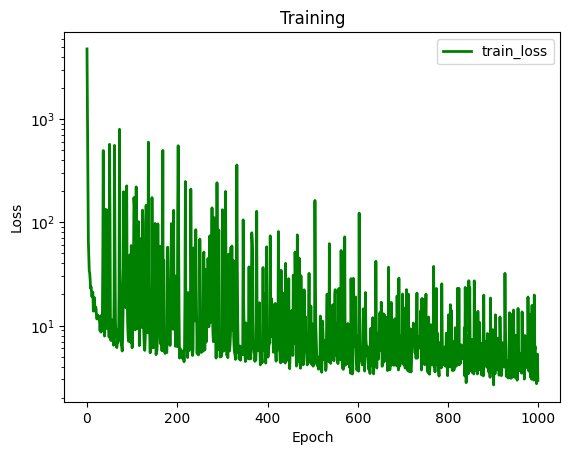

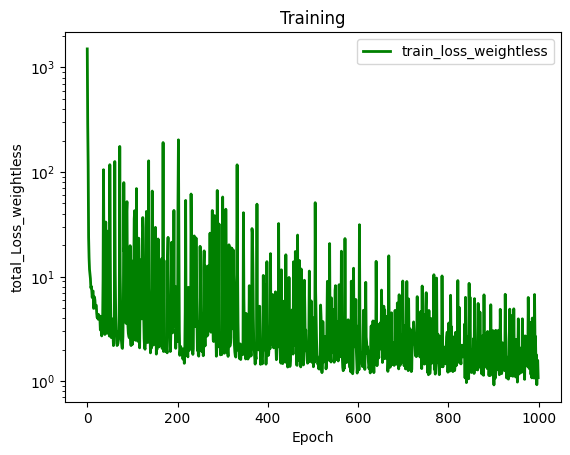

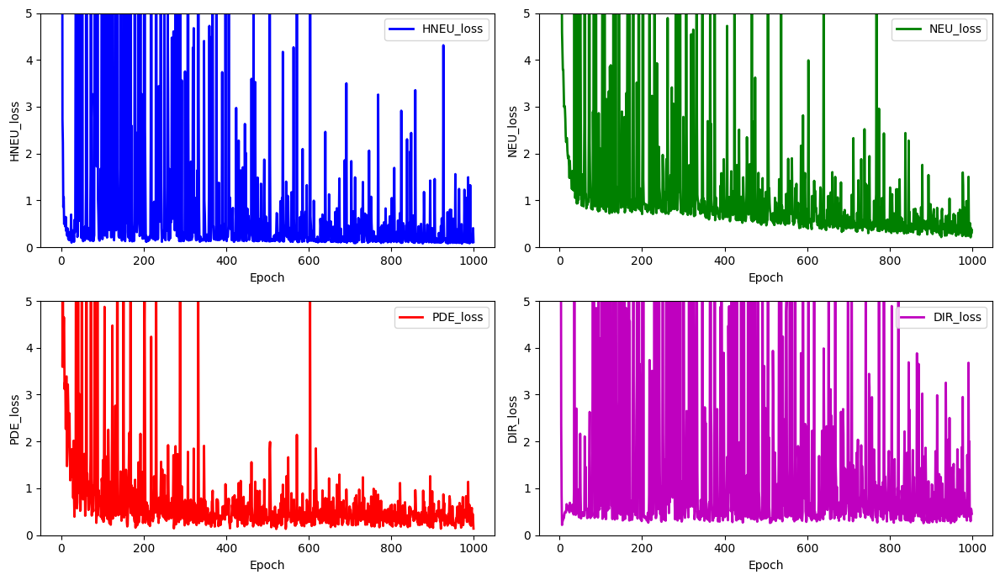

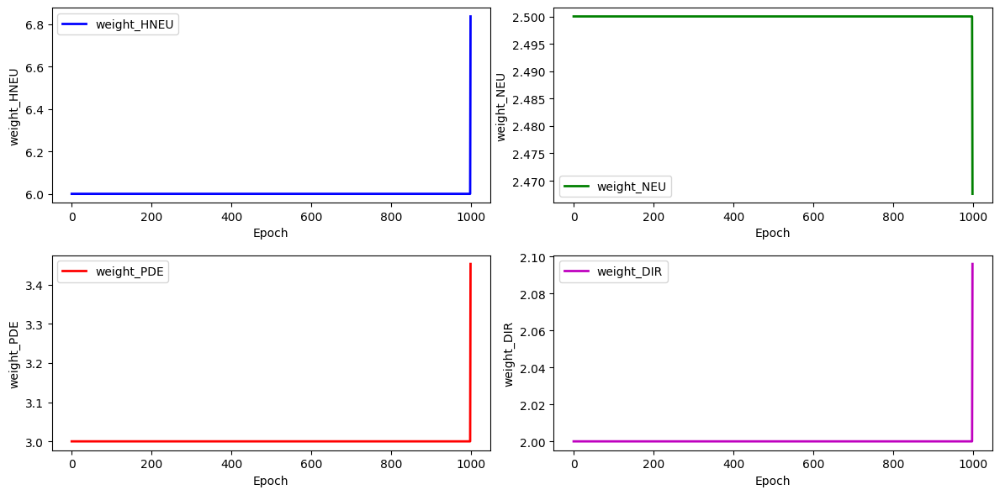

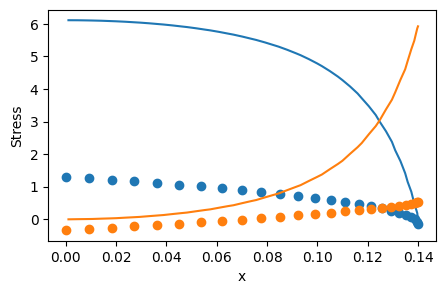

 20%|██        | 1999/9876 [52:54<3:26:40,  1.57s/it]

Epoch 2000, batch 0: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(1.2694)
L2 norm of gradient for neumann_losses_nd:  tensor(19.5248)
L2 norm of gradient for pde_losses_nd:  tensor(26.0957)
L2 norm of gradient for dirichlet_losses_nd:  tensor(23.8635)
Epoch 2000, batch 1: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(5.3575)
L2 norm of gradient for neumann_losses_nd:  tensor(19.2826)
L2 norm of gradient for pde_losses_nd:  tensor(26.3561)
L2 norm of gradient for dirichlet_losses_nd:  tensor(15.1124)
Epoch 2000, batch 2: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(5.1591)
L2 norm of gradient for neumann_losses_nd:  tensor(16.1475)
L2 norm of gradient for pde_losses_nd:  tensor(19.7043)
L2 norm of gradient for dirichlet_losses_nd:  tensor(33.7311)
Epoch 2000, batch 3: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(8.2548)
L2 norm of gradient for neumann_losses_nd:  te

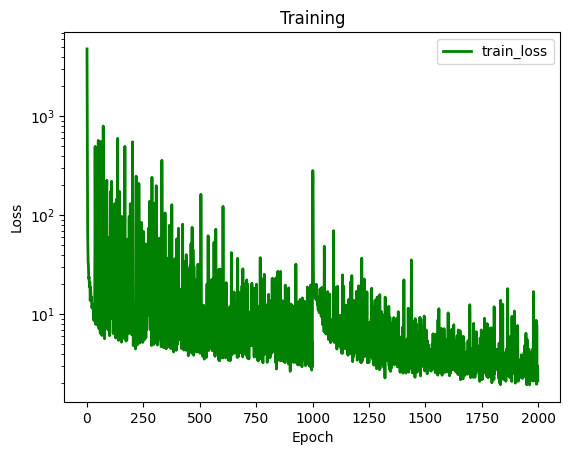

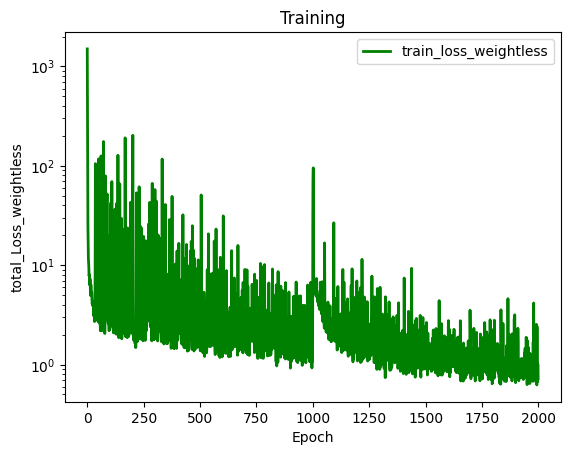

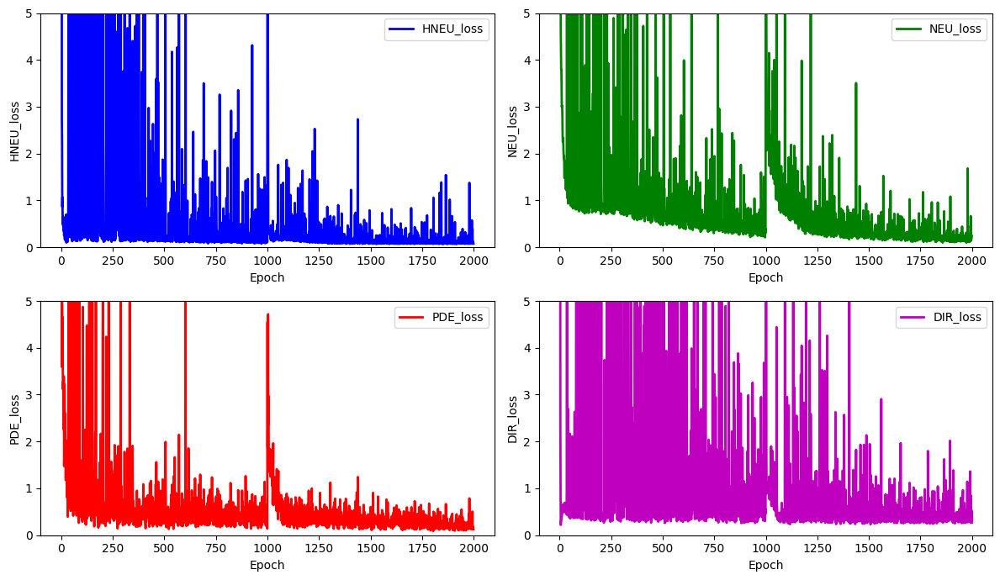

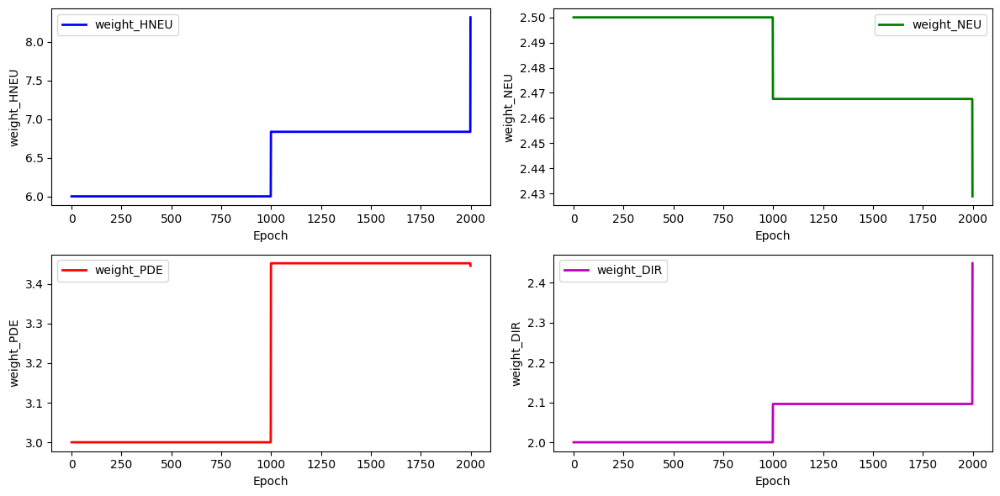

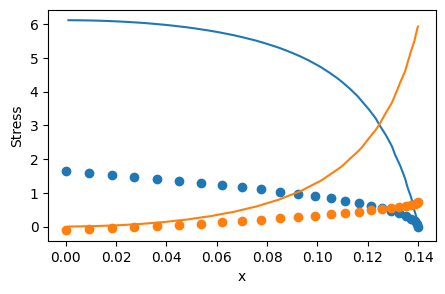

 30%|███       | 2999/9876 [1:19:16<3:00:43,  1.58s/it]

Epoch 3000, batch 0: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(2.5361)
L2 norm of gradient for neumann_losses_nd:  tensor(14.2307)
L2 norm of gradient for pde_losses_nd:  tensor(24.1490)
L2 norm of gradient for dirichlet_losses_nd:  tensor(12.3749)
Epoch 3000, batch 1: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(0.8270)
L2 norm of gradient for neumann_losses_nd:  tensor(7.4474)
L2 norm of gradient for pde_losses_nd:  tensor(9.9416)
L2 norm of gradient for dirichlet_losses_nd:  tensor(7.9905)
Epoch 3000, batch 2: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(1.1936)
L2 norm of gradient for neumann_losses_nd:  tensor(19.2579)
L2 norm of gradient for pde_losses_nd:  tensor(8.2362)
L2 norm of gradient for dirichlet_losses_nd:  tensor(12.5743)
Epoch 3000, batch 3: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(2.6604)
L2 norm of gradient for neumann_losses_nd:  tensor

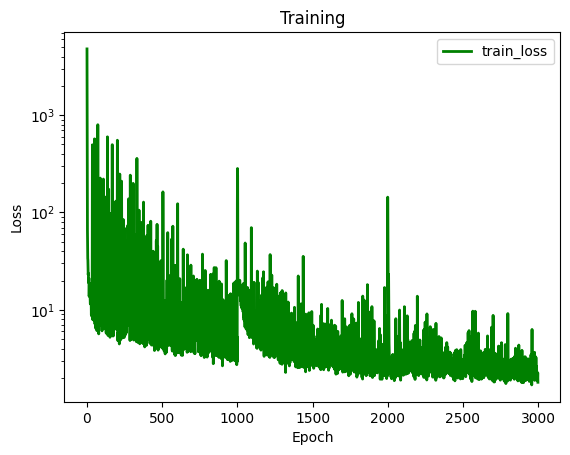

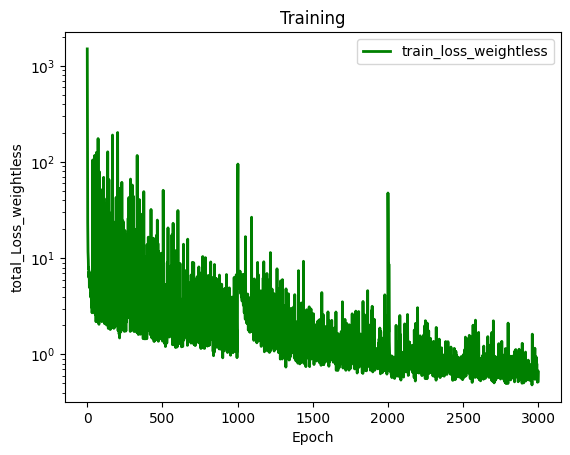

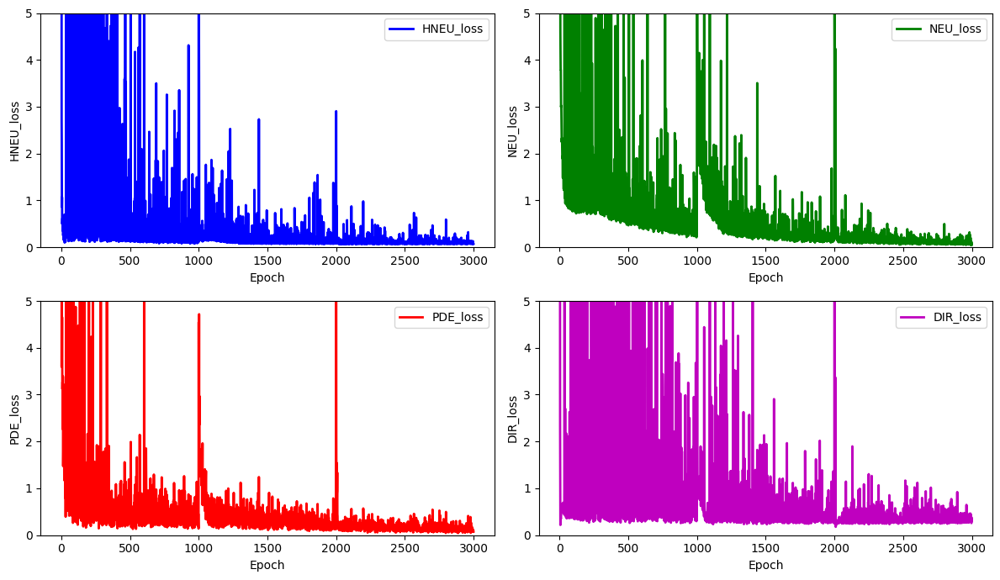

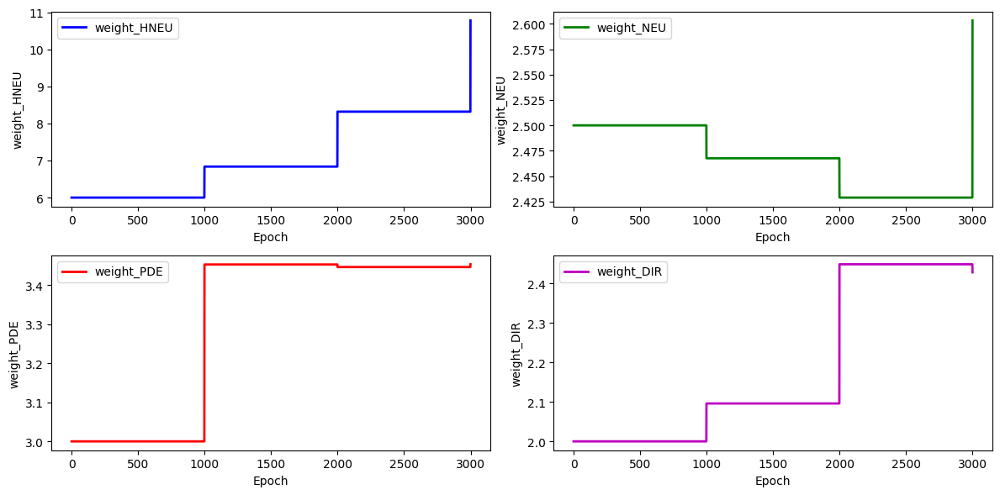

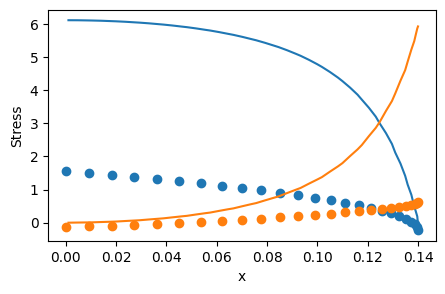

 40%|████      | 3999/9876 [1:45:50<2:34:45,  1.58s/it]

Epoch 4000, batch 0: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(2.6306)
L2 norm of gradient for neumann_losses_nd:  tensor(12.8669)
L2 norm of gradient for pde_losses_nd:  tensor(10.8042)
L2 norm of gradient for dirichlet_losses_nd:  tensor(12.1707)
Epoch 4000, batch 1: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(2.1002)
L2 norm of gradient for neumann_losses_nd:  tensor(11.1492)
L2 norm of gradient for pde_losses_nd:  tensor(7.4844)
L2 norm of gradient for dirichlet_losses_nd:  tensor(10.9448)
Epoch 4000, batch 2: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(2.3797)
L2 norm of gradient for neumann_losses_nd:  tensor(9.1058)
L2 norm of gradient for pde_losses_nd:  tensor(7.3602)
L2 norm of gradient for dirichlet_losses_nd:  tensor(6.3362)
Epoch 4000, batch 3: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(1.9185)
L2 norm of gradient for neumann_losses_nd:  tensor

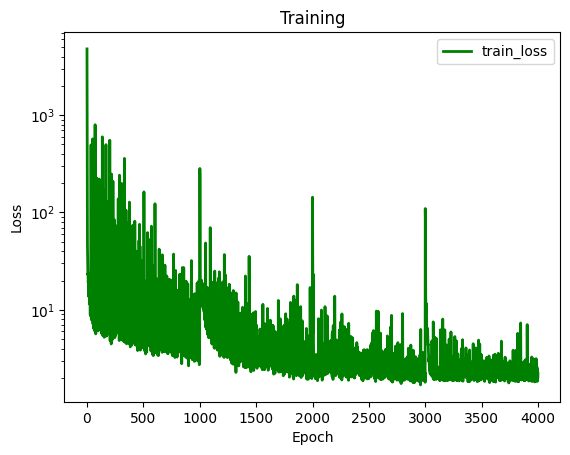

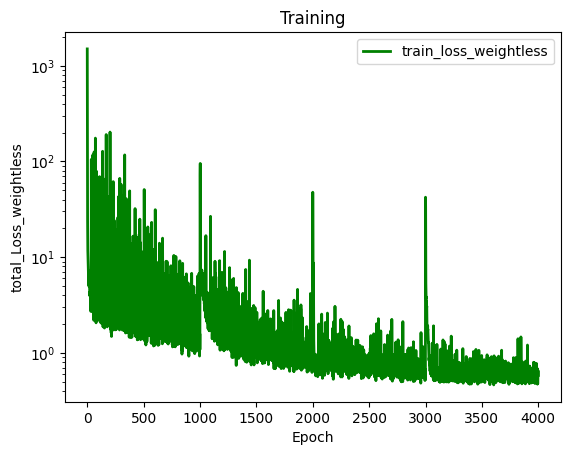

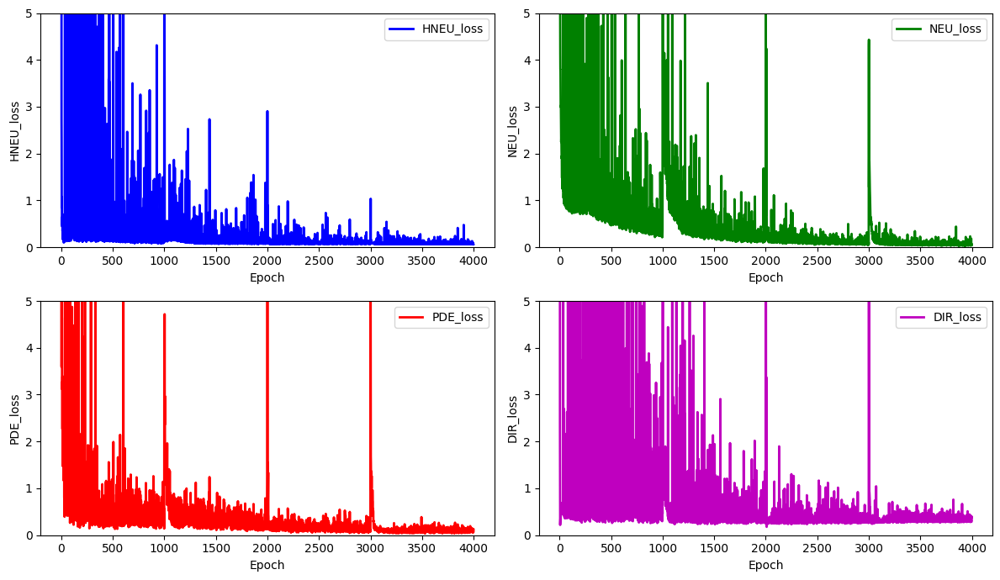

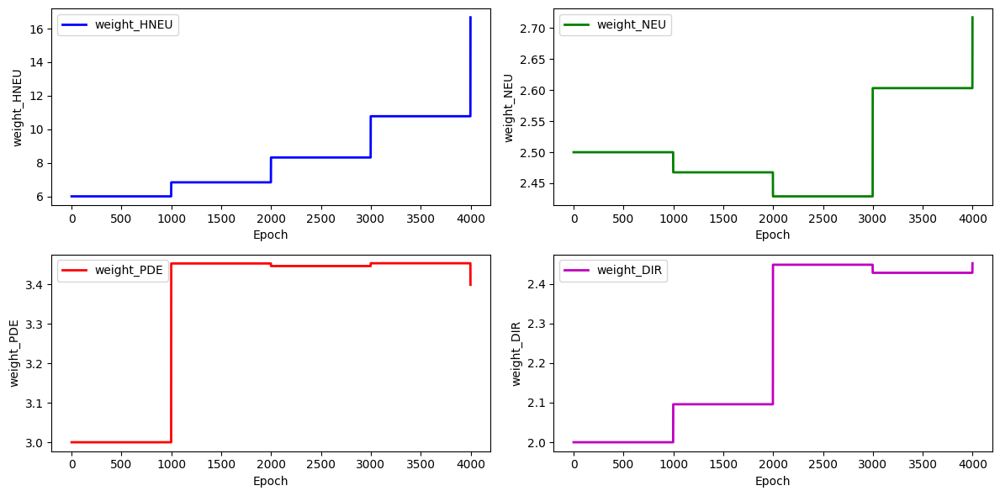

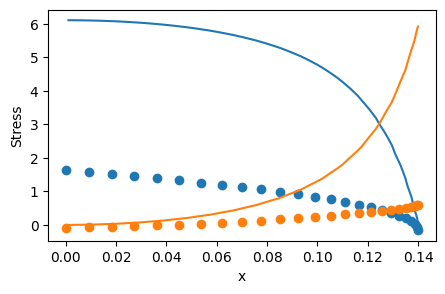

 51%|█████     | 4999/9876 [2:12:22<2:07:15,  1.57s/it]

Epoch 5000, batch 0: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(0.4819)
L2 norm of gradient for neumann_losses_nd:  tensor(7.0022)
L2 norm of gradient for pde_losses_nd:  tensor(10.1483)
L2 norm of gradient for dirichlet_losses_nd:  tensor(15.0418)
Epoch 5000, batch 1: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(0.4835)
L2 norm of gradient for neumann_losses_nd:  tensor(11.3800)
L2 norm of gradient for pde_losses_nd:  tensor(12.0664)
L2 norm of gradient for dirichlet_losses_nd:  tensor(14.2813)
Epoch 5000, batch 2: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(0.3404)
L2 norm of gradient for neumann_losses_nd:  tensor(6.4736)
L2 norm of gradient for pde_losses_nd:  tensor(10.3761)
L2 norm of gradient for dirichlet_losses_nd:  tensor(10.0726)
Epoch 5000, batch 3: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(0.5100)
L2 norm of gradient for neumann_losses_nd:  tens

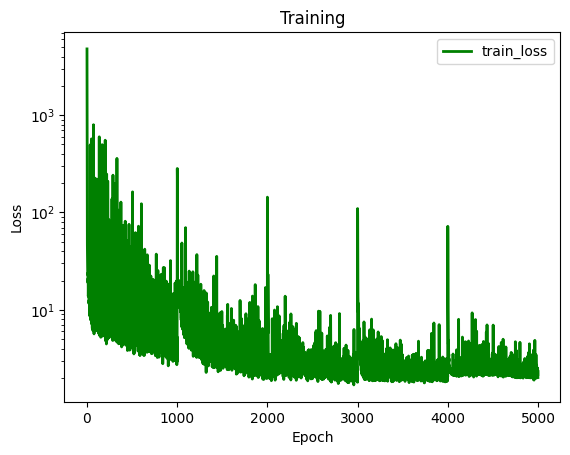

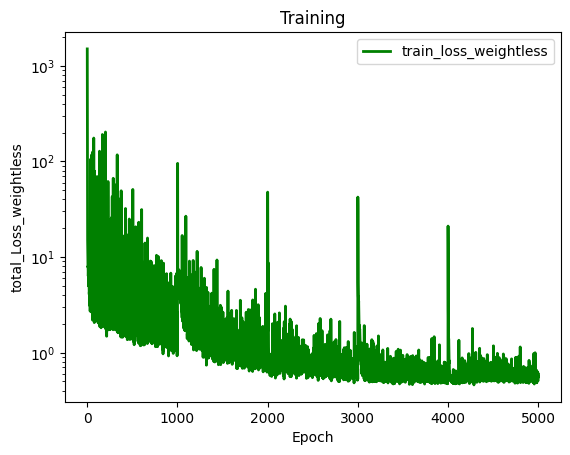

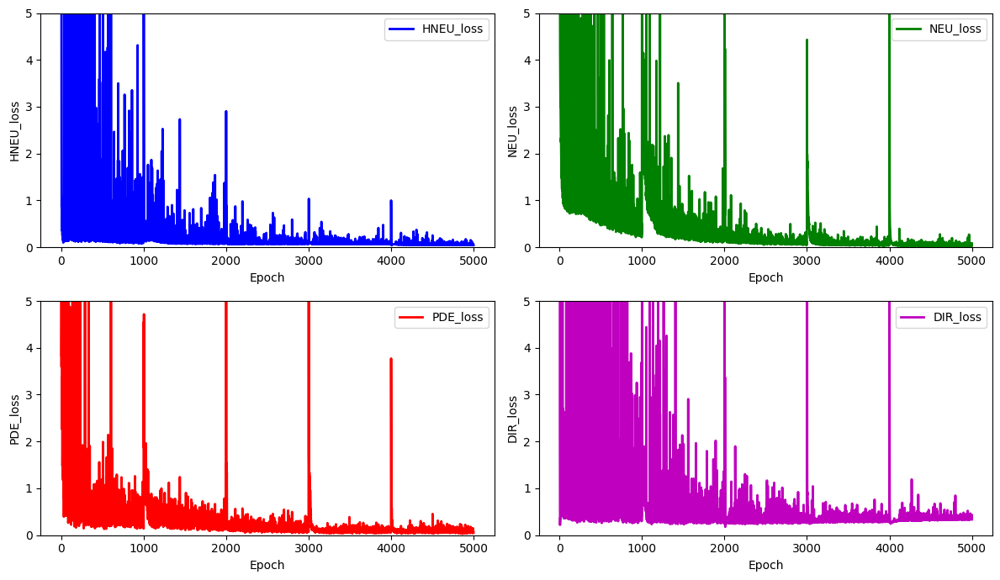

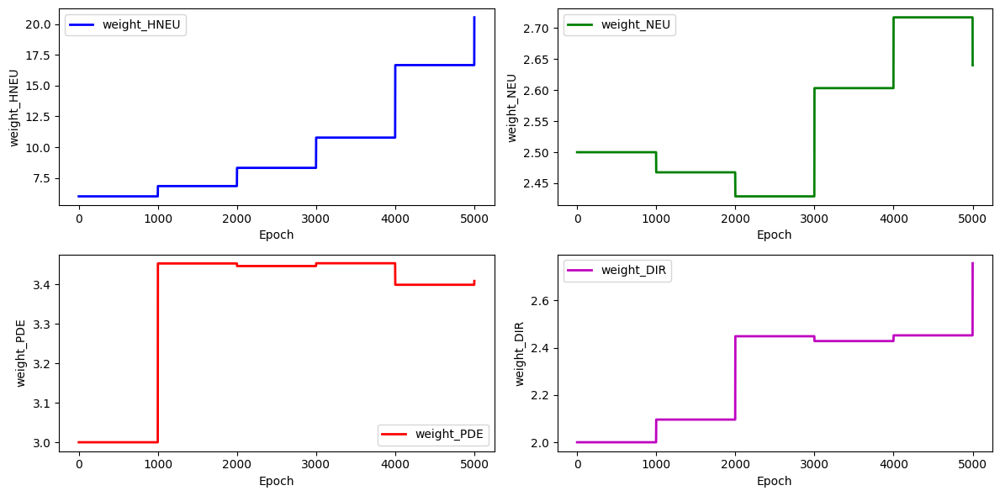

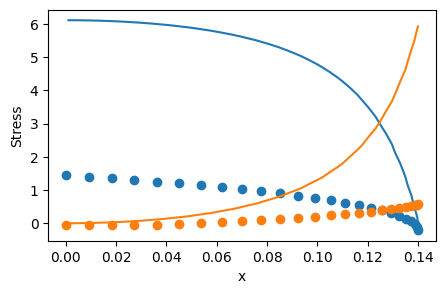

 61%|██████    | 5999/9876 [2:38:46<1:41:55,  1.58s/it]

Epoch 6000, batch 0: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(0.6687)
L2 norm of gradient for neumann_losses_nd:  tensor(6.4579)
L2 norm of gradient for pde_losses_nd:  tensor(10.0861)
L2 norm of gradient for dirichlet_losses_nd:  tensor(3.2148)
Epoch 6000, batch 1: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(0.5563)
L2 norm of gradient for neumann_losses_nd:  tensor(7.6665)
L2 norm of gradient for pde_losses_nd:  tensor(9.9099)
L2 norm of gradient for dirichlet_losses_nd:  tensor(8.4225)
Epoch 6000, batch 2: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(0.6393)
L2 norm of gradient for neumann_losses_nd:  tensor(14.1972)
L2 norm of gradient for pde_losses_nd:  tensor(15.3022)
L2 norm of gradient for dirichlet_losses_nd:  tensor(2.5127)
Epoch 6000, batch 3: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(0.9242)
L2 norm of gradient for neumann_losses_nd:  tensor(5

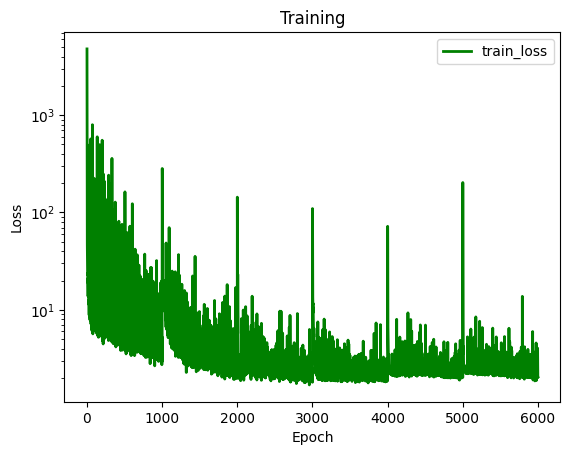

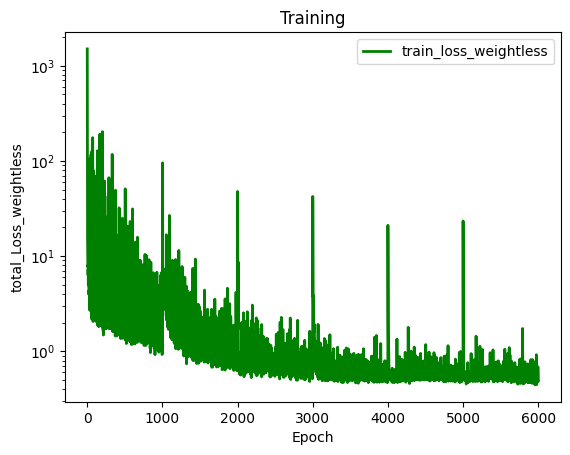

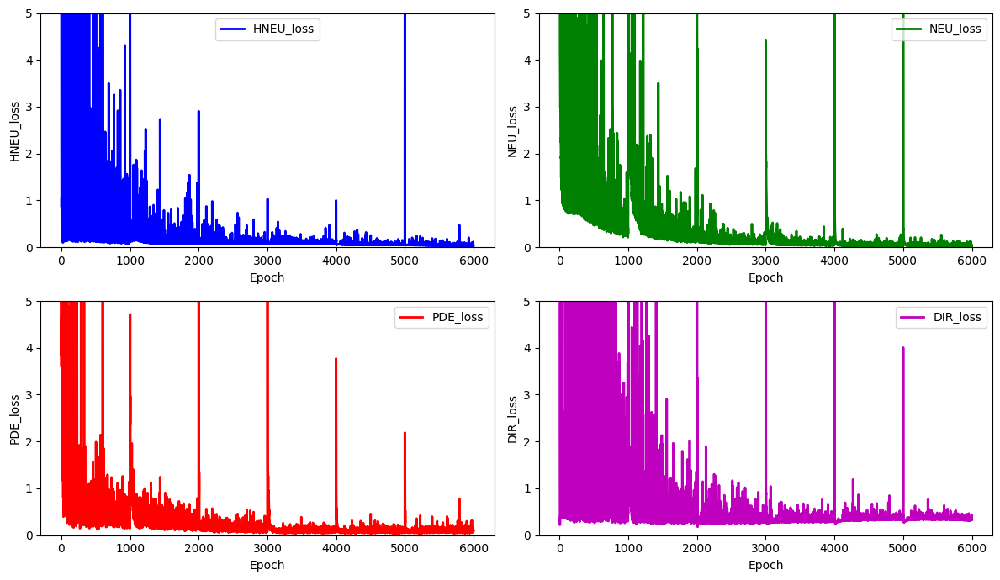

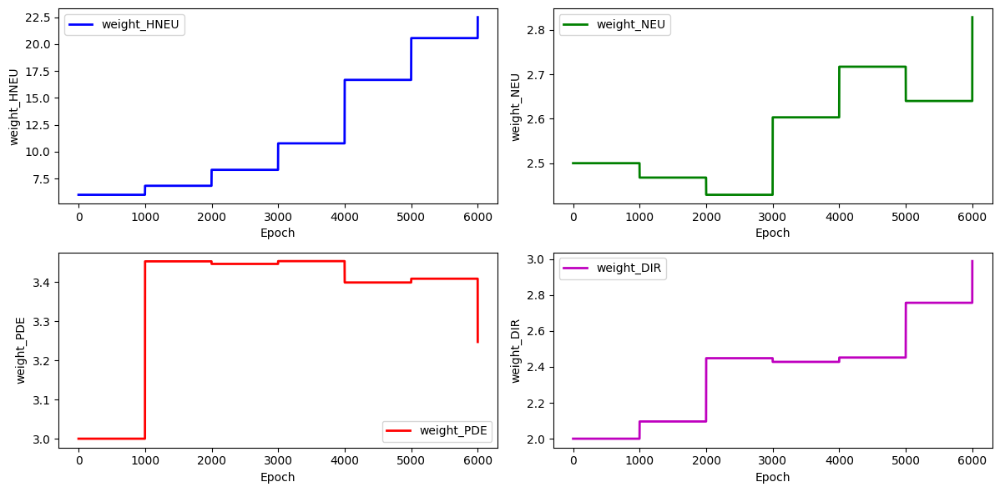

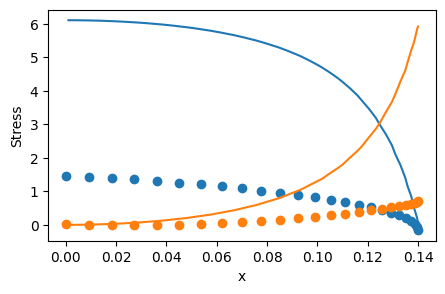

 71%|███████   | 6999/9876 [3:05:16<1:15:50,  1.58s/it]

Epoch 7000, batch 0: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(1.6452)
L2 norm of gradient for neumann_losses_nd:  tensor(5.9457)
L2 norm of gradient for pde_losses_nd:  tensor(20.7053)
L2 norm of gradient for dirichlet_losses_nd:  tensor(3.6163)
Epoch 7000, batch 1: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(1.2926)
L2 norm of gradient for neumann_losses_nd:  tensor(6.5491)
L2 norm of gradient for pde_losses_nd:  tensor(11.8017)
L2 norm of gradient for dirichlet_losses_nd:  tensor(4.0941)
Epoch 7000, batch 2: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(0.6552)
L2 norm of gradient for neumann_losses_nd:  tensor(8.5767)
L2 norm of gradient for pde_losses_nd:  tensor(11.9344)
L2 norm of gradient for dirichlet_losses_nd:  tensor(1.8835)
Epoch 7000, batch 3: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(0.2899)
L2 norm of gradient for neumann_losses_nd:  tensor(5

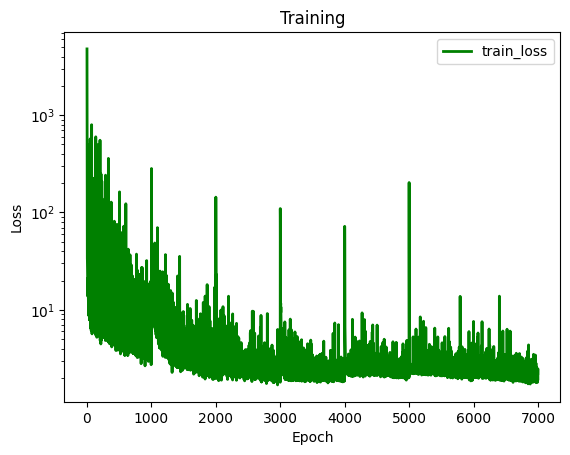

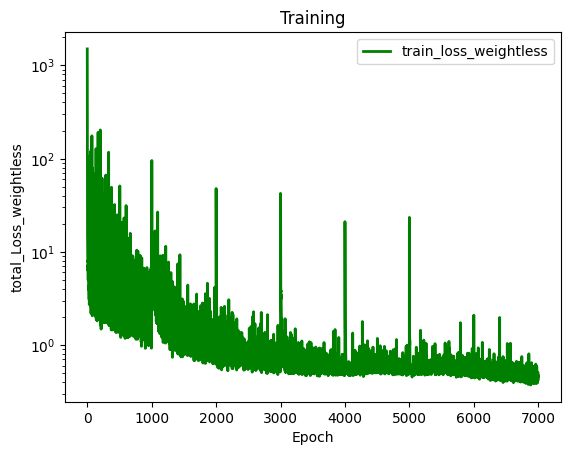

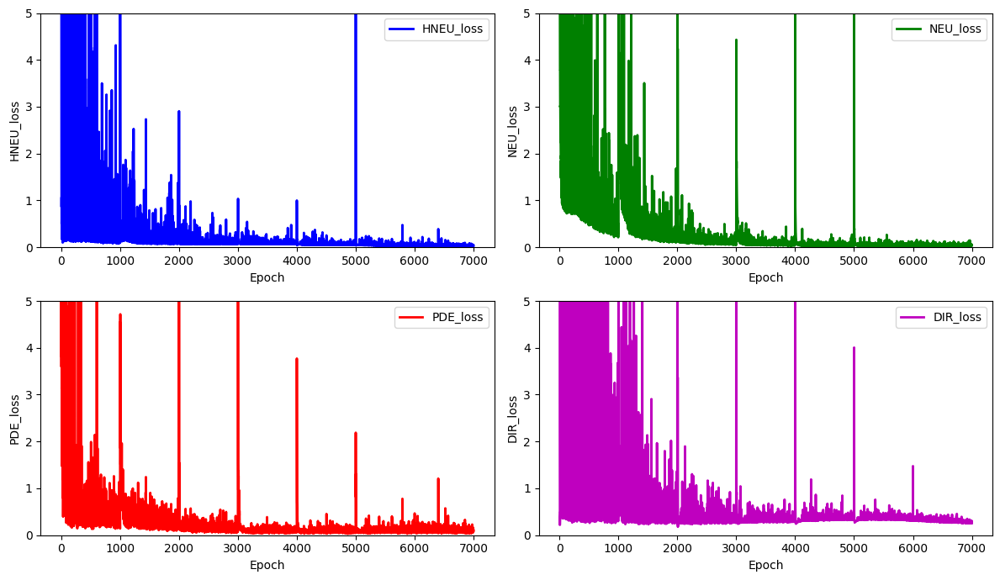

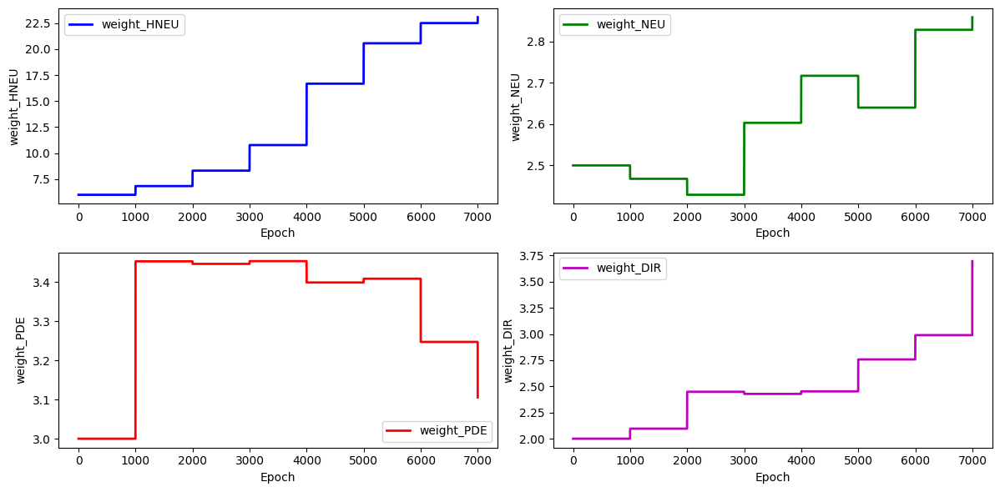

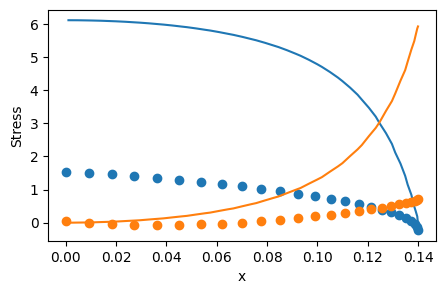

 81%|████████  | 7999/9876 [3:31:41<49:28,  1.58s/it]  

Epoch 8000, batch 0: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(1.0895)
L2 norm of gradient for neumann_losses_nd:  tensor(3.8426)
L2 norm of gradient for pde_losses_nd:  tensor(17.8686)
L2 norm of gradient for dirichlet_losses_nd:  tensor(1.7691)
Epoch 8000, batch 1: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(1.5934)
L2 norm of gradient for neumann_losses_nd:  tensor(3.4811)
L2 norm of gradient for pde_losses_nd:  tensor(11.2556)
L2 norm of gradient for dirichlet_losses_nd:  tensor(4.5917)
Epoch 8000, batch 2: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(1.7933)
L2 norm of gradient for neumann_losses_nd:  tensor(7.6664)
L2 norm of gradient for pde_losses_nd:  tensor(19.4909)
L2 norm of gradient for dirichlet_losses_nd:  tensor(3.1973)
Epoch 8000, batch 3: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(1.8370)
L2 norm of gradient for neumann_losses_nd:  tensor(7

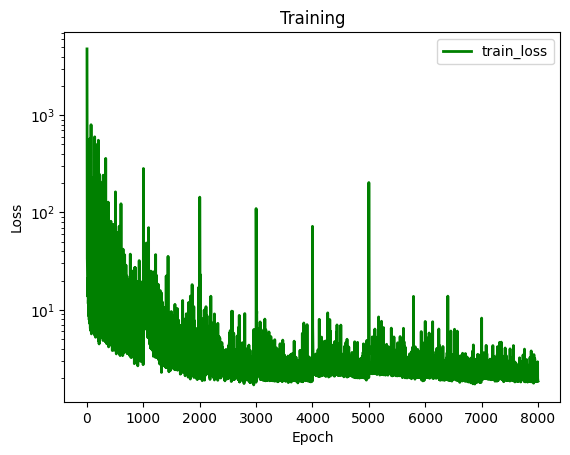

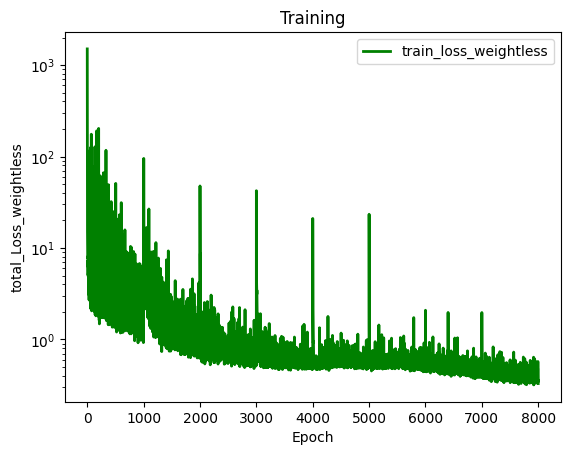

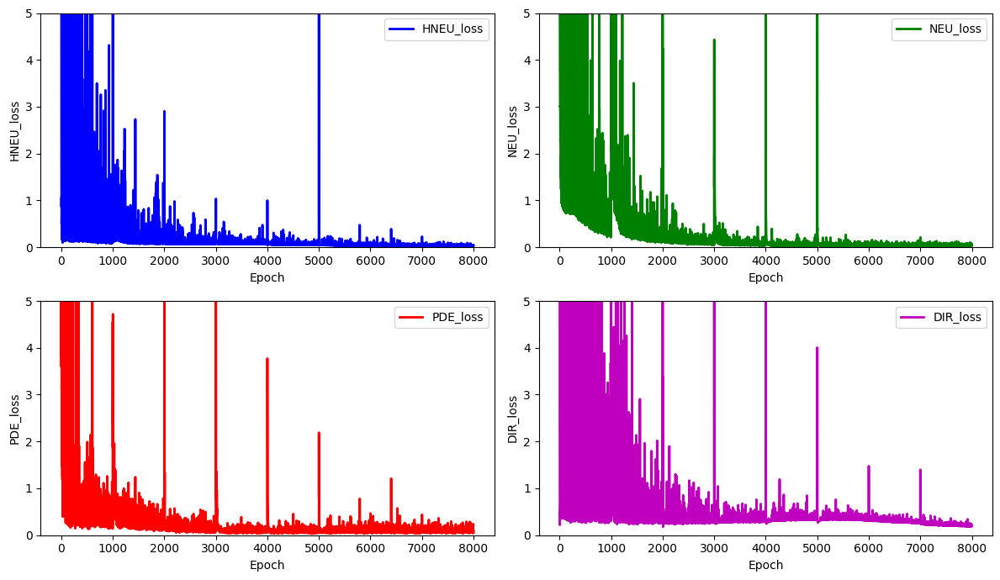

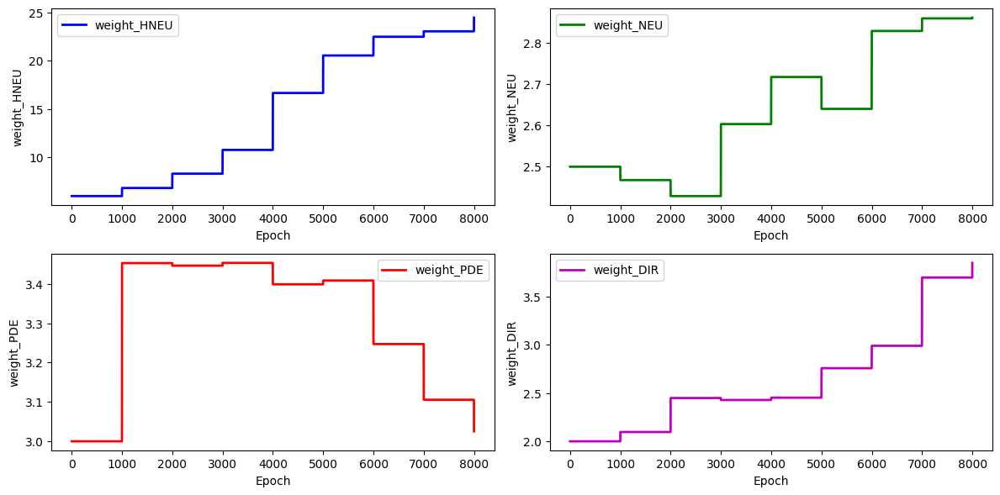

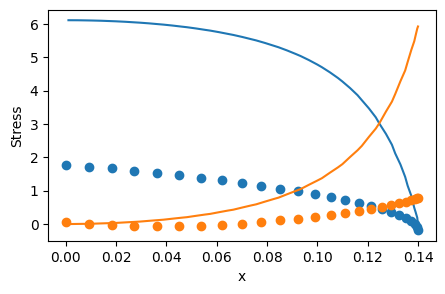

 91%|█████████ | 8999/9876 [3:58:40<23:29,  1.61s/it]  

Epoch 9000, batch 0: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(1.3784)
L2 norm of gradient for neumann_losses_nd:  tensor(4.8941)
L2 norm of gradient for pde_losses_nd:  tensor(10.7622)
L2 norm of gradient for dirichlet_losses_nd:  tensor(8.1313)
Epoch 9000, batch 1: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(2.1279)
L2 norm of gradient for neumann_losses_nd:  tensor(8.9019)
L2 norm of gradient for pde_losses_nd:  tensor(17.2018)
L2 norm of gradient for dirichlet_losses_nd:  tensor(7.6084)
Epoch 9000, batch 2: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(2.7161)
L2 norm of gradient for neumann_losses_nd:  tensor(4.6395)
L2 norm of gradient for pde_losses_nd:  tensor(11.9128)
L2 norm of gradient for dirichlet_losses_nd:  tensor(5.6563)
Epoch 9000, batch 3: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(2.5284)
L2 norm of gradient for neumann_losses_nd:  tensor(7

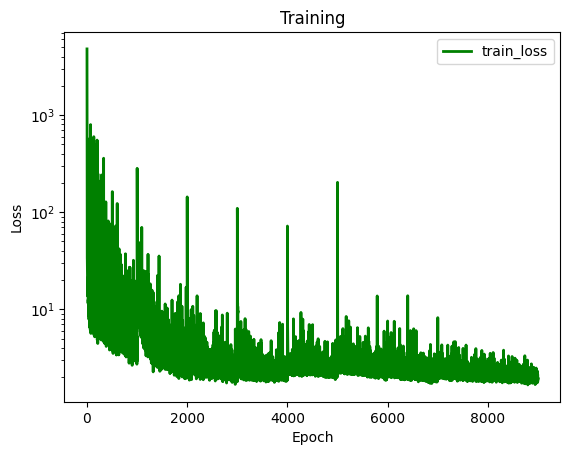

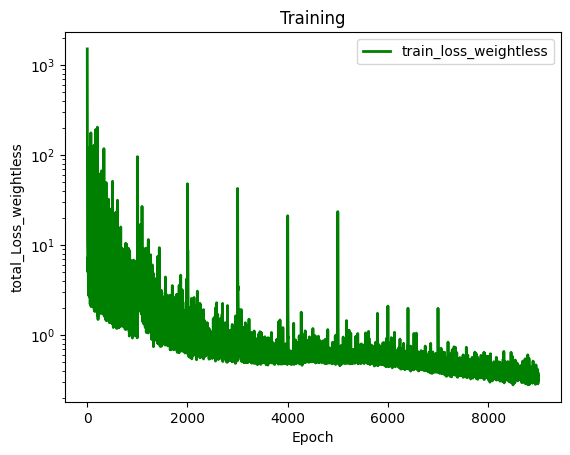

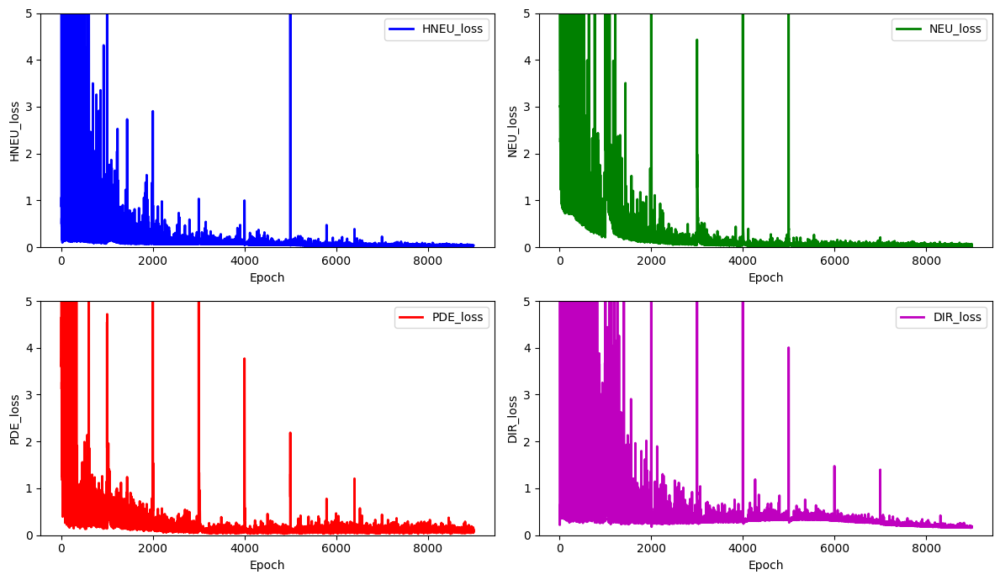

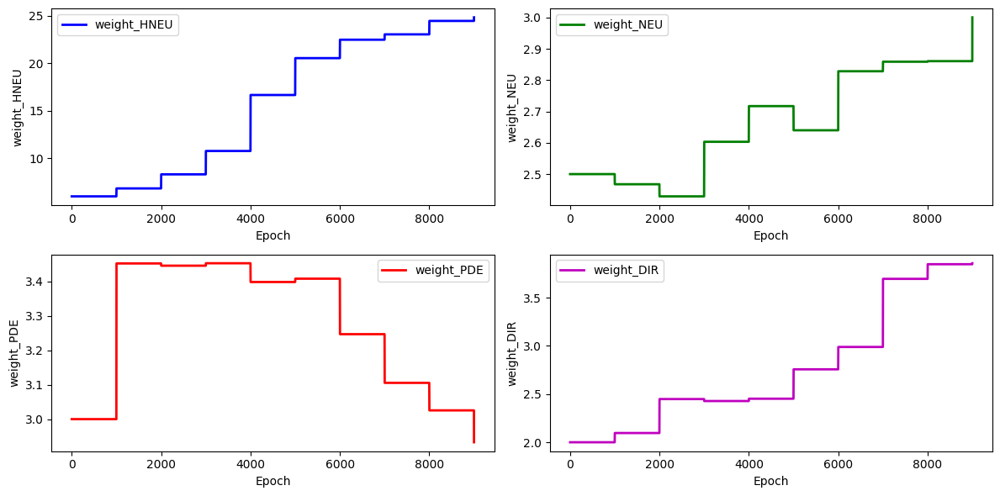

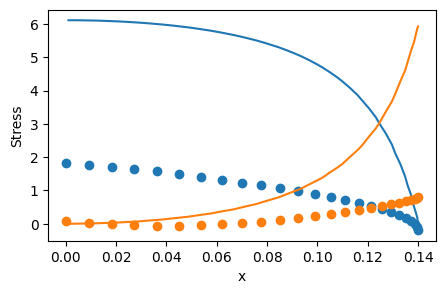

100%|██████████| 9876/9876 [4:21:55<00:00,  1.59s/it]

total_loss: 0.3205000558746205, hole_loss:  0.04140582508076955, neumann_loss:  0.02535229611522058, pde_loss: 0.10347423423578873, dirichlet_loss: 0.15026770044284166
previous lowest lost  5
lowest loss 1.98810521487663 archived, PINN is saved: 'net_param/net_1.98810521.pth


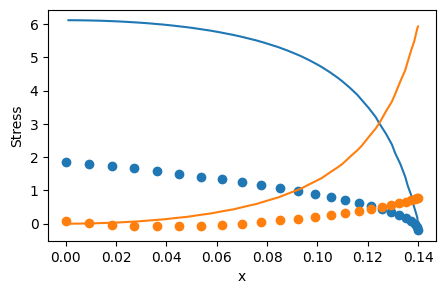

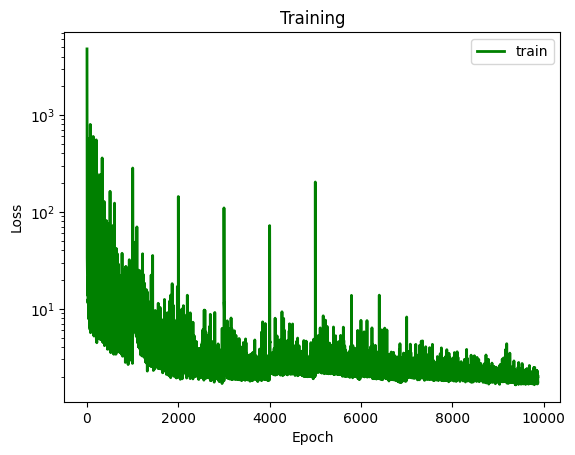

Weight_HNEU: 6.0, Weight_NEU: 2.5, Weight_PDE: 3.0, Weight_STRESS: 1.0, Stress Error: 19.934469855306272
The weights have been successfully changed.
The weights have been successfully changed.
The weights have been successfully changed.
The weights have been successfully changed.
The weights have been successfully changed.
Starting with Adam optimizer...


 10%|█         | 999/9876 [26:14<3:49:16,  1.55s/it]

Epoch 1000, batch 0: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(22.6265)
L2 norm of gradient for neumann_losses_nd:  tensor(51.3522)
L2 norm of gradient for pde_losses_nd:  tensor(36.8370)
L2 norm of gradient for dirichlet_losses_nd:  tensor(48.6497)
Epoch 1000, batch 1: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(20.5683)
L2 norm of gradient for neumann_losses_nd:  tensor(44.2936)
L2 norm of gradient for pde_losses_nd:  tensor(77.0550)
L2 norm of gradient for dirichlet_losses_nd:  tensor(21.8823)
Epoch 1000, batch 2: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(29.9548)
L2 norm of gradient for neumann_losses_nd:  tensor(22.2536)
L2 norm of gradient for pde_losses_nd:  tensor(34.5590)
L2 norm of gradient for dirichlet_losses_nd:  tensor(44.7081)
Epoch 1000, batch 3: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(22.5749)
L2 norm of gradient for neumann_losses_nd:

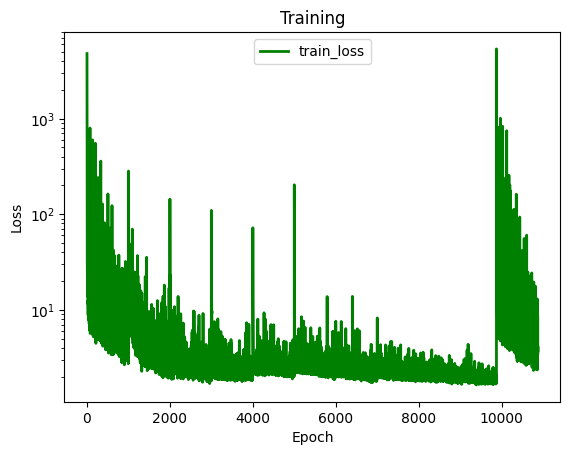

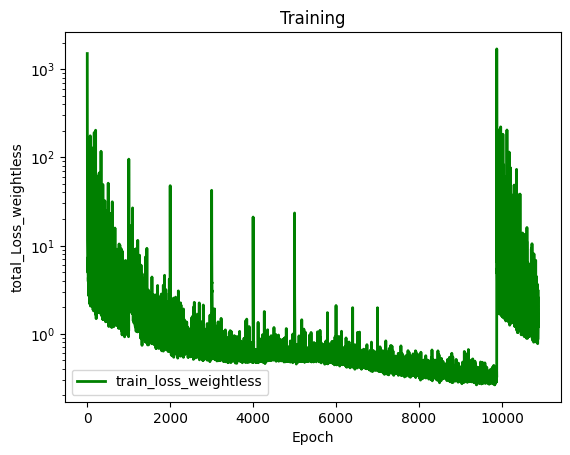

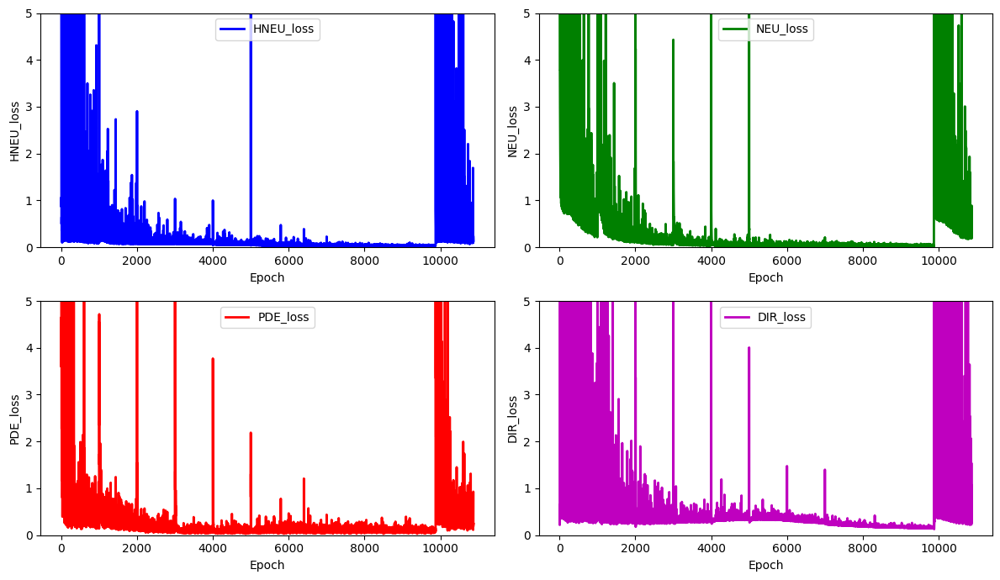

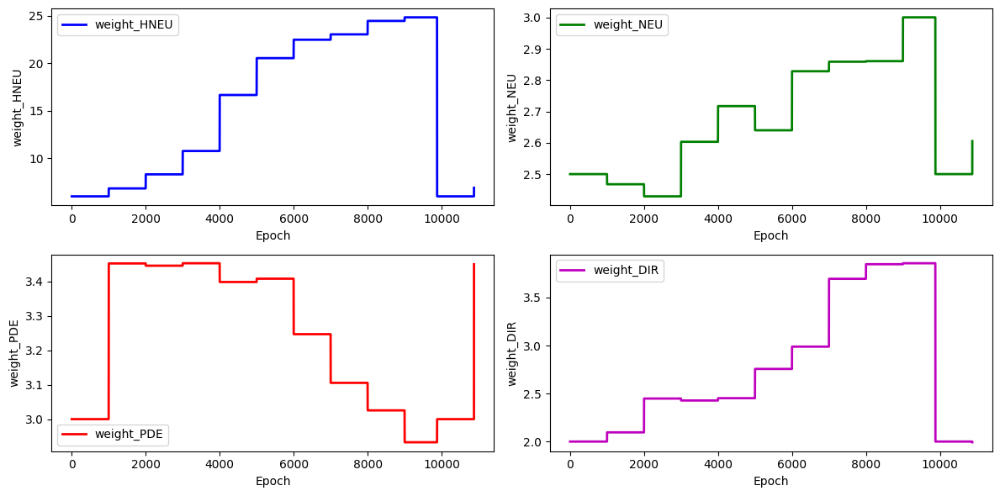

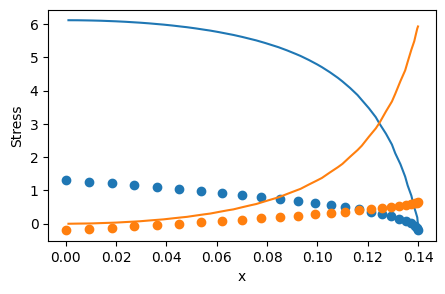

 20%|██        | 1999/9876 [52:33<3:24:27,  1.56s/it]

Epoch 2000, batch 0: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(6.6695)
L2 norm of gradient for neumann_losses_nd:  tensor(13.3094)
L2 norm of gradient for pde_losses_nd:  tensor(22.0040)
L2 norm of gradient for dirichlet_losses_nd:  tensor(26.1294)
Epoch 2000, batch 1: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(5.7255)
L2 norm of gradient for neumann_losses_nd:  tensor(6.5160)
L2 norm of gradient for pde_losses_nd:  tensor(42.9357)
L2 norm of gradient for dirichlet_losses_nd:  tensor(16.4110)
Epoch 2000, batch 2: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(7.2205)
L2 norm of gradient for neumann_losses_nd:  tensor(11.6211)
L2 norm of gradient for pde_losses_nd:  tensor(32.1315)
L2 norm of gradient for dirichlet_losses_nd:  tensor(18.5068)
Epoch 2000, batch 3: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(5.2491)
L2 norm of gradient for neumann_losses_nd:  ten

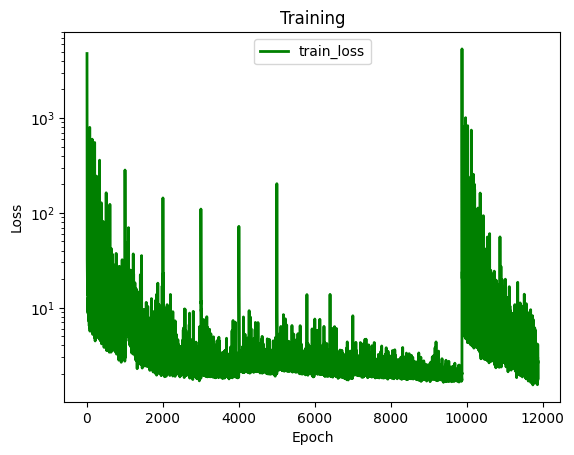

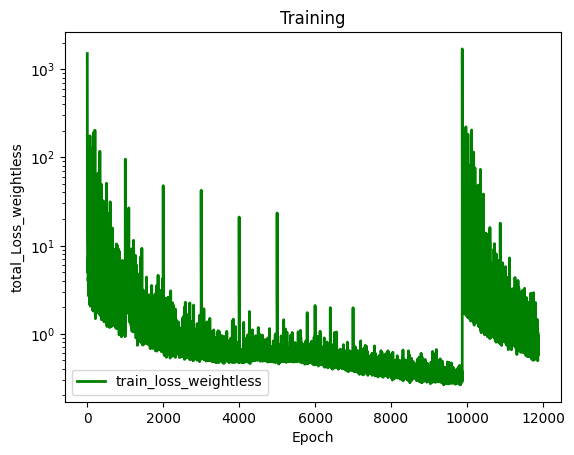

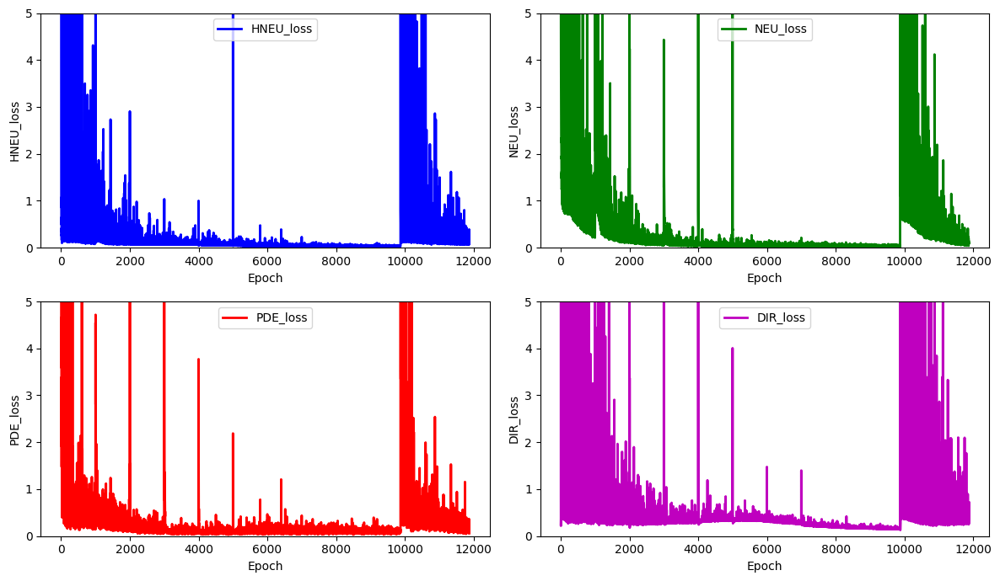

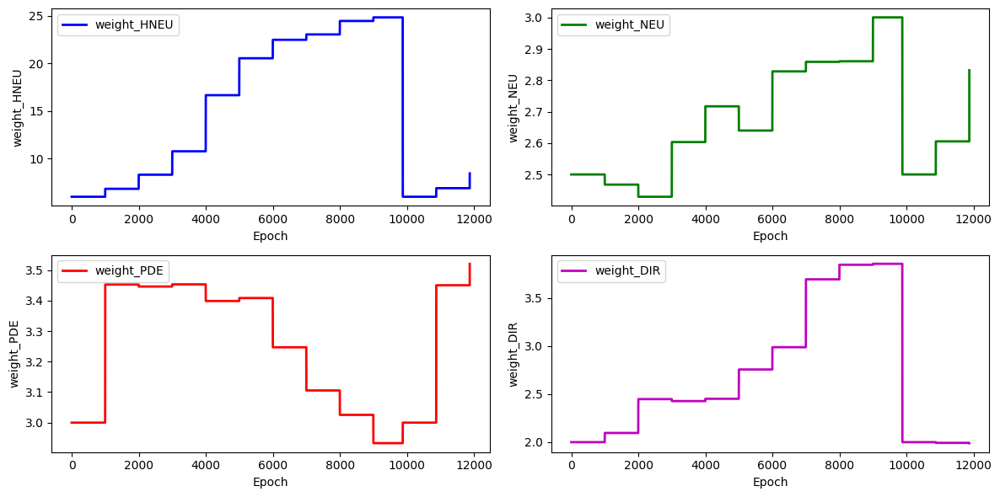

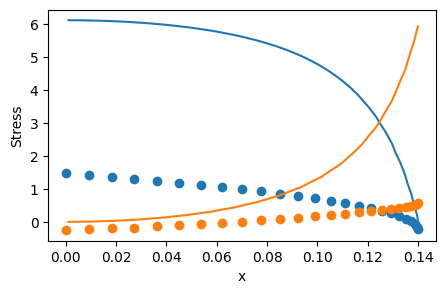

 30%|███       | 2999/9876 [1:19:24<3:05:33,  1.62s/it]

Epoch 3000, batch 0: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(4.7979)
L2 norm of gradient for neumann_losses_nd:  tensor(8.1424)
L2 norm of gradient for pde_losses_nd:  tensor(21.4051)
L2 norm of gradient for dirichlet_losses_nd:  tensor(19.4744)
Epoch 3000, batch 1: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(4.6797)
L2 norm of gradient for neumann_losses_nd:  tensor(7.0725)
L2 norm of gradient for pde_losses_nd:  tensor(10.0509)
L2 norm of gradient for dirichlet_losses_nd:  tensor(10.4405)
Epoch 3000, batch 2: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(1.0040)
L2 norm of gradient for neumann_losses_nd:  tensor(10.8410)
L2 norm of gradient for pde_losses_nd:  tensor(9.2296)
L2 norm of gradient for dirichlet_losses_nd:  tensor(4.5803)
Epoch 3000, batch 3: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(2.4559)
L2 norm of gradient for neumann_losses_nd:  tensor

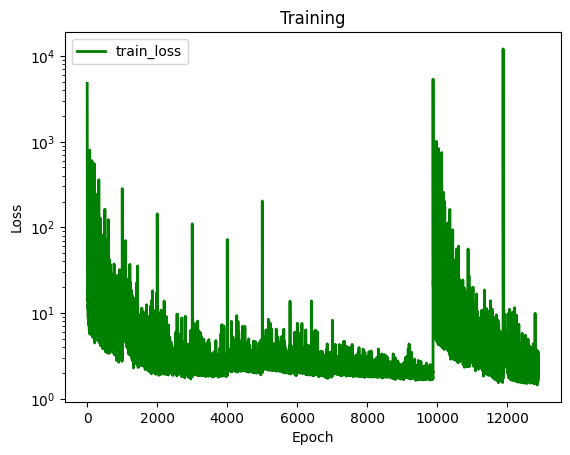

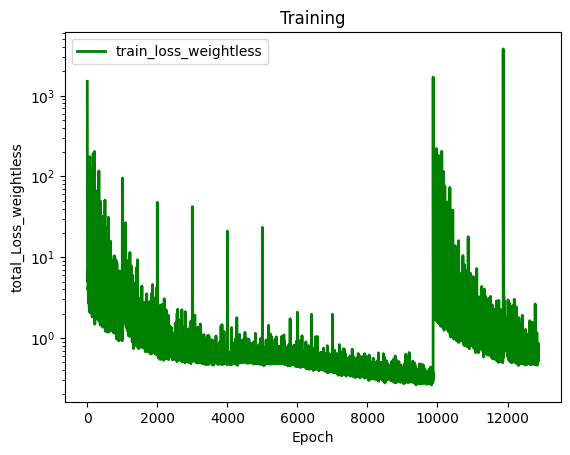

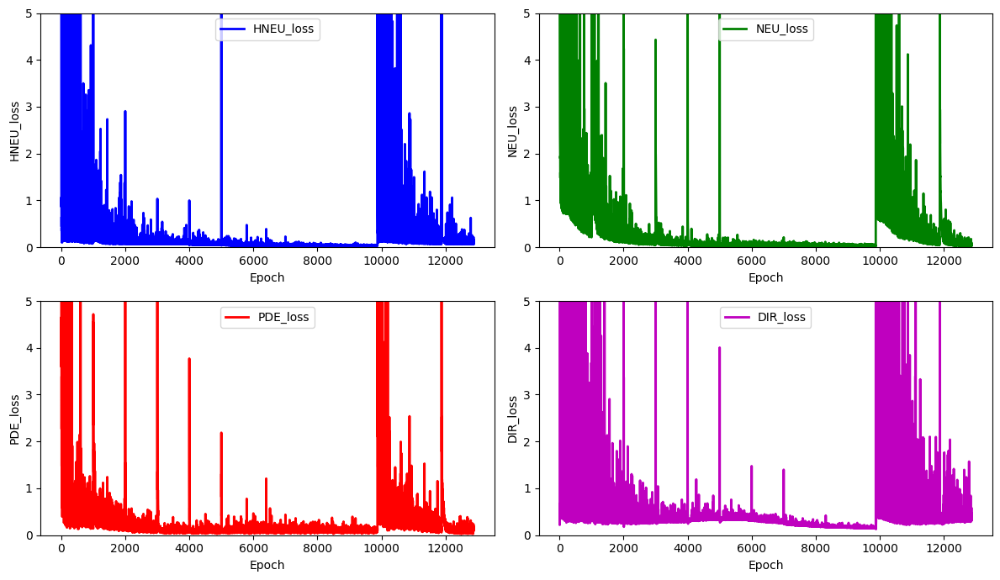

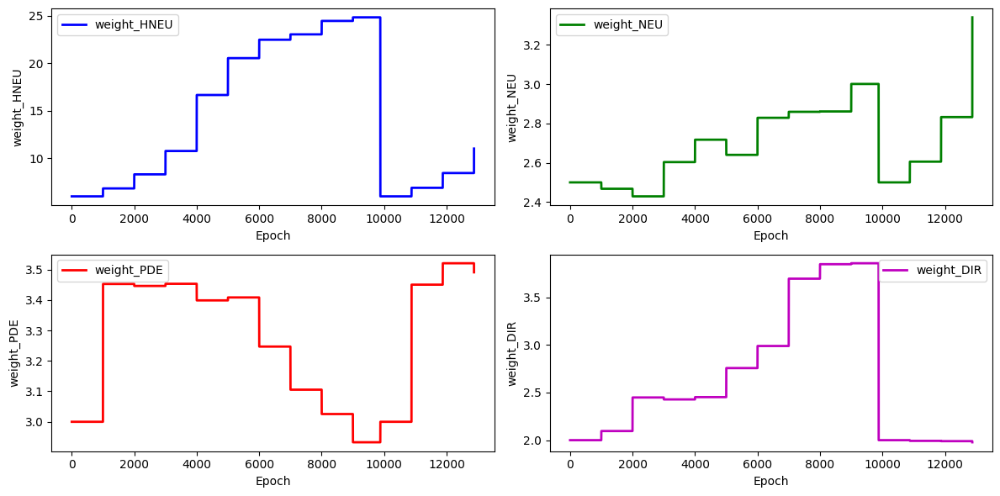

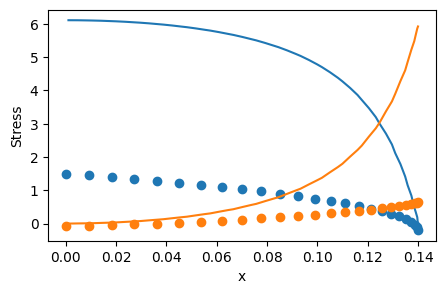

 40%|████      | 3999/9876 [1:46:00<2:35:44,  1.59s/it]

Epoch 4000, batch 0: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(0.8064)
L2 norm of gradient for neumann_losses_nd:  tensor(7.9400)
L2 norm of gradient for pde_losses_nd:  tensor(11.0966)
L2 norm of gradient for dirichlet_losses_nd:  tensor(8.9707)
Epoch 4000, batch 1: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(1.4139)
L2 norm of gradient for neumann_losses_nd:  tensor(10.4921)
L2 norm of gradient for pde_losses_nd:  tensor(9.5831)
L2 norm of gradient for dirichlet_losses_nd:  tensor(7.3725)
Epoch 4000, batch 2: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(1.6058)
L2 norm of gradient for neumann_losses_nd:  tensor(6.0298)
L2 norm of gradient for pde_losses_nd:  tensor(16.8347)
L2 norm of gradient for dirichlet_losses_nd:  tensor(8.7364)
Epoch 4000, batch 3: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(2.2055)
L2 norm of gradient for neumann_losses_nd:  tensor(6

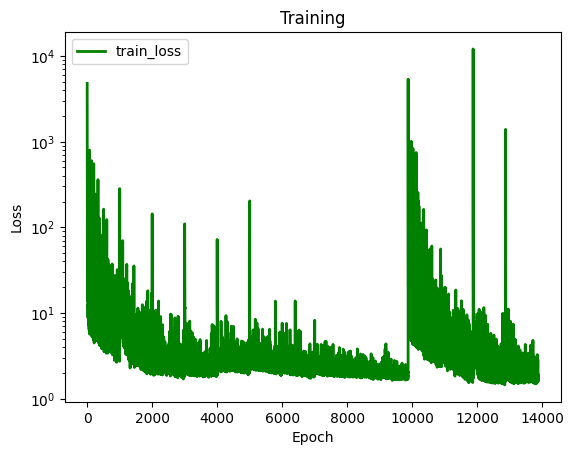

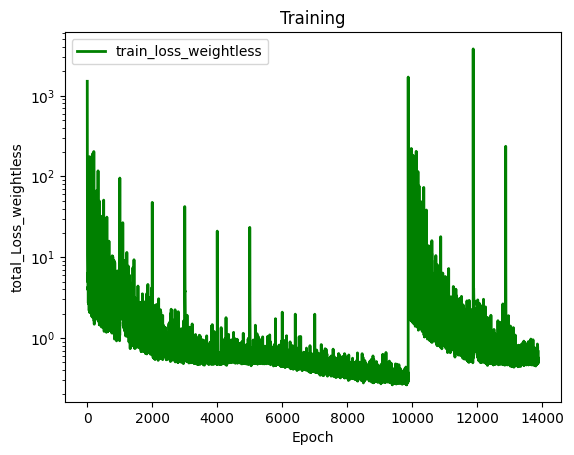

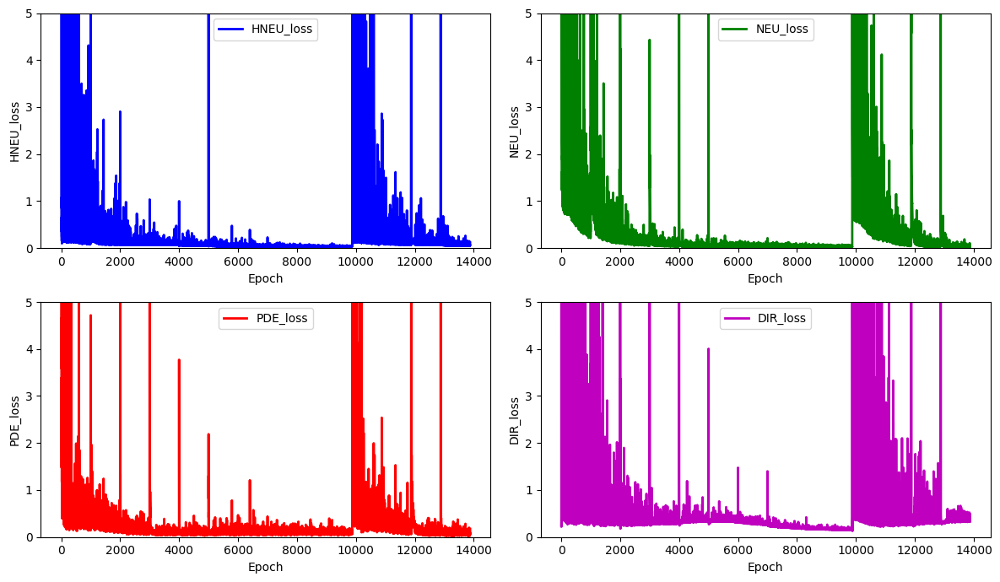

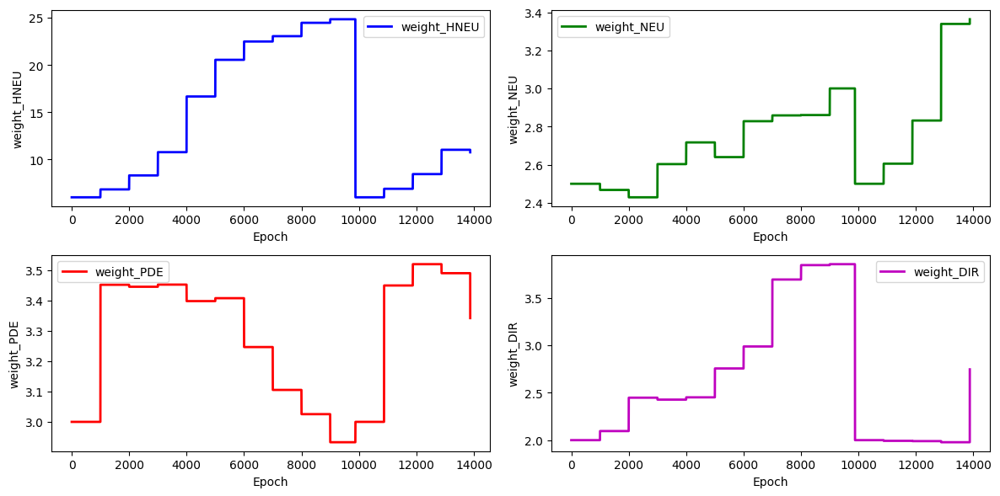

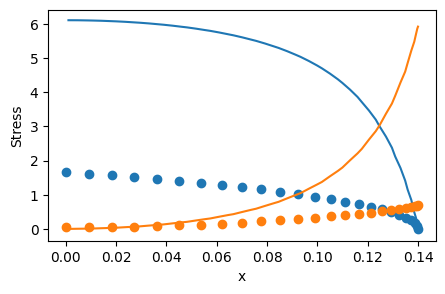

 51%|█████     | 4999/9876 [2:12:50<2:10:54,  1.61s/it]

Epoch 5000, batch 0: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(1.3188)
L2 norm of gradient for neumann_losses_nd:  tensor(6.6829)
L2 norm of gradient for pde_losses_nd:  tensor(6.9257)
L2 norm of gradient for dirichlet_losses_nd:  tensor(2.5815)
Epoch 5000, batch 1: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(1.0504)
L2 norm of gradient for neumann_losses_nd:  tensor(5.3035)
L2 norm of gradient for pde_losses_nd:  tensor(24.6299)
L2 norm of gradient for dirichlet_losses_nd:  tensor(2.5406)
Epoch 5000, batch 2: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(1.8888)
L2 norm of gradient for neumann_losses_nd:  tensor(7.1995)
L2 norm of gradient for pde_losses_nd:  tensor(18.0647)
L2 norm of gradient for dirichlet_losses_nd:  tensor(7.2084)
Epoch 5000, batch 3: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(2.4535)
L2 norm of gradient for neumann_losses_nd:  tensor(5.

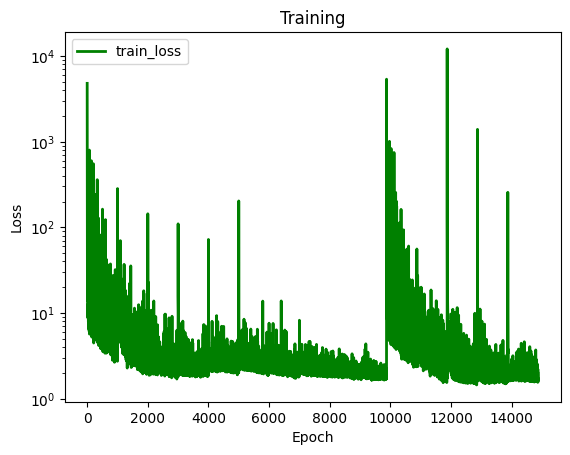

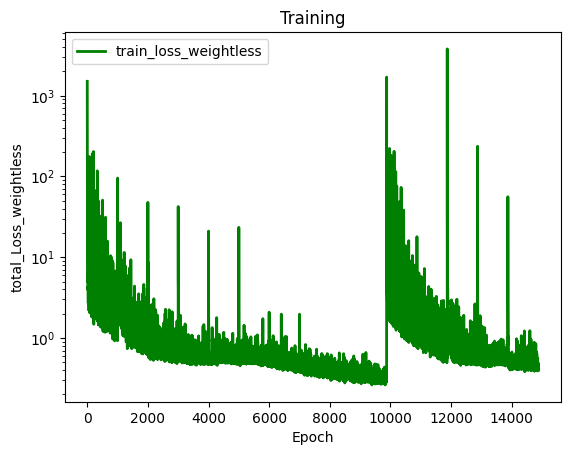

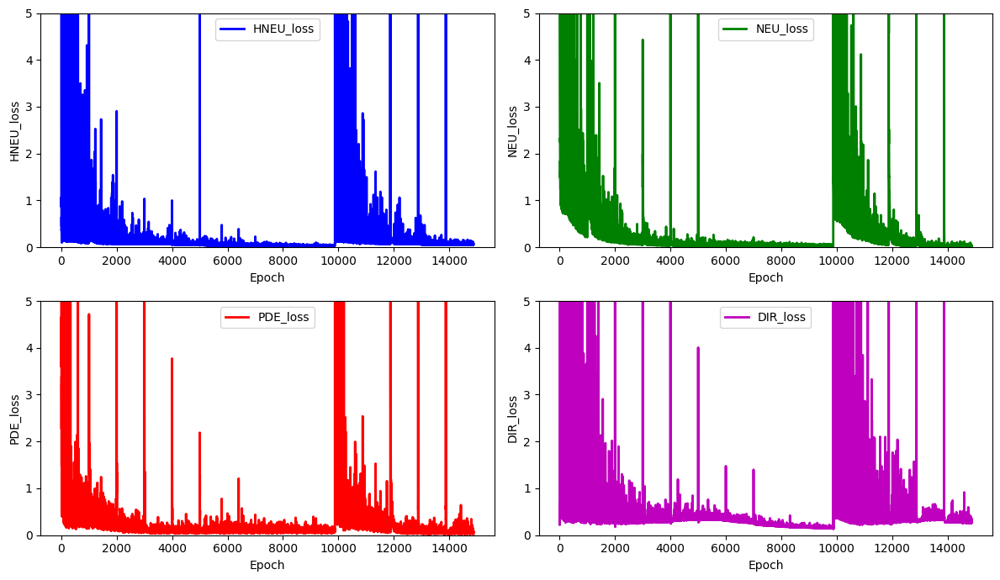

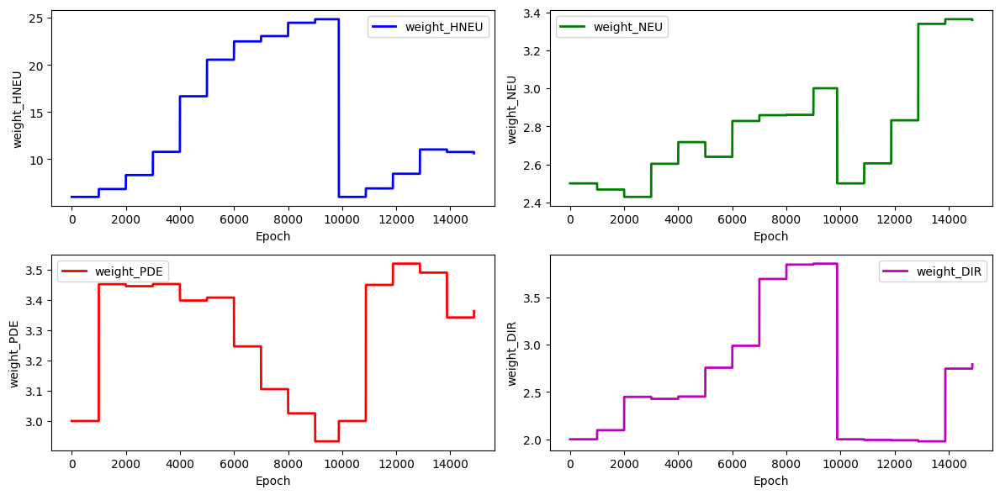

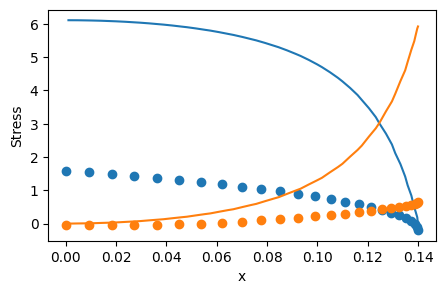

 61%|██████    | 5999/9876 [2:39:24<1:40:40,  1.56s/it]

Epoch 6000, batch 0: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(0.9635)
L2 norm of gradient for neumann_losses_nd:  tensor(6.8091)
L2 norm of gradient for pde_losses_nd:  tensor(8.1254)
L2 norm of gradient for dirichlet_losses_nd:  tensor(3.0147)
Epoch 6000, batch 1: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(0.6918)
L2 norm of gradient for neumann_losses_nd:  tensor(5.4337)
L2 norm of gradient for pde_losses_nd:  tensor(16.7181)
L2 norm of gradient for dirichlet_losses_nd:  tensor(4.0119)
Epoch 6000, batch 2: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(2.3047)
L2 norm of gradient for neumann_losses_nd:  tensor(3.7912)
L2 norm of gradient for pde_losses_nd:  tensor(11.3059)
L2 norm of gradient for dirichlet_losses_nd:  tensor(3.4496)
Epoch 6000, batch 3: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(2.0379)
L2 norm of gradient for neumann_losses_nd:  tensor(3.

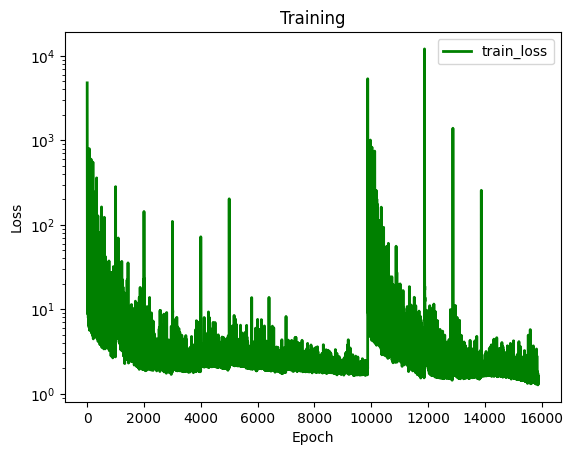

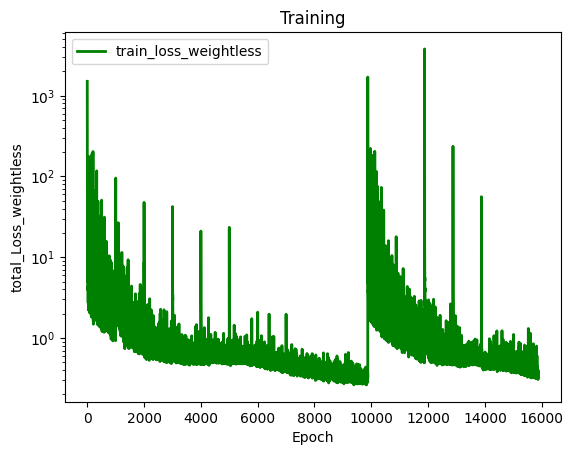

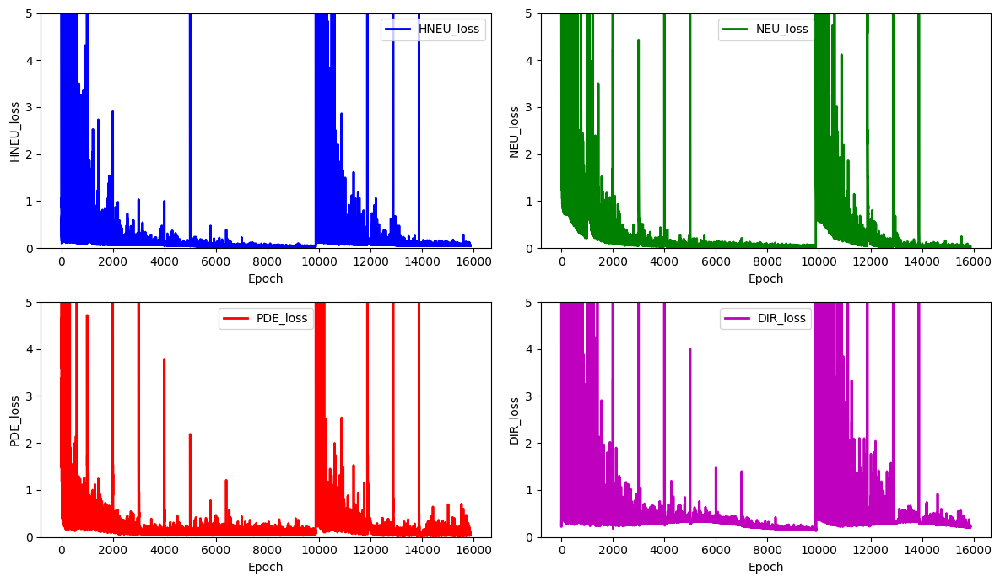

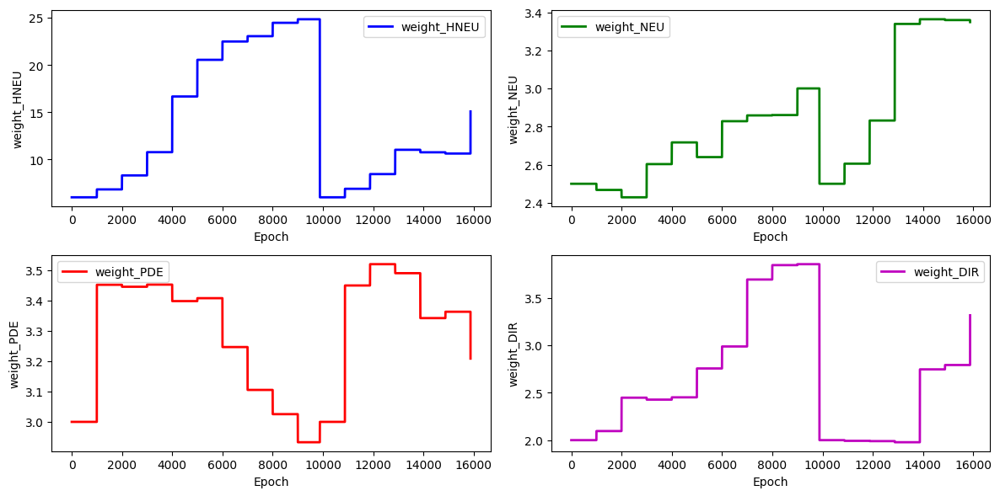

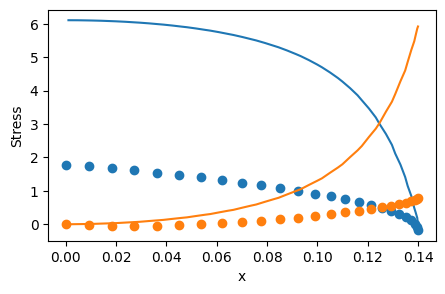

 71%|███████   | 6999/9876 [3:05:52<1:16:34,  1.60s/it]

Epoch 7000, batch 0: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(1.1999)
L2 norm of gradient for neumann_losses_nd:  tensor(3.2929)
L2 norm of gradient for pde_losses_nd:  tensor(11.3635)
L2 norm of gradient for dirichlet_losses_nd:  tensor(4.6650)
Epoch 7000, batch 1: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(0.5906)
L2 norm of gradient for neumann_losses_nd:  tensor(3.2712)
L2 norm of gradient for pde_losses_nd:  tensor(8.2758)
L2 norm of gradient for dirichlet_losses_nd:  tensor(4.0718)
Epoch 7000, batch 2: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(0.6660)
L2 norm of gradient for neumann_losses_nd:  tensor(3.9718)
L2 norm of gradient for pde_losses_nd:  tensor(6.0459)
L2 norm of gradient for dirichlet_losses_nd:  tensor(2.1655)
Epoch 7000, batch 3: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(0.7285)
L2 norm of gradient for neumann_losses_nd:  tensor(5.9

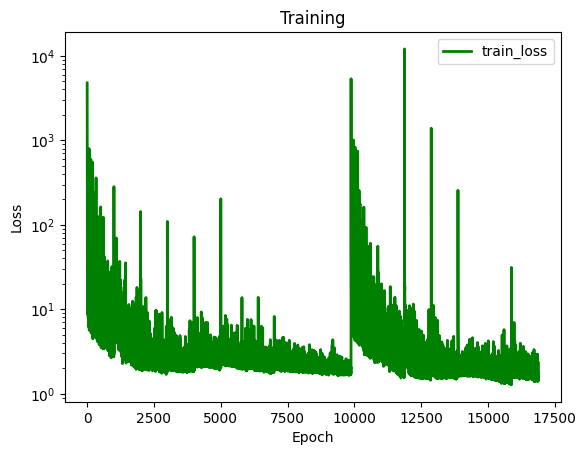

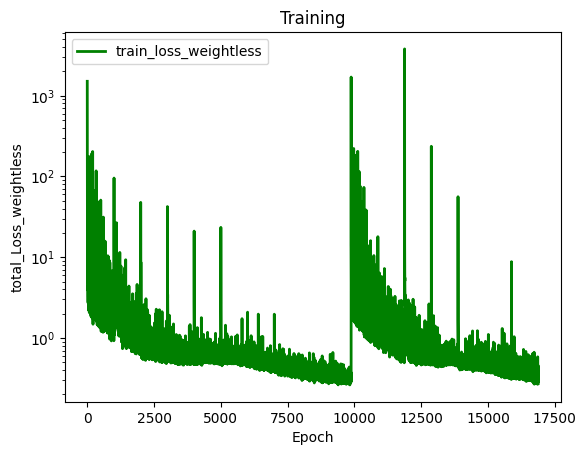

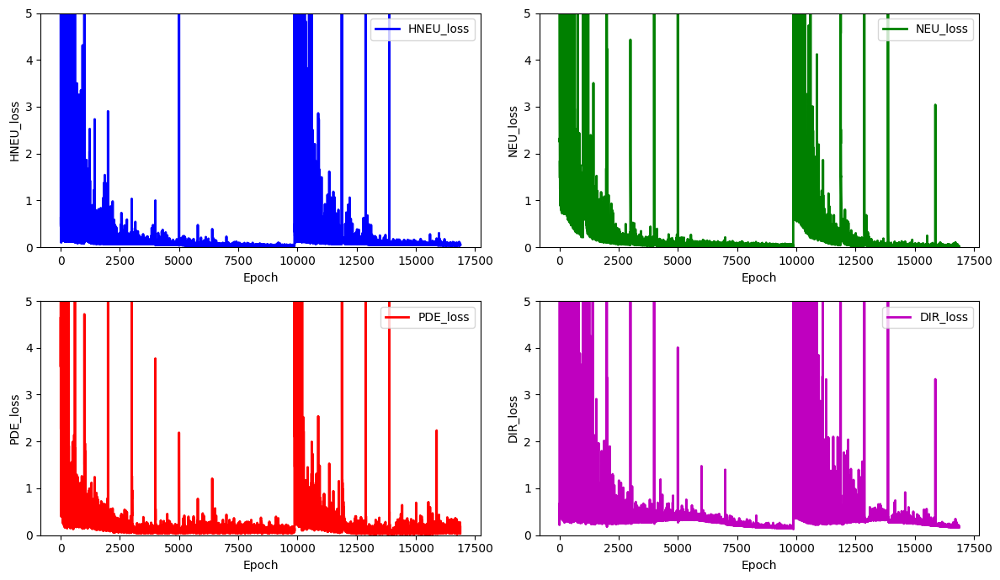

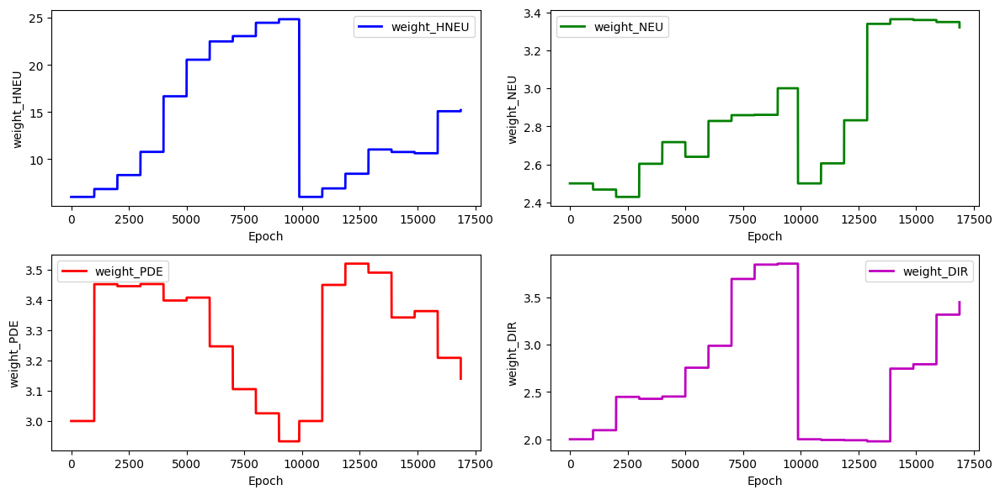

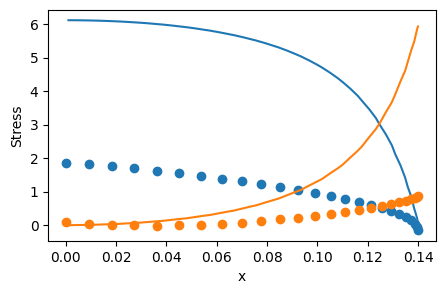

 81%|████████  | 7999/9876 [3:32:39<49:46,  1.59s/it]  

Epoch 8000, batch 0: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(1.1223)
L2 norm of gradient for neumann_losses_nd:  tensor(6.8892)
L2 norm of gradient for pde_losses_nd:  tensor(7.4548)
L2 norm of gradient for dirichlet_losses_nd:  tensor(4.7778)
Epoch 8000, batch 1: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(1.1337)
L2 norm of gradient for neumann_losses_nd:  tensor(3.2236)
L2 norm of gradient for pde_losses_nd:  tensor(11.3548)
L2 norm of gradient for dirichlet_losses_nd:  tensor(5.7878)
Epoch 8000, batch 2: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(0.8473)
L2 norm of gradient for neumann_losses_nd:  tensor(4.3292)
L2 norm of gradient for pde_losses_nd:  tensor(9.3693)
L2 norm of gradient for dirichlet_losses_nd:  tensor(3.4184)
Epoch 8000, batch 3: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(0.5648)
L2 norm of gradient for neumann_losses_nd:  tensor(4.8

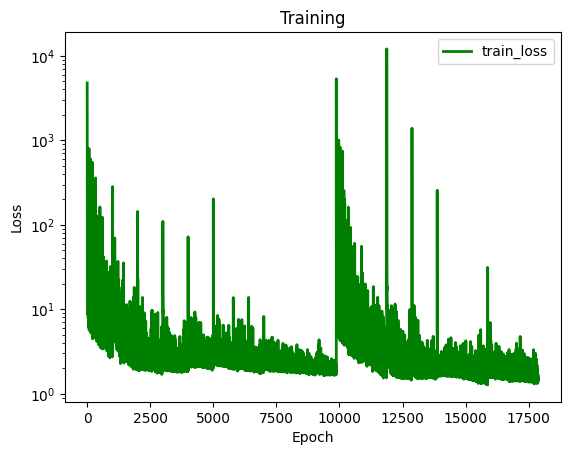

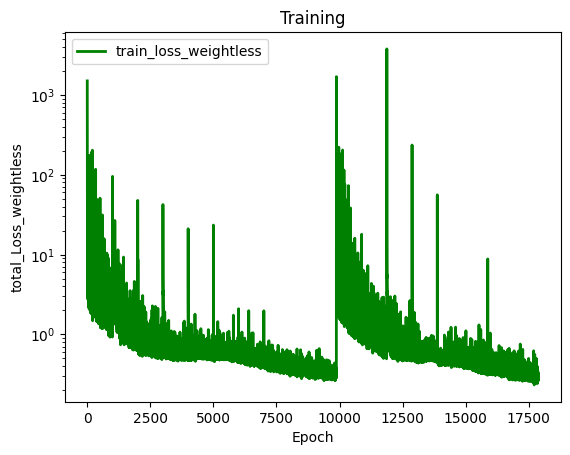

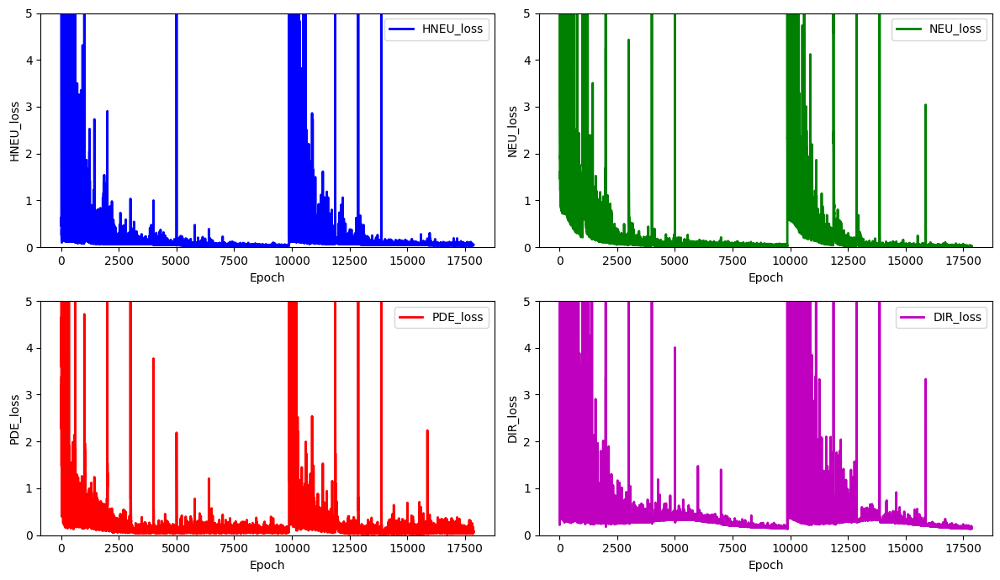

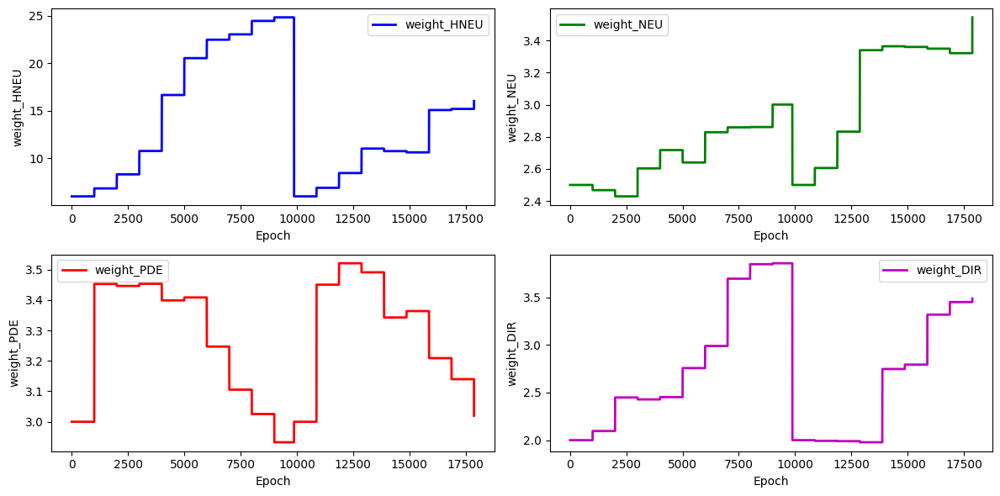

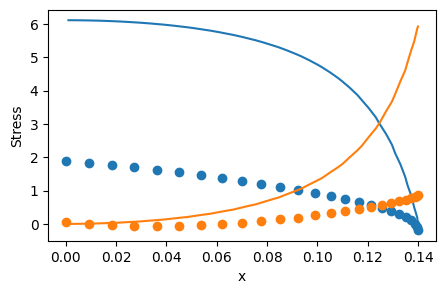

 91%|█████████ | 8999/9876 [3:58:55<23:00,  1.57s/it]  

Epoch 9000, batch 0: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(1.0468)
L2 norm of gradient for neumann_losses_nd:  tensor(4.0309)
L2 norm of gradient for pde_losses_nd:  tensor(11.9605)
L2 norm of gradient for dirichlet_losses_nd:  tensor(3.1430)
Epoch 9000, batch 1: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(0.9924)
L2 norm of gradient for neumann_losses_nd:  tensor(5.3204)
L2 norm of gradient for pde_losses_nd:  tensor(9.3993)
L2 norm of gradient for dirichlet_losses_nd:  tensor(3.6006)
Epoch 9000, batch 2: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(0.6189)
L2 norm of gradient for neumann_losses_nd:  tensor(3.7008)
L2 norm of gradient for pde_losses_nd:  tensor(9.7103)
L2 norm of gradient for dirichlet_losses_nd:  tensor(4.4689)
Epoch 9000, batch 3: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(0.6399)
L2 norm of gradient for neumann_losses_nd:  tensor(9.1

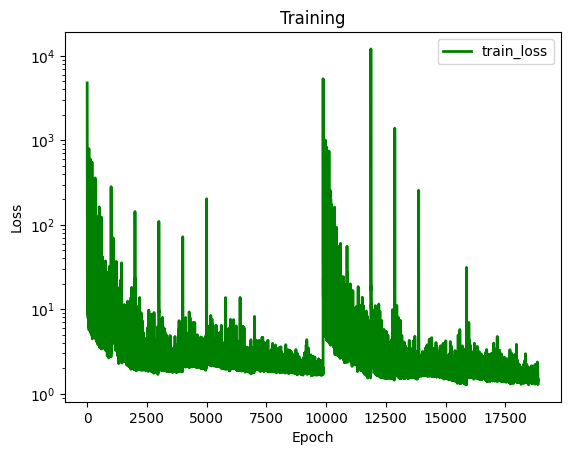

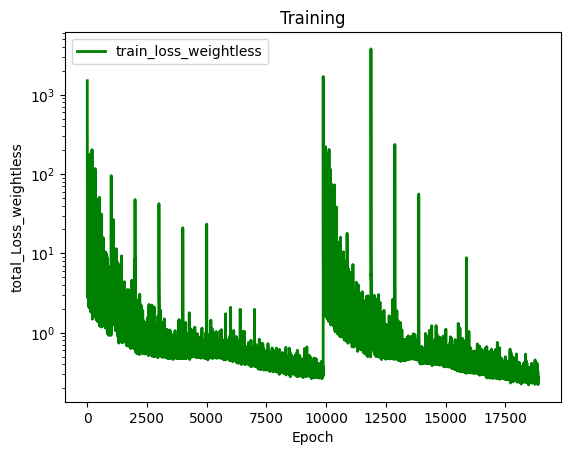

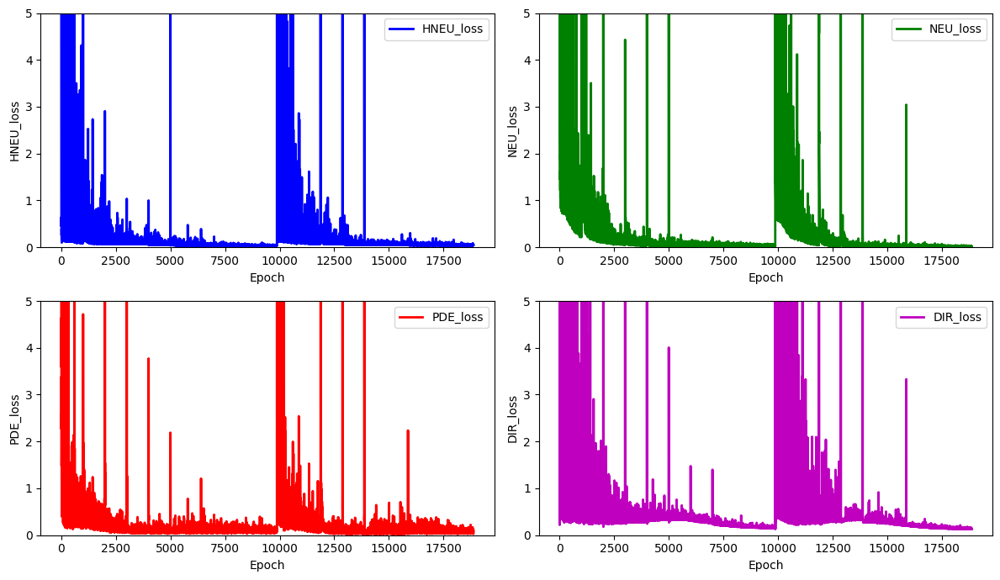

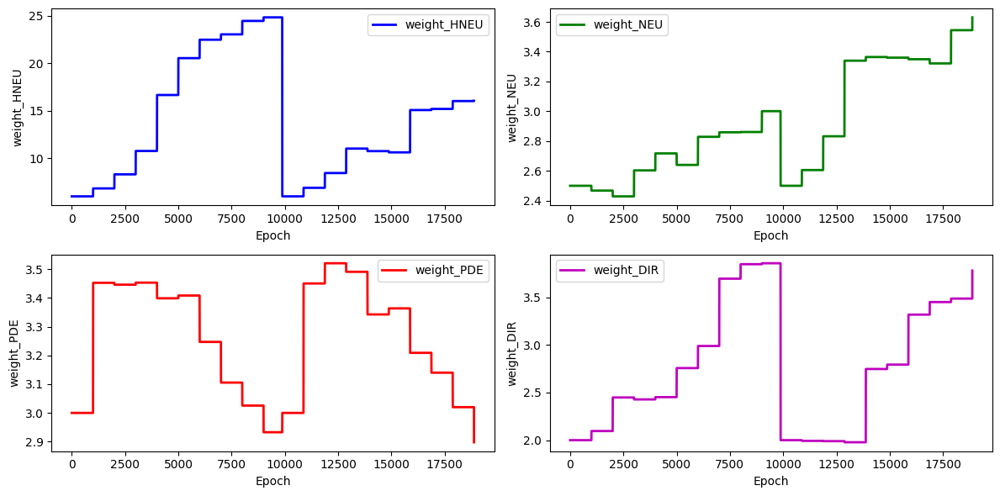

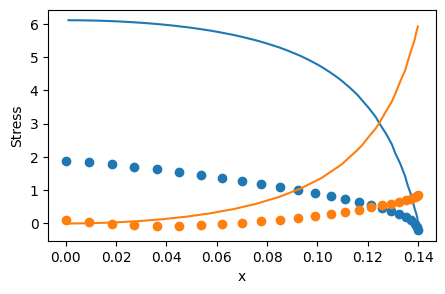

100%|██████████| 9876/9876 [4:22:13<00:00,  1.59s/it]

total_loss: 0.2475837787116659, hole_loss:  0.055087439311747685, neumann_loss:  0.011198482209298274, pde_loss: 0.05833423293254251, dirichlet_loss: 0.12296362425807744
previous lowest lost  1.98810521487663
lowest loss 1.5591395651941398 archived, PINN is saved: 'net_param/net_1.55913957.pth


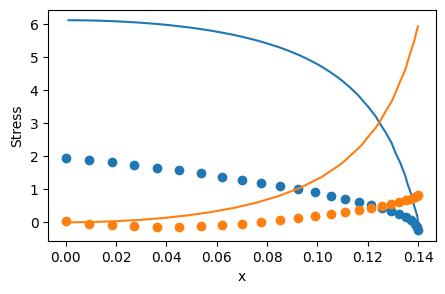

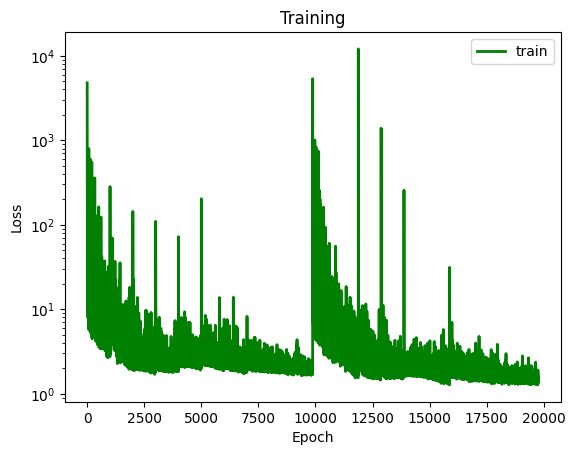

Weight_HNEU: 6.0, Weight_NEU: 2.5, Weight_PDE: 3.0, Weight_STRESS: 1.0, Stress Error: 19.653241969970015
The weights have been successfully changed.
The weights have been successfully changed.
The weights have been successfully changed.
The weights have been successfully changed.
The weights have been successfully changed.
Starting with Adam optimizer...


 10%|█         | 999/9876 [26:05<3:49:51,  1.55s/it]

Epoch 1000, batch 0: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(3.2240)
L2 norm of gradient for neumann_losses_nd:  tensor(44.4986)
L2 norm of gradient for pde_losses_nd:  tensor(75.4968)
L2 norm of gradient for dirichlet_losses_nd:  tensor(29.5161)
Epoch 1000, batch 1: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(9.0271)
L2 norm of gradient for neumann_losses_nd:  tensor(92.5760)
L2 norm of gradient for pde_losses_nd:  tensor(69.0368)
L2 norm of gradient for dirichlet_losses_nd:  tensor(17.4884)
Epoch 1000, batch 2: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(9.7898)
L2 norm of gradient for neumann_losses_nd:  tensor(22.4493)
L2 norm of gradient for pde_losses_nd:  tensor(78.4129)
L2 norm of gradient for dirichlet_losses_nd:  tensor(28.9894)
Epoch 1000, batch 3: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(5.5891)
L2 norm of gradient for neumann_losses_nd:  te

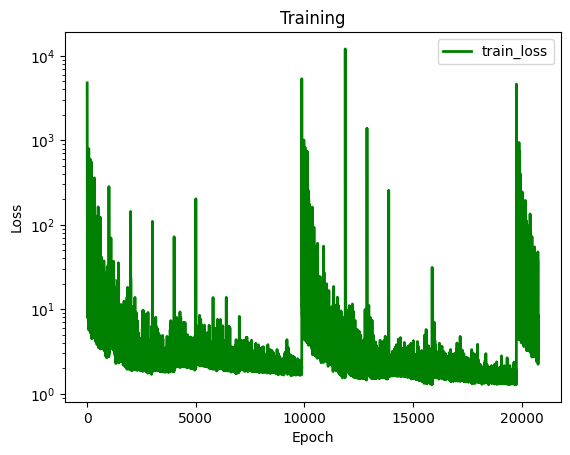

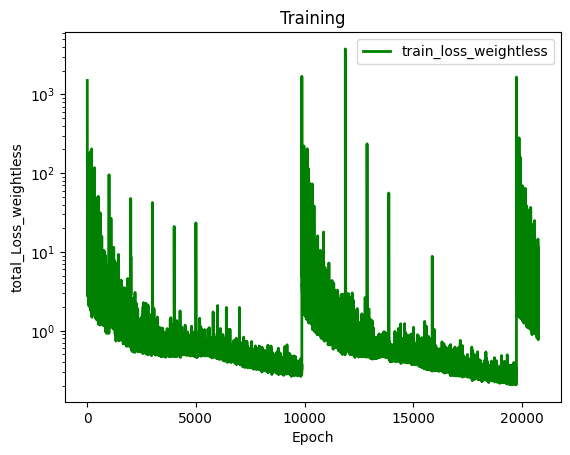

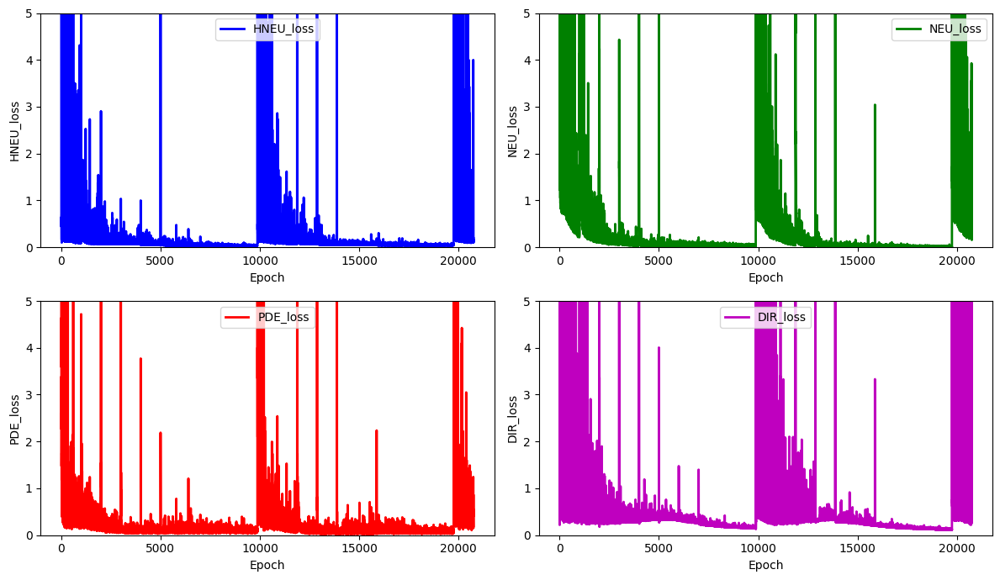

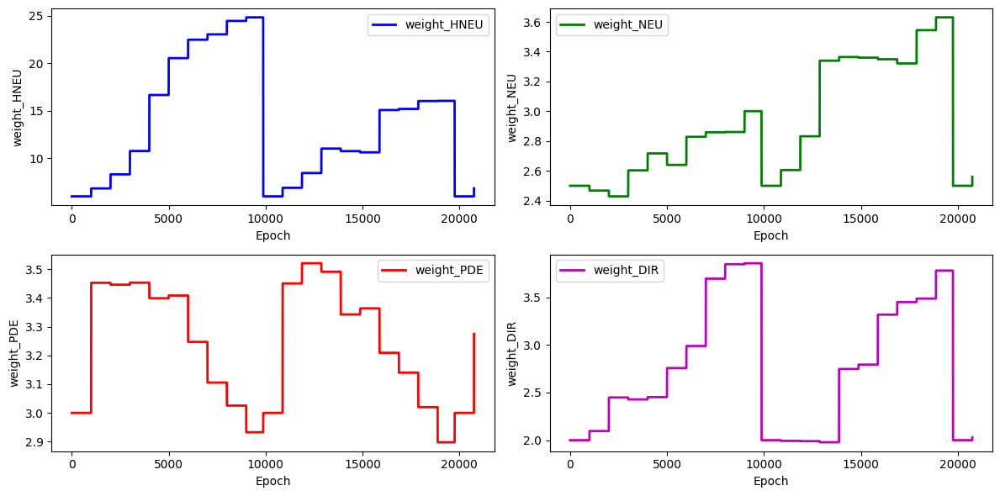

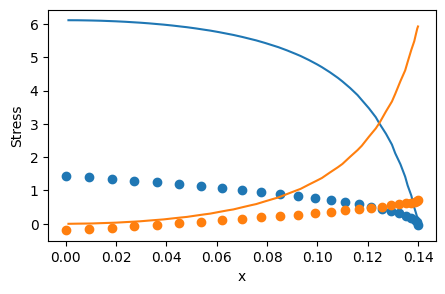

 20%|██        | 1999/9876 [52:44<3:31:46,  1.61s/it]

Epoch 2000, batch 0: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(8.0965)
L2 norm of gradient for neumann_losses_nd:  tensor(19.4134)
L2 norm of gradient for pde_losses_nd:  tensor(24.4950)
L2 norm of gradient for dirichlet_losses_nd:  tensor(15.9913)
Epoch 2000, batch 1: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(5.5070)
L2 norm of gradient for neumann_losses_nd:  tensor(16.5459)
L2 norm of gradient for pde_losses_nd:  tensor(17.9372)
L2 norm of gradient for dirichlet_losses_nd:  tensor(12.7696)
Epoch 2000, batch 2: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(4.3028)
L2 norm of gradient for neumann_losses_nd:  tensor(23.0344)
L2 norm of gradient for pde_losses_nd:  tensor(19.9188)
L2 norm of gradient for dirichlet_losses_nd:  tensor(5.4379)
Epoch 2000, batch 3: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(3.1016)
L2 norm of gradient for neumann_losses_nd:  ten

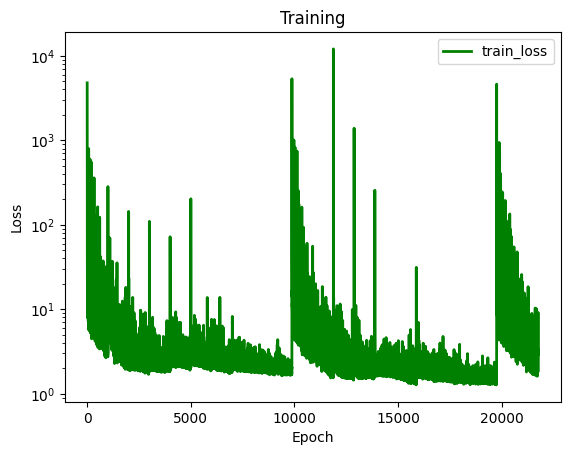

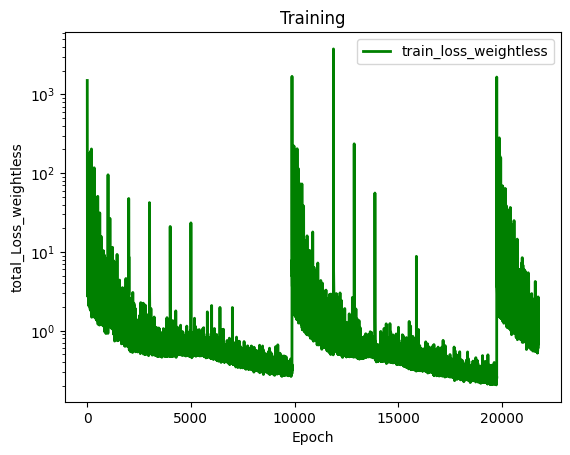

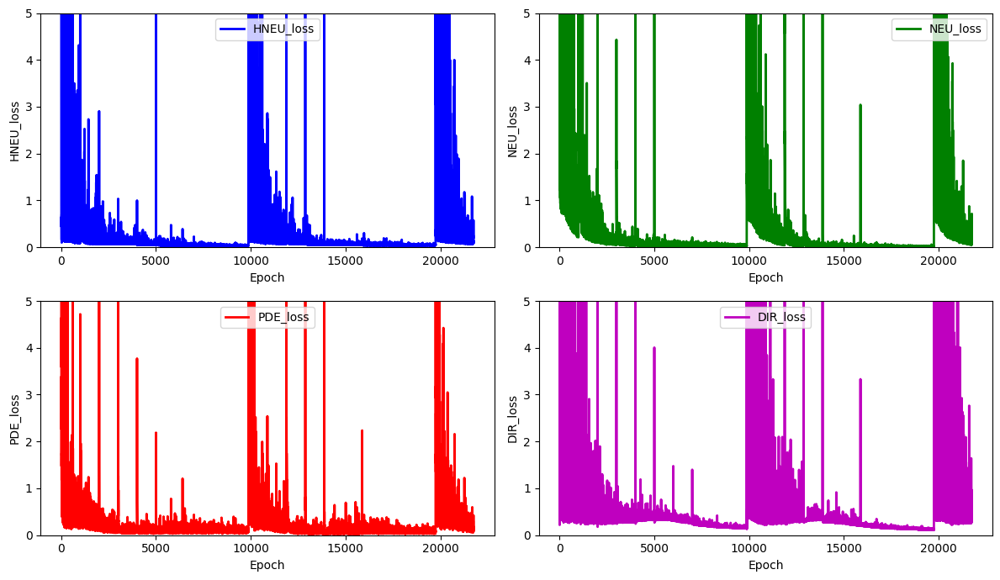

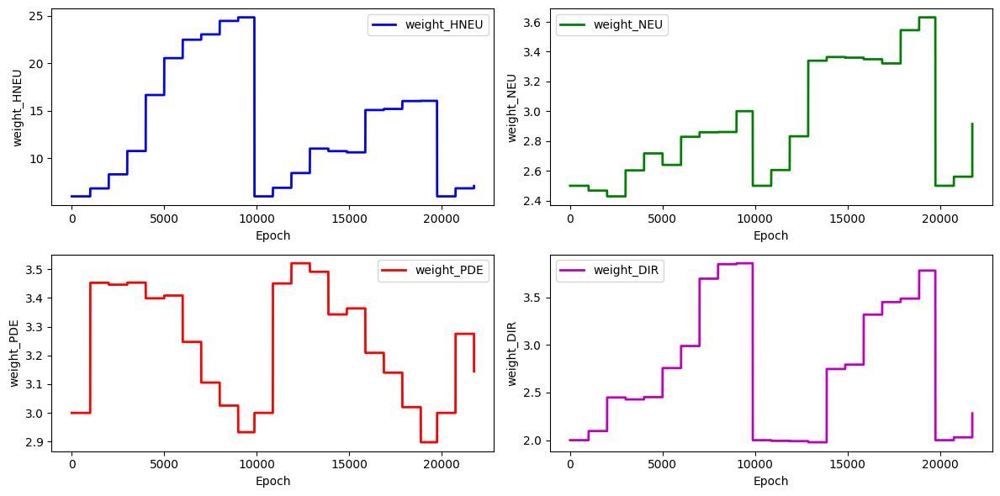

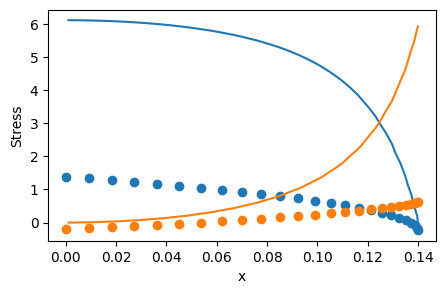

 30%|███       | 2999/9876 [1:19:00<3:00:50,  1.58s/it]

Epoch 3000, batch 0: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(4.8143)
L2 norm of gradient for neumann_losses_nd:  tensor(9.5494)
L2 norm of gradient for pde_losses_nd:  tensor(10.1219)
L2 norm of gradient for dirichlet_losses_nd:  tensor(18.3388)
Epoch 3000, batch 1: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(3.4386)
L2 norm of gradient for neumann_losses_nd:  tensor(8.5289)
L2 norm of gradient for pde_losses_nd:  tensor(14.8902)
L2 norm of gradient for dirichlet_losses_nd:  tensor(13.2854)
Epoch 3000, batch 2: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(2.8907)
L2 norm of gradient for neumann_losses_nd:  tensor(10.8150)
L2 norm of gradient for pde_losses_nd:  tensor(23.3257)
L2 norm of gradient for dirichlet_losses_nd:  tensor(6.3673)
Epoch 3000, batch 3: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(2.0556)
L2 norm of gradient for neumann_losses_nd:  tenso

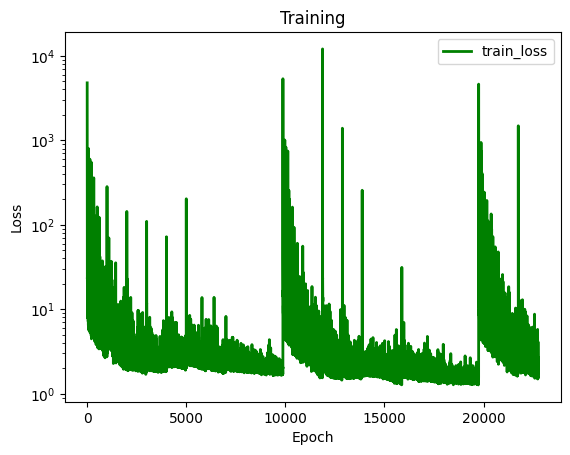

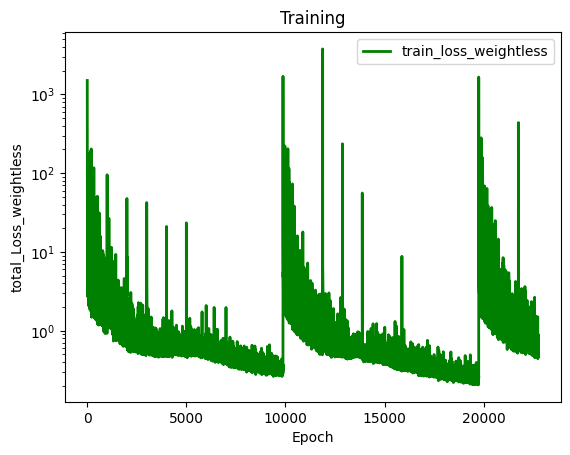

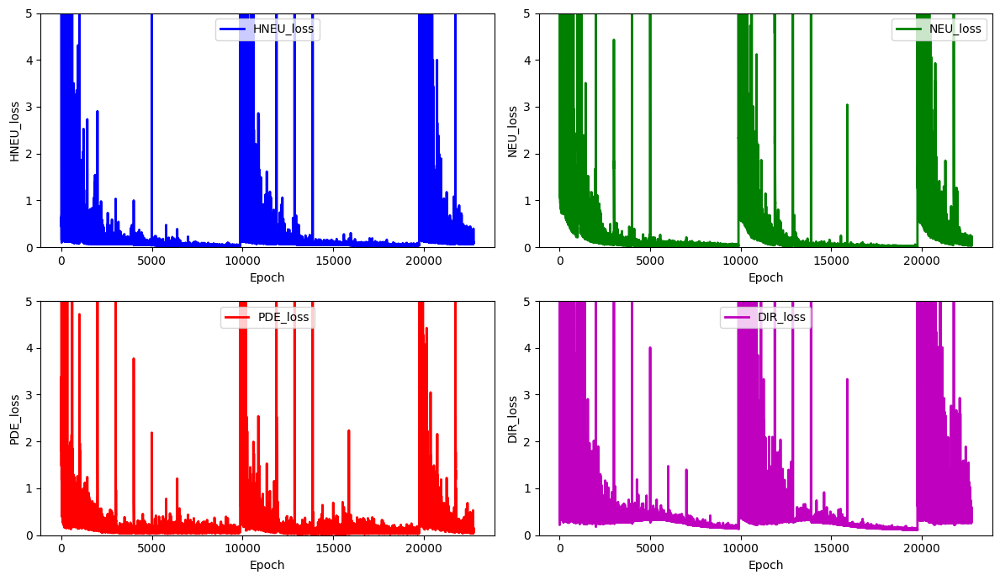

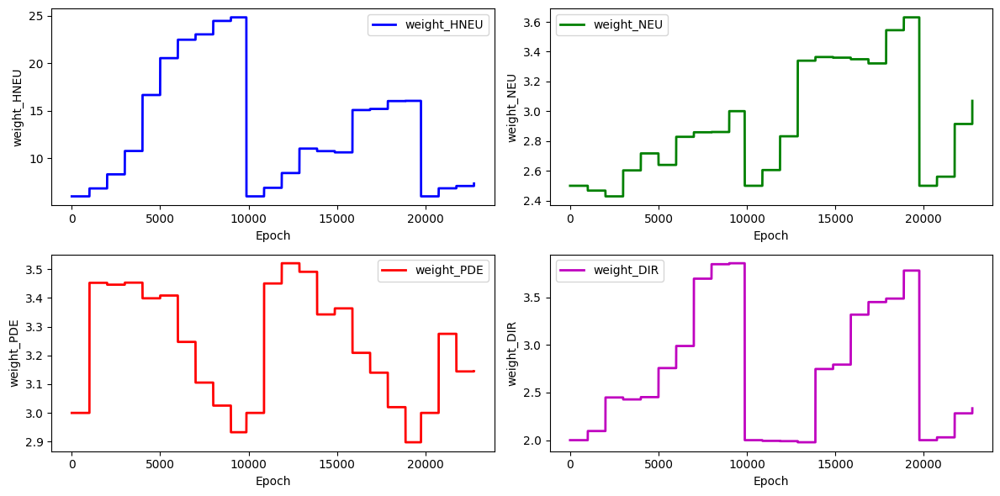

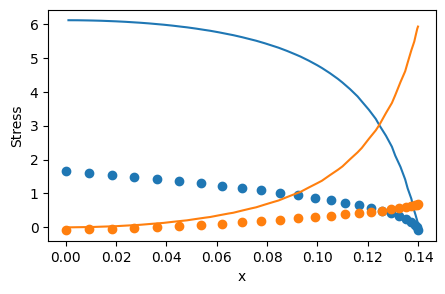

 40%|████      | 3999/9876 [1:45:49<2:36:29,  1.60s/it]

Epoch 4000, batch 0: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(1.3454)
L2 norm of gradient for neumann_losses_nd:  tensor(6.5520)
L2 norm of gradient for pde_losses_nd:  tensor(5.5808)
L2 norm of gradient for dirichlet_losses_nd:  tensor(3.9809)
Epoch 4000, batch 1: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(1.0134)
L2 norm of gradient for neumann_losses_nd:  tensor(5.0624)
L2 norm of gradient for pde_losses_nd:  tensor(6.9735)
L2 norm of gradient for dirichlet_losses_nd:  tensor(4.2505)
Epoch 4000, batch 2: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(1.1235)
L2 norm of gradient for neumann_losses_nd:  tensor(6.2693)
L2 norm of gradient for pde_losses_nd:  tensor(6.8540)
L2 norm of gradient for dirichlet_losses_nd:  tensor(3.3343)
Epoch 4000, batch 3: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(1.0148)
L2 norm of gradient for neumann_losses_nd:  tensor(4.91

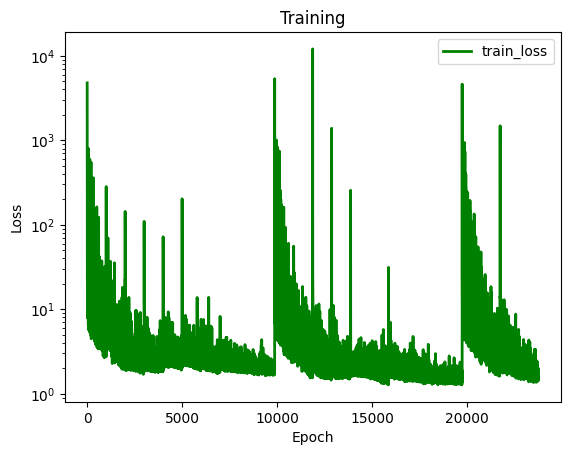

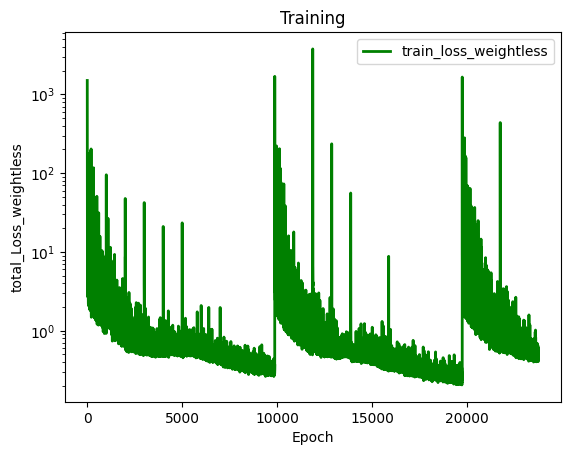

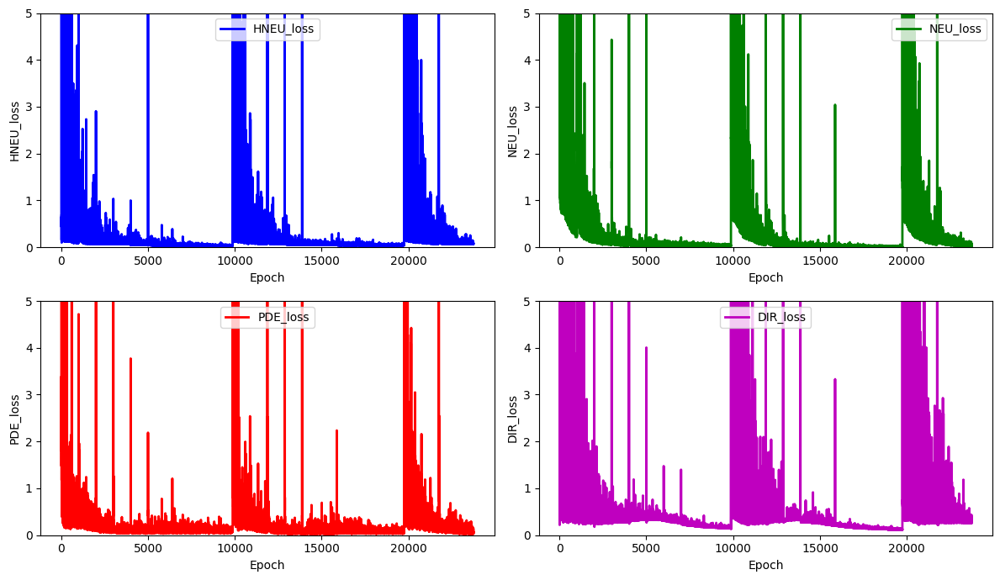

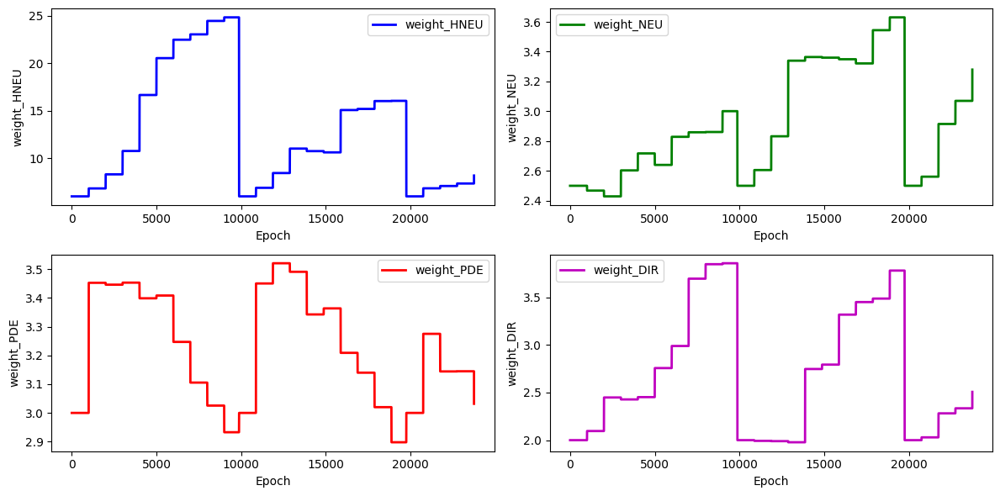

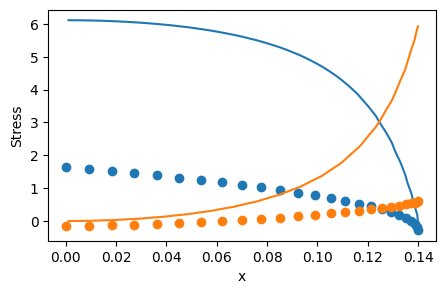

 51%|█████     | 4999/9876 [2:13:19<2:13:10,  1.64s/it]

Epoch 5000, batch 0: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(0.9767)
L2 norm of gradient for neumann_losses_nd:  tensor(3.2279)
L2 norm of gradient for pde_losses_nd:  tensor(5.5711)
L2 norm of gradient for dirichlet_losses_nd:  tensor(3.8196)
Epoch 5000, batch 1: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(1.4707)
L2 norm of gradient for neumann_losses_nd:  tensor(4.3938)
L2 norm of gradient for pde_losses_nd:  tensor(6.1060)
L2 norm of gradient for dirichlet_losses_nd:  tensor(2.8777)
Epoch 5000, batch 2: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(2.0287)
L2 norm of gradient for neumann_losses_nd:  tensor(3.6546)
L2 norm of gradient for pde_losses_nd:  tensor(10.4450)
L2 norm of gradient for dirichlet_losses_nd:  tensor(5.6107)
Epoch 5000, batch 3: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(1.8617)
L2 norm of gradient for neumann_losses_nd:  tensor(4.1

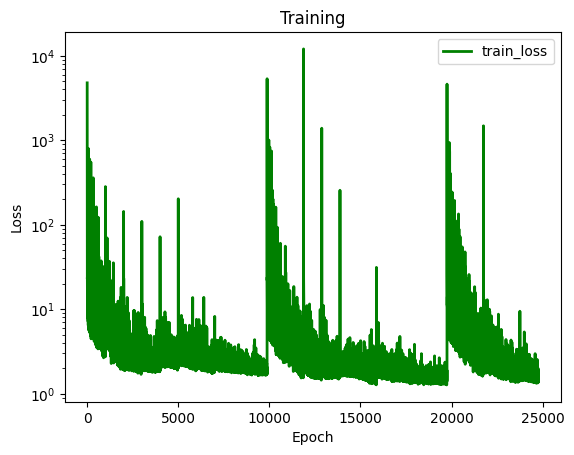

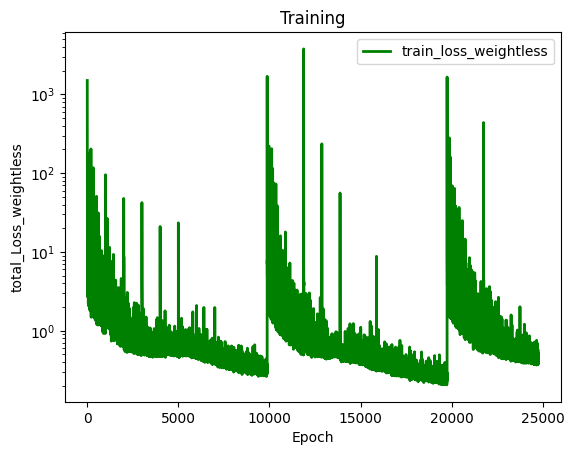

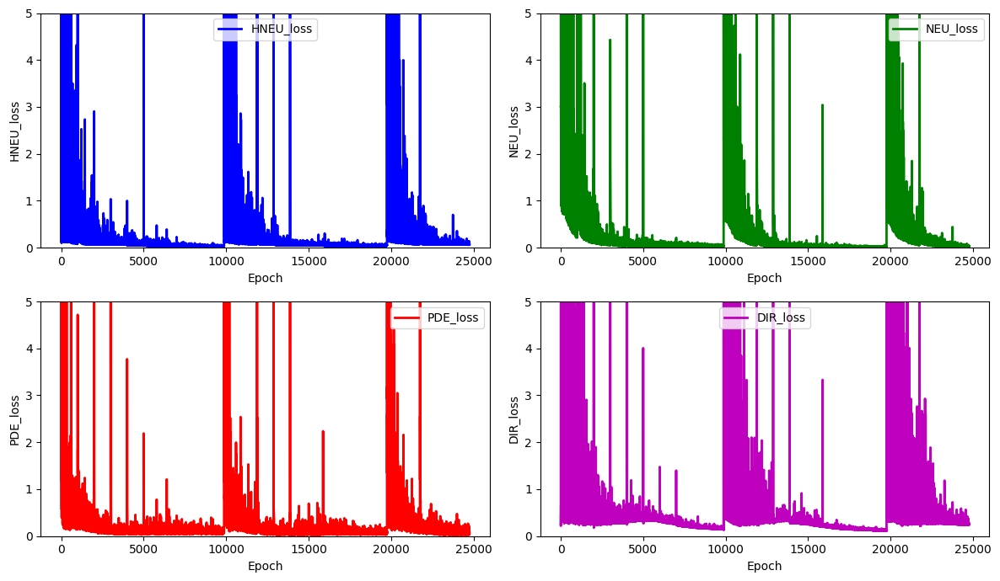

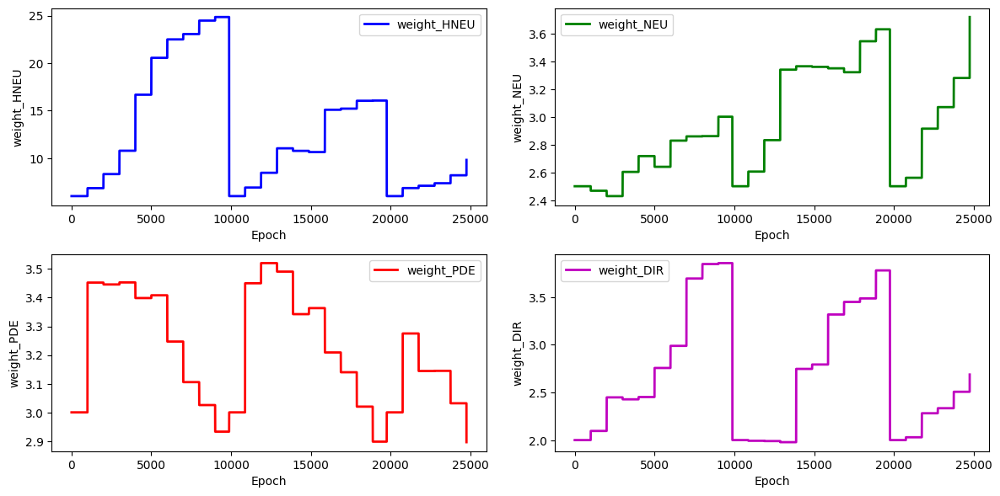

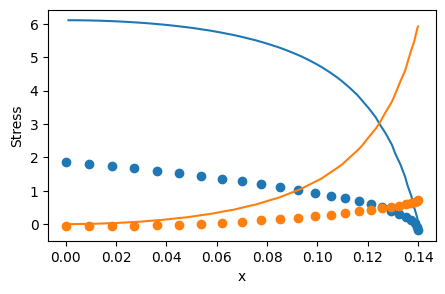

 61%|██████    | 5999/9876 [2:40:02<1:41:34,  1.57s/it]

Epoch 6000, batch 0: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(1.4892)
L2 norm of gradient for neumann_losses_nd:  tensor(3.6262)
L2 norm of gradient for pde_losses_nd:  tensor(9.3559)
L2 norm of gradient for dirichlet_losses_nd:  tensor(3.3273)
Epoch 6000, batch 1: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(1.2922)
L2 norm of gradient for neumann_losses_nd:  tensor(2.5815)
L2 norm of gradient for pde_losses_nd:  tensor(8.5066)
L2 norm of gradient for dirichlet_losses_nd:  tensor(3.3411)
Epoch 6000, batch 2: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(1.1970)
L2 norm of gradient for neumann_losses_nd:  tensor(1.2685)
L2 norm of gradient for pde_losses_nd:  tensor(8.1847)
L2 norm of gradient for dirichlet_losses_nd:  tensor(1.5675)
Epoch 6000, batch 3: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(0.7905)
L2 norm of gradient for neumann_losses_nd:  tensor(2.38

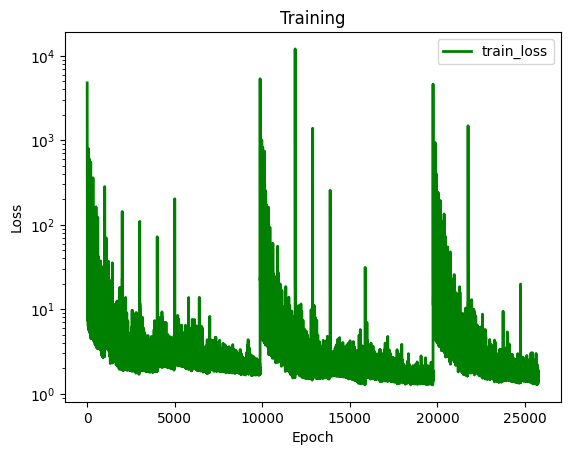

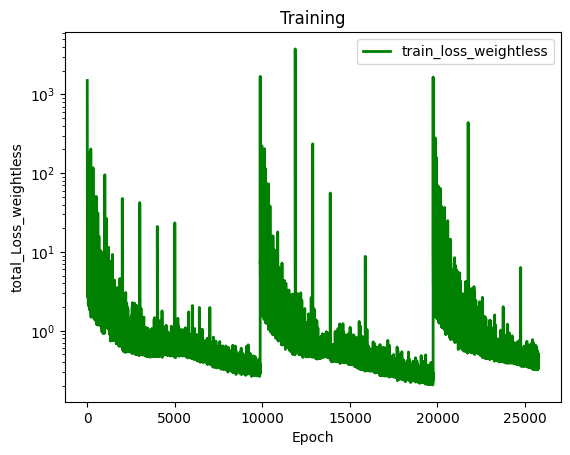

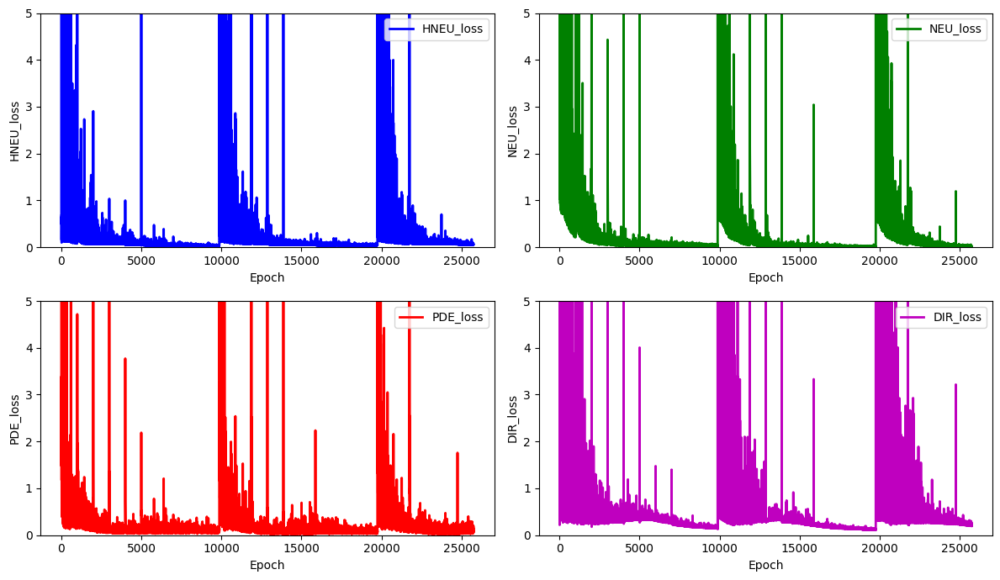

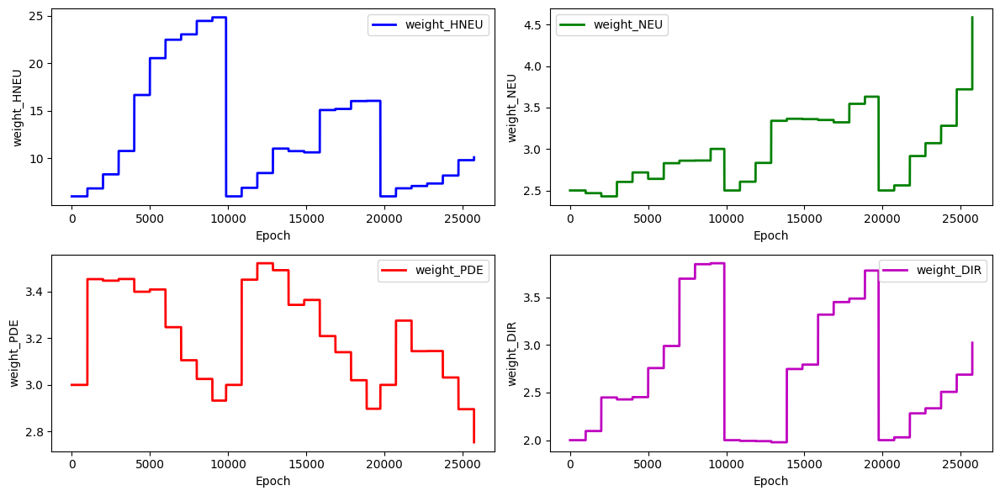

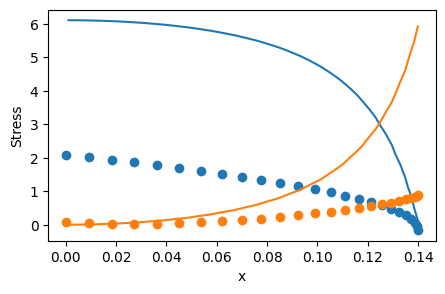

 71%|███████   | 6999/9876 [3:07:18<1:21:00,  1.69s/it]

Epoch 7000, batch 0: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(1.1270)
L2 norm of gradient for neumann_losses_nd:  tensor(3.5493)
L2 norm of gradient for pde_losses_nd:  tensor(9.5657)
L2 norm of gradient for dirichlet_losses_nd:  tensor(4.2884)
Epoch 7000, batch 1: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(1.0671)
L2 norm of gradient for neumann_losses_nd:  tensor(2.3745)
L2 norm of gradient for pde_losses_nd:  tensor(5.5360)
L2 norm of gradient for dirichlet_losses_nd:  tensor(4.5701)
Epoch 7000, batch 2: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(0.9856)
L2 norm of gradient for neumann_losses_nd:  tensor(3.8830)
L2 norm of gradient for pde_losses_nd:  tensor(6.1895)
L2 norm of gradient for dirichlet_losses_nd:  tensor(3.5411)
Epoch 7000, batch 3: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(1.4318)
L2 norm of gradient for neumann_losses_nd:  tensor(3.61

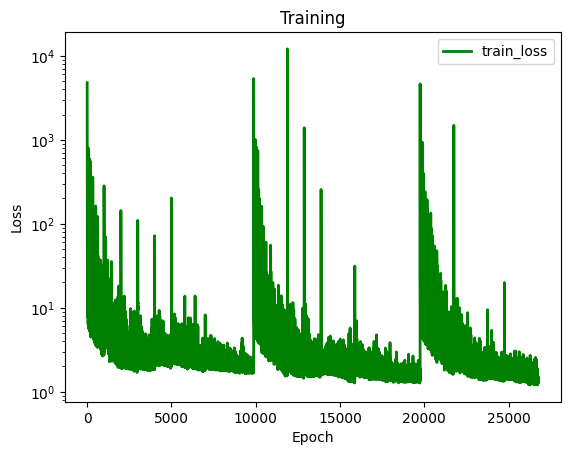

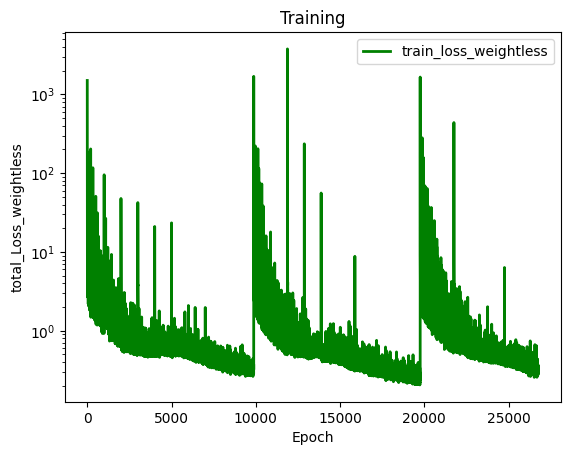

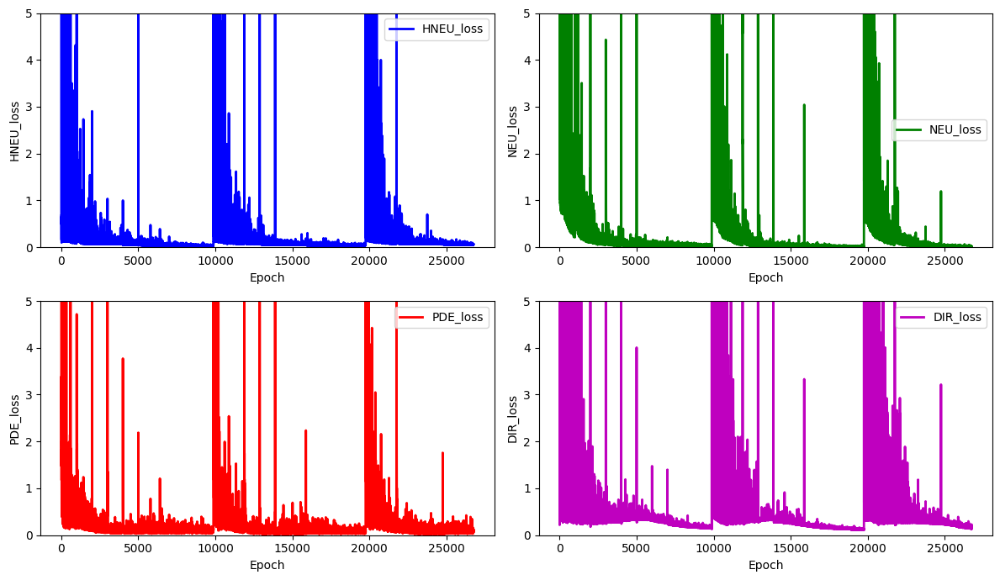

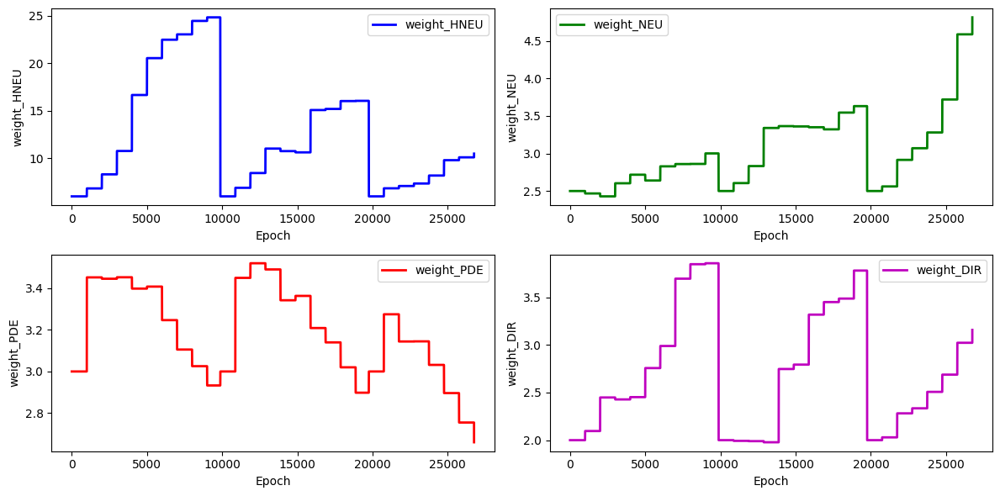

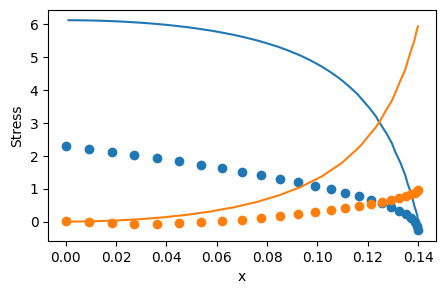

 81%|████████  | 7999/9876 [3:34:01<50:00,  1.60s/it]  

Epoch 8000, batch 0: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(1.1183)
L2 norm of gradient for neumann_losses_nd:  tensor(1.5691)
L2 norm of gradient for pde_losses_nd:  tensor(6.8263)
L2 norm of gradient for dirichlet_losses_nd:  tensor(3.1207)
Epoch 8000, batch 1: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(1.2111)
L2 norm of gradient for neumann_losses_nd:  tensor(1.7155)
L2 norm of gradient for pde_losses_nd:  tensor(9.6627)
L2 norm of gradient for dirichlet_losses_nd:  tensor(3.4392)
Epoch 8000, batch 2: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(0.4504)
L2 norm of gradient for neumann_losses_nd:  tensor(1.1339)
L2 norm of gradient for pde_losses_nd:  tensor(7.9368)
L2 norm of gradient for dirichlet_losses_nd:  tensor(2.2762)
Epoch 8000, batch 3: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(0.4830)
L2 norm of gradient for neumann_losses_nd:  tensor(1.41

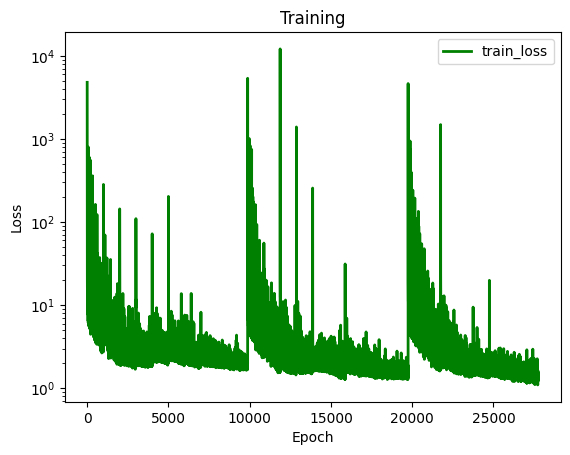

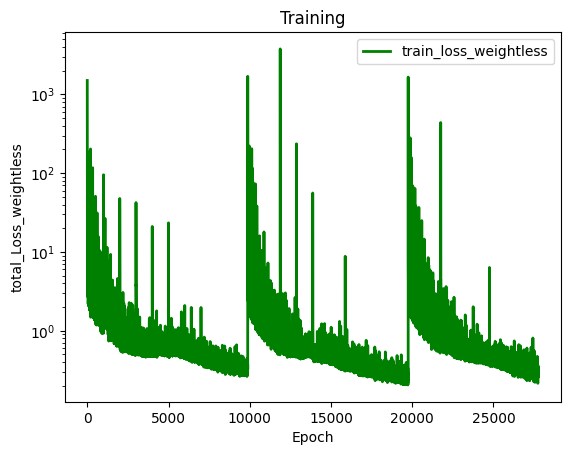

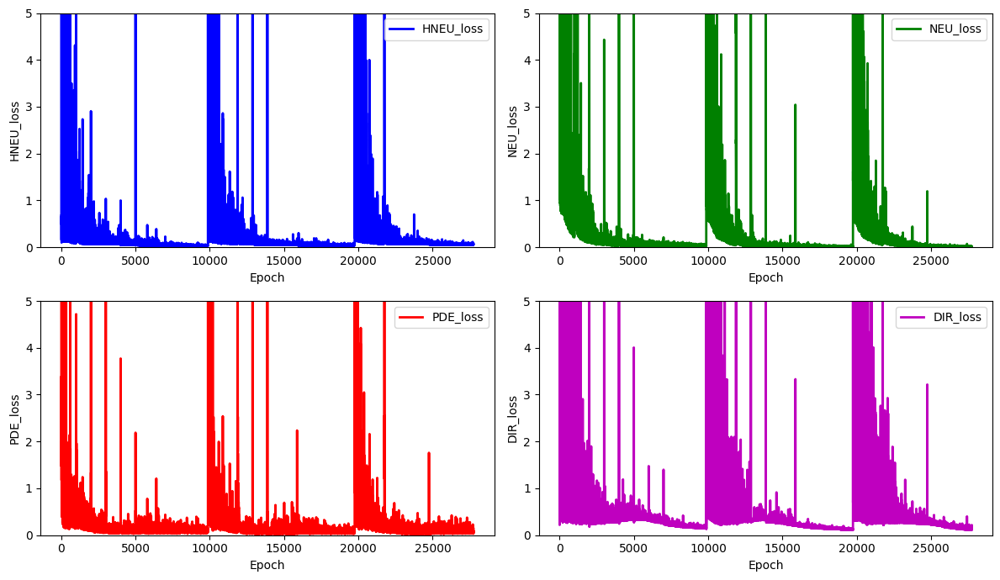

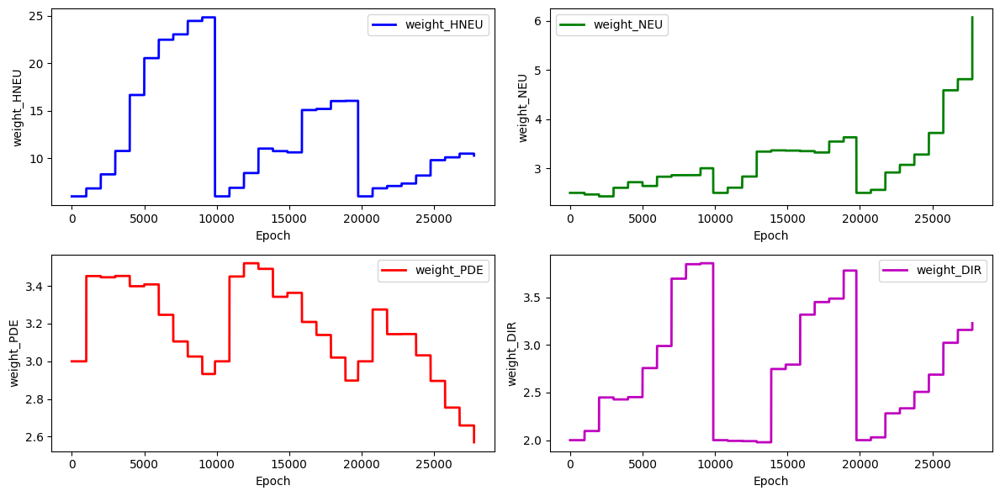

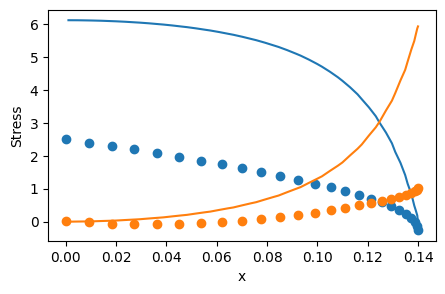

 91%|█████████ | 8999/9876 [4:01:51<25:22,  1.74s/it]  

Epoch 9000, batch 0: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(3.4123)
L2 norm of gradient for neumann_losses_nd:  tensor(1.9113)
L2 norm of gradient for pde_losses_nd:  tensor(17.6365)
L2 norm of gradient for dirichlet_losses_nd:  tensor(3.4072)
Epoch 9000, batch 1: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(3.3236)
L2 norm of gradient for neumann_losses_nd:  tensor(1.7823)
L2 norm of gradient for pde_losses_nd:  tensor(12.0903)
L2 norm of gradient for dirichlet_losses_nd:  tensor(2.9103)
Epoch 9000, batch 2: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(1.6790)
L2 norm of gradient for neumann_losses_nd:  tensor(1.8783)
L2 norm of gradient for pde_losses_nd:  tensor(8.9542)
L2 norm of gradient for dirichlet_losses_nd:  tensor(1.8200)
Epoch 9000, batch 3: computing gradients
L2 norm of gradient for hole_neumann_losses_nd:  tensor(0.9394)
L2 norm of gradient for neumann_losses_nd:  tensor(2.

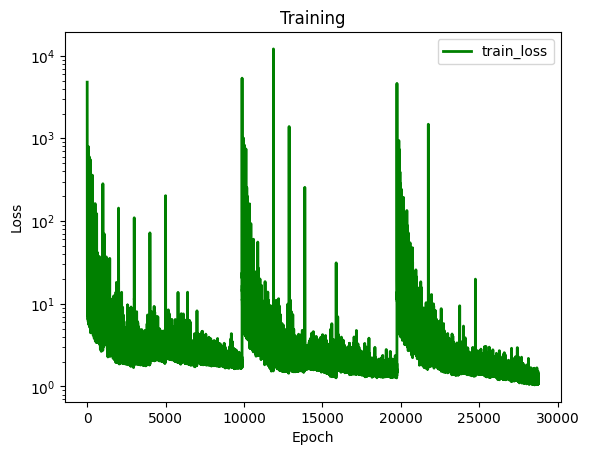

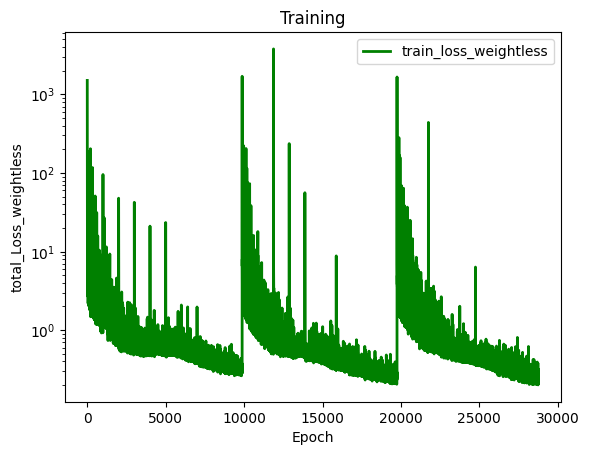

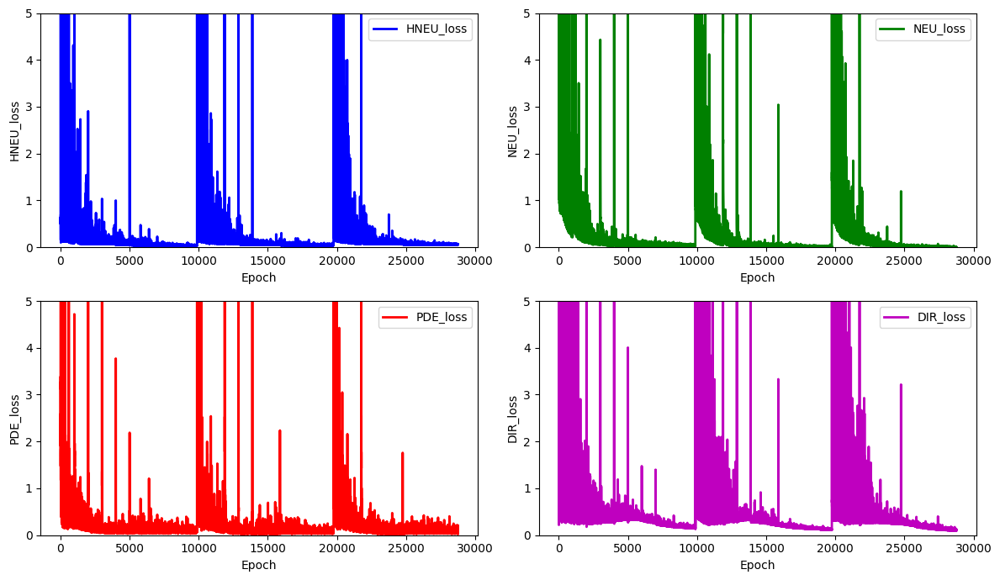

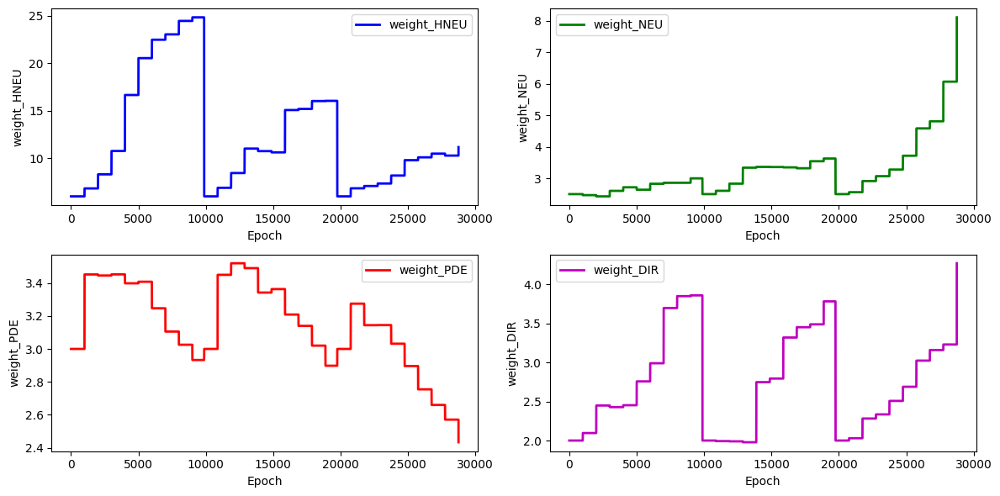

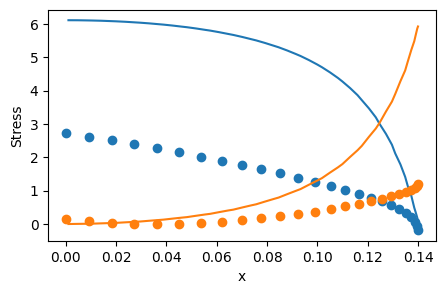

100%|██████████| 9876/9876 [4:26:08<00:00,  1.62s/it]

total_loss: 0.2615313348846875, hole_loss:  0.06529834774891213, neumann_loss:  0.013390297984348007, pde_loss: 0.07214111382846697, dirichlet_loss: 0.11070157532296036
previous lowest lost  1.5591395651941398
lowest loss 1.487014010419508 archived, PINN is saved: 'net_param/net_1.48701401.pth


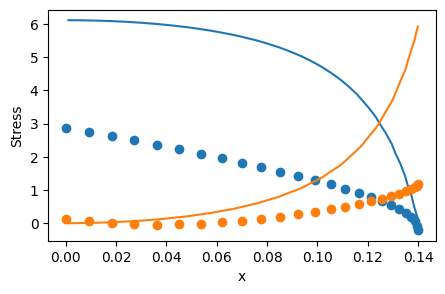

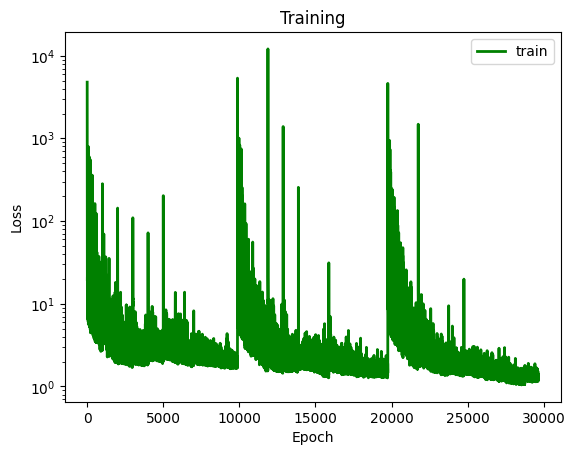

Weight_HNEU: 6.0, Weight_NEU: 2.5, Weight_PDE: 3.0, Weight_STRESS: 1.0, Stress Error: 15.708938314002918


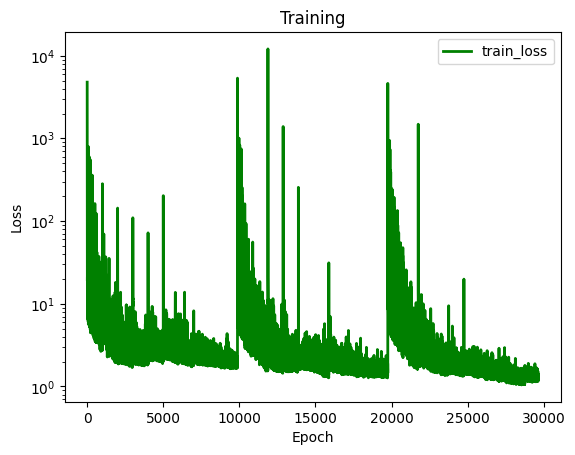

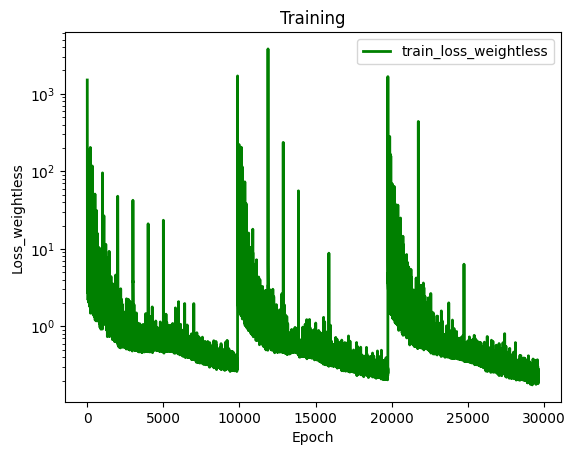

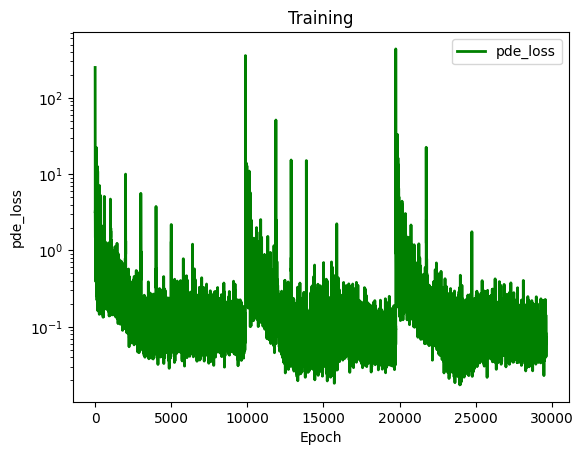

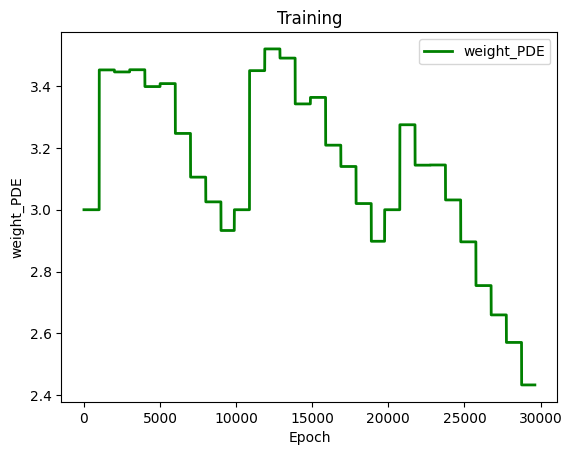

In [43]:

#scheduler = ExponentialLR(optimizer, gamma=0.999)
loss_history = []
HNEU_loss_history = []
PDE_loss_history = []
NEU_loss_history = []
DIR_loss_history = []
loss_weightless_history = []
weightHNEU_history = []
weightNEU_history = []
weightPDE_history = []
weightDIR_history = []


# Weight of PDE lossWeight_NEU: 1.8841683879627231e-06, Weight_PDE: 3.1355081392423563e-06
# Weight of Neumann loss explicitly for the right and top boundary condition
W_NEU = 6.4531255763296895e-06 #previous value -> 1.88e-06
# Weight of Neumann loss explicitly for the hole boundary condition
W_HNEU = 8.2e-05
W_PDE = 8.376708219353885e-06 #previous value -> 3.14e-06
# Weight of data losses
W_DIR = 1.0
W_STRESS = 0.0 #previous value -> 1.0e-07 
W_DISP = 0.0


target_loss = torch.tensor(5)

#Weight_NEU and Weight_PDE 
Weight_NEU = torch.tensor(W_NEU, requires_grad=True) #previous value -> 6.4531255763296895e-06
Weight_HNEU = torch.tensor(W_HNEU, requires_grad=True)
Weight_PDE = torch.tensor(W_PDE, requires_grad=True) #previous value -> 8.376708219353885e-06
Weight_DIR = torch.tensor(W_DIR, requires_grad=True)
Weight_STRESS = torch.tensor(W_STRESS, requires_grad=True)

#set all weights to 1 
Weight_NEU = torch.tensor(4.0, requires_grad=True) #previous value -> 6.4531255763296895e-06
Weight_HNEU = torch.tensor(6.0, requires_grad=True)
Weight_PDE = torch.tensor(3.0, requires_grad=True) #previous value -> 8.376708219353885e-06
Weight_DIR = torch.tensor(3.5, requires_grad=True)
Weight_STRESS = torch.tensor(1.0, requires_grad=True)


char_HNEU_loss= torch.tensor(0.3)#torch.tensor(0.029125697950096088)
char_NEU_loss = torch.tensor(0.3) #torch.tensor(0.7272956427332002)
char_pde_loss = torch.tensor(0.6)#torch.tensor(0.6245099393893354)
char_dirichlet_loss = torch.tensor(5.10e-05)#torch.tensor(1.10e-06)

# #constants for weight and Loss Non-dimensionalization
# slope = 1
# # Aggregate losses

# # Compute physics losses
# left_l, right_l, bottom_l, top_l, hole_l, pde_l = compute_physics_losses(collocation, top, right, left, bottom, hole)
# dirichlet_losses = left_l + bottom_l 
# neumann_losses = right_l + top_l 
# hole_neumann_losses = hole_l
# loss = (
#     dirichlet_losses
#     + Weight_NEU * neumann_losses
#     + Weight_HNEU * hole_neumann_losses
#     + Weight_PDE * pde_l
# )
# #selecting characteristic values:
# char_HNEU_loss= 0.029125697950096088, 
# char_NEU_loss = 0.7272956427332002
# char_pde_loss = 0.6245099393893354
# char_dirichlet_loss: 1.1044902637681307e-06

# #non dimensionalization of the loss function
# hole_neumann_losses_nd = hole_l / char_HNEU_loss
# neumann_losses_nd = (right_l + top_l) / char_NEU_loss
# pde_losses_nd = pde_l / char_pde_loss
# dirichlet_losses_nd = (left_l + bottom_l) / char_dirichlet_loss

# #compute total loss
# loss = (
#     Weight_HNEU * hole_neumann_losses_nd 
#     + Weight_NEU * neumann_losses_nd 
#     + Weight_PDE * pde_losses_nd 
#     + Weight_DIR * dirichlet_losses_nd 
# )





def training(compare_rad_x, target_loss):

    #reset all net parameters 
    #net.apply(weight_reset)

    #hyperparameter weights
    weights = [Weight_HNEU, Weight_NEU, Weight_PDE, Weight_DIR]
    
    
    p1 = Plate(compare_rad_x, N, M) 
    data_input, data_output, data_hole = p1.load_reference_data()
    compare_collo, compare_top, compare_right, compare_left, compare_bottom, compare_hole = p1.generate_dataset()

    #collocation, top, right, left, bottom, hole = generate_multiple_plates(0.04, 0.18, 0.01)
    collocation, top, right, left, bottom, hole = generate_multiple_plates(0.14, 0.14, 0.0)
    data_hole = data_hole.numpy()
    data_hole = data_hole[data_hole[:, 0].argsort()]
    data_stress_x = data_hole[:, 2]
    data_stress_y = data_hole[:, 3]

    #interpolate data_stress_x and data_stress_y
    f_stress_x = interp1d(data_hole[:, 0], data_hole[:, 2], kind='cubic')
    f_stress_y = interp1d(data_hole[:, 0], data_hole[:, 3], kind='cubic')
    x_new = np.linspace(data_hole[:, 0][-1], data_hole[:, 0][0], compare_hole[:, 0].size(dim=0))
    y_stress_x = f_stress_x(x_new)
    y_stress_y = f_stress_y(x_new)

    optimizer = torch.optim.Adam(net.parameters(), lr=lr)
    #scheduler = StepLR(optimizer, step_size=scheduler_step, gamma=scheduler_gamma)
    scheduler = ExponentialLR(optimizer,  gamma= expo_gamma)
    print("Starting with Adam optimizer...")
    for epoch in tqdm(range(epochs)):

        # Reset batch count at the start of each epoch
        batch_count = 0

        # Permutation to shuffle collocation points randomly in each epoch
        permutation = torch.randperm(collocation.size()[0])

        for i in range(0, collocation.size()[0], batch_size):
            indices = permutation[i : i + batch_size]
            collo = collocation[indices]
            optimizer.zero_grad()

            # Compute physics losses
            left_l, right_l, bottom_l, top_l, hole_l, pde_l = compute_physics_losses(collo, top, right, left, bottom, hole)

            if W_DISP < 1E-10 and W_STRESS < 1E-10:
                # No data losses needed (we can accelerate training by skipping this part)
                stress_l = 0.0
                disp_l = 0.0
            else:
                # Get samples from reference solution
                samples = torch.randperm(data_output.size()[0])[::100]
                # Reference solutions
                s_data = data_output[samples, 0:3]
                e_data = data_output[samples, 4:7]
                u_data = data_output[samples, 7:10]
                # Predictions
                s_pred = torch.vmap(sigma)(data_input[samples, 0:3])
                e_pred = torch.vmap(epsilon)(data_input[samples, 0:3])
                u_pred = net(data_input[samples, 0:3])
                # Compute data losses
                ds_xx = mse(s_data[:, 0], s_pred[:, 0, 0])
                ds_yy = mse(s_data[:, 1], s_pred[:, 1, 1])
                ds_xy = mse(s_data[:, 2], s_pred[:, 0, 1])
                stress_l = ds_xx + ds_yy + ds_xy
                du_x = mse(u_data[:, 0], u_pred[:, 0])
                du_y = mse(u_data[:, 1], u_pred[:, 1])
                disp_l = du_x + du_y

            # Aggregate losses
            # dirichlet_losses = left_l + bottom_l 
            # neumann_losses = right_l + top_l 
            # hole_neumann_losses = hole_l
            # loss = (
            #     dirichlet_losses
            #     + Weight_NEU * neumann_losses
            #     + Weight_HNEU * hole_neumann_losses
            #     + Weight_PDE * pde_l
            #     + Weight_STRESS * stress_l
            #     #+ W_DISP * disp_l
            # )

            #non dimensionalization of the loss function
            hole_neumann_losses_nd = hole_l / char_NEU_loss
            neumann_losses_nd = (right_l + top_l) / char_NEU_loss
            total_neumann_loss_nd = (right_l + top_l + hole_l) / char_NEU_loss
            pde_losses_nd = pde_l / char_pde_loss
            dirichlet_losses_nd = (left_l + bottom_l) / char_dirichlet_loss

            # if epoch <= HNEU_split *epochs:
            #     loss = (
            #             weights[1] * total_neumann_loss_nd  #Weight_NEU
            #             + weights[2] * pde_losses_nd #Weight_PDE 
            #             + weights[3] * dirichlet_losses_nd #Weight_DIR
            #             )
                
            #     loss_weightless = (
            #         hole_neumann_losses_nd 
            #         + neumann_losses_nd 
            #         + pde_losses_nd 
            #         + dirichlet_losses_nd 
            #     )
            # else: 
            loss = (
                    weights[0] * hole_neumann_losses_nd #Weight_HNEU 
                    + weights[1] * neumann_losses_nd  #Weight_NEU
                    + weights[2] * pde_losses_nd #Weight_PDE 
                    + weights[3] * dirichlet_losses_nd #Weight_DIR
                    )
            
            loss_weightless = (
                hole_neumann_losses_nd 
                + neumann_losses_nd 
                + pde_losses_nd 
                + dirichlet_losses_nd 
            )
            


            if (epoch+1) % step_size == 0:
                print(f"Epoch {epoch+1}, batch {batch_count}: computing gradients")
                # Get only the weight parameters
                weight_params = [param for name, param in net.named_parameters() if 'weight' in name]

                # Compute gradients for each loss
                grad_hole_neumann_losses_nd = torch.autograd.grad(hole_neumann_losses_nd, weight_params, retain_graph=True)[0]
                grad_neumann_losses_nd = torch.autograd.grad(neumann_losses_nd, weight_params, retain_graph=True)[0]
                grad_pde_losses_nd = torch.autograd.grad(pde_losses_nd, weight_params, retain_graph=True)[0]
                grad_dirichlet_losses_nd = torch.autograd.grad(dirichlet_losses_nd, weight_params, retain_graph=True)[0]

                # Compute L2 norm for each gradient
                norm_grad_hole_neumann_losses_nd = torch.linalg.norm(grad_hole_neumann_losses_nd)
                norm_grad_neumann_losses_nd = torch.linalg.norm(grad_neumann_losses_nd)
                norm_grad_pde_losses_nd = torch.linalg.norm(grad_pde_losses_nd)
                norm_grad_dirichlet_losses_nd = torch.linalg.norm(grad_dirichlet_losses_nd)

                # # Print the shape of each weight parameter
                # for weight in weight_params:
                #     print("weight_shape: ", weight.shape)

                # print("Gradient for hole_neumann_losses_nd: ", grad_hole_neumann_losses_nd.shape)
                # print("Gradient for neumann_losses_nd: ", grad_neumann_losses_nd.shape)
                # print("Gradient for pde_losses_nd: ", grad_pde_losses_nd.shape)
                # print("Gradient for dirichlet_losses_nd: ", grad_dirichlet_losses_nd.shape)

                print("L2 norm of gradient for hole_neumann_losses_nd: ", norm_grad_hole_neumann_losses_nd)
                print("L2 norm of gradient for neumann_losses_nd: ", norm_grad_neumann_losses_nd)
                print("L2 norm of gradient for pde_losses_nd: ", norm_grad_pde_losses_nd)
                print("L2 norm of gradient for dirichlet_losses_nd: ", norm_grad_dirichlet_losses_nd)

            # Make optimization step after batch
            loss.backward(retain_graph=True)

            optimizer.step()

            batch_count += 1     
            
            
        #update non dimensionalizated weights 
        if (epoch+1) % step_size == 0:
            print(f"adopting weights after {step_size} epochs")
            new_weights = [Weight_HNEU, Weight_NEU, Weight_PDE, Weight_DIR]
            norm_grad_losses_nd = [norm_grad_hole_neumann_losses_nd, norm_grad_neumann_losses_nd, norm_grad_pde_losses_nd, norm_grad_dirichlet_losses_nd]

            for index, weight in enumerate(weights):
                # print(f"Gradient of weight: {index} w.r.t to L: {weight.grad}, old_weight: {weight}")
                # print("weights_grad", weights[index].grad)
                # print("zeros", torch.zeros(1))
                # print("mse_of_weights_grad", mse(weights[index].grad, torch.zeros(1)))
                # print("squared_error of weights_grad", weights[index].grad*weights[index].grad)

                # Compute sum of all gradients for each loss
                weight_grad_sum = (
                    norm_grad_hole_neumann_losses_nd
                    + norm_grad_neumann_losses_nd
                    + norm_grad_pde_losses_nd
                    + norm_grad_dirichlet_losses_nd
                )

                new_weights[index] = weight_grad_sum/ norm_grad_losses_nd[index]

            #update new weights
            for index, weight in enumerate(weights):
                new_weight = 0.9*weight + 0.1*new_weights[index]
                weights[index] = new_weight.clone().detach().requires_grad_(True)
                print(f"for weight {index} new weight_value: {weights[index]}")

        # Make scheduler step after full epoch
        scheduler.step()  

  
        
        # append loss to history (=for plotting)
        with torch.autograd.no_grad():
            loss_history.append(float(loss.data))
            loss_weightless_history.append(float(loss_weightless.data))
            HNEU_loss_history.append(float(hole_neumann_losses_nd))
            NEU_loss_history.append(float(neumann_losses_nd))
            PDE_loss_history.append(float(pde_losses_nd))
            DIR_loss_history.append(float(dirichlet_losses_nd))
            weightHNEU_history.append(float(weights[0]))
            weightNEU_history.append(float(weights[1]))
            weightPDE_history.append(float(weights[2]))
            weightDIR_history.append(float(weights[3]))
            

        #print progress during training
        if (epoch+1) % step_size == 0:
            print(f"total_loss: {loss_weightless.data}, hole_loss:  {hole_neumann_losses_nd}, neumann_loss:  {neumann_losses_nd}, pde_loss: {pde_losses_nd}, dirichlet_loss: {dirichlet_losses_nd}")
            
            with torch.autograd.no_grad():
                plt.plot(loss_history, c='g', label='train_loss', linewidth=2.0)
                plt.yscale("log")
                plt.title("Training")
                plt.ylabel("Loss")
                plt.xlabel("Epoch")
                plt.legend()
                plt.show()

                plt.plot(loss_weightless_history, c='g', label='train_loss_weightless', linewidth=2.0)
                plt.yscale("log")
                plt.title("Training")
                plt.ylabel("total_Loss_weightless")
                plt.xlabel("Epoch")
                plt.legend()
                plt.show()

                fig, axs = plt.subplots(2, 2, figsize=(12, 7))

                # plot for HNEU_loss_history
                axs[0, 0].plot(HNEU_loss_history, c='b', label='HNEU_loss', linewidth=2.0)
                axs[0, 0].set_ylabel("HNEU_loss")
                axs[0, 0].set_xlabel("Epoch")
                axs[0, 0].legend()
                axs[0, 0].set_ylim([0, 1])  

                # plot for NEU_loss_history
                axs[0, 1].plot(NEU_loss_history, c='g', label='NEU_loss', linewidth=2.0)
                axs[0, 1].set_ylabel("NEU_loss")
                axs[0, 1].set_xlabel("Epoch")
                axs[0, 1].legend()
                axs[0, 1].set_ylim([0, 1])  

                # plot for PDE_loss_history
                axs[1, 0].plot(PDE_loss_history, c='r', label='PDE_loss', linewidth=2.0)
                axs[1, 0].set_ylabel("PDE_loss")
                axs[1, 0].set_xlabel("Epoch")
                axs[1, 0].legend()
                axs[1, 0].set_ylim([0, 1])  

                # plot for DIR_loss_history
                axs[1, 1].plot(DIR_loss_history, c='m', label='DIR_loss', linewidth=2.0)
                axs[1, 1].set_ylabel("DIR_loss")
                axs[1, 1].set_xlabel("Epoch")
                axs[1, 1].legend()
                axs[1, 1].set_ylim([0, 1]) 

                plt.tight_layout()
                plt.show()




                fig, axs = plt.subplots(2, 2, figsize=(12, 6))

                # plot for weightHNEU_history
                axs[0, 0].plot(weightHNEU_history, c='b', label='weight_HNEU', linewidth=2.0)
                axs[0, 0].set_ylabel("weight_HNEU")
                axs[0, 0].set_xlabel("Epoch")
                axs[0, 0].legend()

                # plot for weightNEU_history
                axs[0, 1].plot(weightNEU_history, c='g', label='weight_NEU', linewidth=2.0)
                axs[0, 1].set_ylabel("weight_NEU")
                axs[0, 1].set_xlabel("Epoch")
                axs[0, 1].legend()

                #plot for weightPDE_history
                axs[1, 0].plot(weightPDE_history, c='r', label='weight_PDE', linewidth=2.0)
                axs[1, 0].set_ylabel("weight_PDE")
                axs[1, 0].set_xlabel("Epoch")
                axs[1, 0].legend()

                # plot for weightDIR_history
                axs[1, 1].plot(weightDIR_history, c='m', label='weight_DIR', linewidth=2.0)
                axs[1, 1].set_ylabel("weight_DIR")
                axs[1, 1].set_xlabel("Epoch")
                axs[1, 1].legend()

                plt.tight_layout()
                plt.show()

                # compare computed stressError(PINN) with actual stressError
                stress_hole = torch.vmap(sigma)(compare_hole[:, :-2])
                stressError = mse(stress_hole[:, 0, 0], torch.tensor(y_stress_x)) + mse(stress_hole[:, 1, 1], torch.tensor(y_stress_y))

                #weight_history.append(float(mse_error.data))
                plt.figure(figsize=(5, 3))
                plt.plot(compare_hole[:, 0], stress_hole[:, 0, 0], "o", color="tab:blue", label="σ_xx (PINN)")
                plt.plot(data_hole[:, 0], data_hole[:, 2], "-", color="tab:blue", label="σ_xx (FEM)")
                plt.plot(compare_hole[:, 0], stress_hole[:, 1, 1], "o", color="tab:orange", label="σ_yy (PINN)")
                plt.plot(data_hole[:, 0], data_hole[:, 3], "-", color="tab:orange", label="σ_yy (FEM)")
                plt.xlabel("x")
                plt.ylabel("Stress")
                #plt.legend()
                plt.show()


    print(f"total_loss: {loss_weightless.data}, hole_loss:  {hole_neumann_losses_nd}, neumann_loss:  {neumann_losses_nd}, pde_loss: {pde_losses_nd}, dirichlet_loss: {dirichlet_losses_nd}")

    # compare computed stressError(PINN) with actual stressError
    stress_hole = torch.vmap(sigma)(compare_hole[:, :-2])
    stressError = mse(stress_hole[:, 0, 0], torch.tensor(y_stress_x)) + mse(stress_hole[:, 1, 1], torch.tensor(y_stress_y))

    lowest_loss = target_loss
    if(loss.data < target_loss):
        print(f"previous lowest lost  {target_loss}")
        lowest_loss = loss.data
        print(f"lowest loss {lowest_loss} archived, PINN is saved: 'net_param/net_{lowest_loss:.8f}.pth")
        torch.save(net.state_dict(), f'net_param/net_{lowest_loss:.8f}.pth')
    return stressError, data_hole, stress_hole, compare_hole, lowest_loss


# weights_optimizer = torch.optim.Adam([Weight_NEU, Weight_PDE], lr=1)
# weights_scheduler = ExponentialLR(weights_optimizer, gamma=1)
net = Net()
for i in range(3):
#weights_optimizer.zero_grad()
    mse_error, data_hole, stress_hole, hole, lowest_loss = training(0.14, target_loss)
    target_loss = lowest_loss

    #mse_error.backward()
    #weights_optimizer.step()
    #weights_scheduler.step()

    #save net parameters
    #torch.save(net.state_dict(), f'net_param/net_{rad_x:.2f}.pth')


    with torch.autograd.no_grad():
        #weight_history.append(float(mse_error.data))
        plt.figure(figsize=(5, 3))
        plt.plot(hole[:, 0], stress_hole[:, 0, 0], "o", color="tab:blue", label="σ_xx (PINN)")
        plt.plot(data_hole[:, 0], data_hole[:, 2], "-", color="tab:blue", label="σ_xx (FEM)")
        plt.plot(hole[:, 0], stress_hole[:, 1, 1], "o", color="tab:orange", label="σ_yy (PINN)")
        plt.plot(data_hole[:, 0], data_hole[:, 3], "-", color="tab:orange", label="σ_yy (FEM)")
        plt.xlabel("x")
        plt.ylabel("Stress")
        #plt.legend()
        plt.show()

        plt.plot(loss_history, c='g', label='train', linewidth=2.0)
        plt.yscale("log")
        plt.title("Training")
        plt.ylabel("Loss")
        plt.xlabel("Epoch")
        plt.legend()
        plt.show()
    
    # print weights and stress error and modify weight values for the next iteration
    print(f"Weight_HNEU: {Weight_HNEU.item()}, Weight_NEU: {Weight_NEU.item()}, Weight_PDE: {Weight_PDE.item()}, Weight_STRESS: {Weight_STRESS.item()}, Stress Error: {mse_error.item()}") 
    #Weight_STRESS = Weight_STRESS *1/1.1
    # Weight_NEU = Weight_NEU * (1.1/1.0)
    # Weight_PDE = Weight_PDE * (1.1/1.0)
    # Weight_HNEU = Weight_HNEU * (1.1/1.0)

#plt.figure(figsize=(8, 4))
plt.plot(loss_history, c='g', label='train_loss', linewidth=2.0)
plt.yscale("log")
plt.title("Training")
plt.ylabel("Loss")
plt.xlabel("Epoch")
plt.legend()
plt.show()

plt.plot(loss_weightless_history, c='g', label='train_loss_weightless', linewidth=2.0)
plt.yscale("log")
plt.title("Training")
plt.ylabel("Loss_weightless")
plt.xlabel("Epoch")
plt.legend()
plt.show()

plt.plot(PDE_loss_history, c='g', label='pde_loss', linewidth=2.0)
plt.yscale("log")
plt.title("Training")
plt.ylabel("pde_loss")
plt.xlabel("Epoch")
plt.legend()
plt.show()

plt.plot(weightPDE_history, c='g', label='weight_PDE', linewidth=2.0)
plt.title("Training")
plt.ylabel("weight_PDE")
plt.xlabel("Epoch")
plt.legend()
plt.show()




## Visualization of results

In [44]:
val_rad_x = 0.14
val_plate = Plate(val_rad_x, N, M) 
data_input, data_output, data_hole = val_plate.load_reference_data()
val_collo, val_top, val_right, val_left, val_bottom, val_hole = val_plate.generate_dataset()

stress_hole = torch.vmap(sigma)(val_hole[:,:-2])
data_hole = np.loadtxt(f"data/hole_Rx={Rx}.csv", delimiter=",")
data_hole = data_hole[data_hole[:, 0].argsort()]

with torch.no_grad():
    fig = go.Figure()
    m1 = dict(color="blue")
    m2 = dict(color="orange")
    fig.add_trace(
        go.Scatter(
            x=hole[:, 0],
            y=stress_hole[:, 0, 0],
            marker=m1,
            mode="markers",
            name="σ_xx (PINN)",
        )
    )
    fig.add_trace(
        go.Scatter(
            x=data_hole[:, 0],
            y=data_hole[:, 2],
            marker=m1,
            mode="lines",
            name="σ_xx (FEM)",
        )
    )
    fig.add_trace(
        go.Scatter(
            x=hole[:, 0],
            y=stress_hole[:, 1, 1],
            marker=m2,
            mode="markers",
            name="σ_yy (PINN)",
        )
    )
    fig.add_trace(
        go.Scatter(
            x=data_hole[:, 0],
            y=data_hole[:, 3],
            marker=m2,
            mode="lines",
            name="σ_yy (FEM)",
        )
    )
    fig.update_layout(
        template="none", width=600, height=400, title="Stress at hole", showlegend=True
    )
    fig.show()

In [45]:
# Create a validation domain different from the training domain
val_x, val_y = np.meshgrid(np.linspace(0, L, 50), np.linspace(0, L, 50))
val_r = Rx * np.ones(np.shape(val_x))
val_domain = np.vstack([val_x.ravel(), val_y.ravel(), val_r.ravel()]).T
mask = (
    ((val_domain[:, 0] ** 2) / (Rx**2)) + ((val_domain[:, 1] ** 2) / (Ry**2))
) > 1
val = torch.tensor(val_domain[mask], requires_grad=True).double()


# Compute model predictions on the validation domain
disp = net(val)
def_val = val[:, :-1] + disp
stress = torch.vmap(sigma)(val)
mises = torch.sqrt(
    stress[:, 0, 0] ** 2
    + stress[:, 1, 1] ** 2
    - stress[:, 0, 0] * stress[:, 1, 1]
    + 3 * stress[:, 0, 1] ** 2
)
# print([loss.item() for loss in compute_les(val)])


@torch.no_grad()
def make_plot(x, y, variable, title, cmap=sequential.Viridis, size=8.0):
    fig = go.Figure()

    # Plot boundaries
    m = dict(color="black")
    fig.add_trace(go.Scatter(x=top[:, 0], y=top[:, 1], mode="lines", marker=m))
    fig.add_trace(go.Scatter(x=bottom[:, 0], y=bottom[:, 1], mode="lines", marker=m))
    fig.add_trace(go.Scatter(x=left[:, 0], y=left[:, 1], mode="lines", marker=m))
    fig.add_trace(go.Scatter(x=right[:, 0], y=right[:, 1], mode="lines", marker=m))
    fig.add_trace(go.Scatter(x=hole[:, 0], y=hole[:, 1], mode="lines", marker=m))

    # Plot variable values
    m = dict(color=variable, colorscale=cmap, size=size, colorbar=dict(thickness=10))
    fig.add_trace(go.Scatter(x=x, y=y, marker=m, mode="markers"))

    # plot settings
    fig.layout.yaxis.scaleanchor = "x"
    fig.update_layout(
        template="none", width=400, height=400, title=title, showlegend=False
    )
    fig.update_xaxes(visible=False)
    fig.update_yaxes(visible=False)
    fig.show()


# Compute data error
s_data = data_output[:, 0:3]
s_pred = torch.vmap(sigma)(data_input[:, 0:3])
ds_xx = s_data[:, 0] - s_pred[:, 0, 0]
ds_yy = s_data[:, 1] - s_pred[:, 1, 1]
ds_xy = s_data[:, 2] - s_pred[:, 0, 1]


# Plot stress errors
cmap = sequential.RdBu_r
make_plot(*data_input[:, 0:2].T, ds_xx, "Stress error xx", size=2.0, cmap=cmap)
make_plot(*data_input[:, 0:2].T, ds_yy, "Stress error yy", size=2.0, cmap=cmap)
make_plot(*data_input[:, 0:2].T, ds_xy, "Stress error xy", size=2.0, cmap=cmap)

# Plot stresses
make_plot(*def_val.T, stress[:, 0, 0], "Stress xx")
make_plot(*def_val.T, stress[:, 0, 1], "Stress xy")
make_plot(*def_val.T, stress[:, 1, 1], "Stress yy")
make_plot(*def_val.T, mises, "Mises stress")

# Plot displacements
make_plot(*def_val.T, disp[:, 0], "Displacement in x", cmap=sequential.Inferno)
make_plot(*def_val.T, disp[:, 1], "Displacement in y", cmap=sequential.Inferno)
